In [166]:
#Importing libraries
import pandas as pd
from datetime import date, timedelta
import matplotlib.pyplot as plt
import numpy as np
import sdt.changepoint as c
import math

In [167]:
# Utils for analysis
def round_half_up(n, decimals=0):
    multiplier = 10 ** decimals
    return math.floor(n*multiplier + 0.5) / multiplier

In [168]:
# create a dataframe from the csv file
dataframe = pd.read_csv('../data/WHO-COVID-19-global-data.csv')

In [169]:
# add moving average for new cases
dataframe['moving_average_new_cases'] = dataframe.groupby('Country_code')['New_cases'].transform(lambda x: x.rolling(window=7).mean())

# rimuovi tutte le righe che non hanno un valore o hanno un valore a "0.0" per moving_average_new_cases
dataframe = dataframe.dropna(subset=['moving_average_new_cases'])
dataframe = dataframe[dataframe['moving_average_new_cases'] != 0.0]

In [170]:
# firter data from 2021-07-16 to 2021-08-15
start_date = date(2021, 7, 15) 
og_start_date = date(2021, 7, 22)
og_end_date = date(2021, 8, 9)
end_date = date(2021, 8, 28)

difference = og_start_date - start_date

# filter data from 2021-07-16 to 2021-08-15
dataframe = dataframe[(dataframe['Date_reported'] >= str(start_date)) & (dataframe['Date_reported'] <= str(end_date))]


In [171]:
# aggragate by iso_code and date and sum total_cases, total_deaths, population, total_vaccinations, new_cases, mind positive_rate, max positive_rate,KEEP LOCATION 
dataframe = dataframe.groupby(['Country_code', 'Date_reported']).agg({'Country': 'sum', 'WHO_region': 'sum', 'New_cases': 'sum', 'Cumulative_cases': 'sum', 'New_deaths': 'sum', 'Cumulative_deaths': 'sum', 'moving_average_new_cases': 'sum'})

In [172]:

all_iso_codes = dataframe.index.get_level_values('Country_code').unique()

In [173]:
# save dataframe in csv file
dataframe.to_csv('./dataframe.csv')

In [174]:
# use ARIMA show how was the prediction of new cases during the Olympic Games with the data of the previous start of olimpic games considering the progress of vaccination


Trend negativo
La percentuale di cambiamento è: -147.13%
 
-0.2294 x + 30.39   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]   range(0, 27)   #116530
 
-0.5669 x + 30.44   [26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(26, 45)   #DB3F29


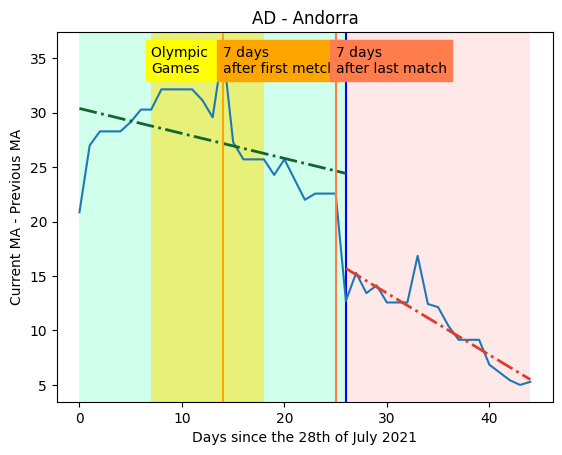

Trend negativo
La percentuale di cambiamento è: -515.23%
 
-3.284 x + 1561   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]   range(0, 32)   #116530
 
-20.2 x + 1889   [31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(31, 45)   #DB3F29


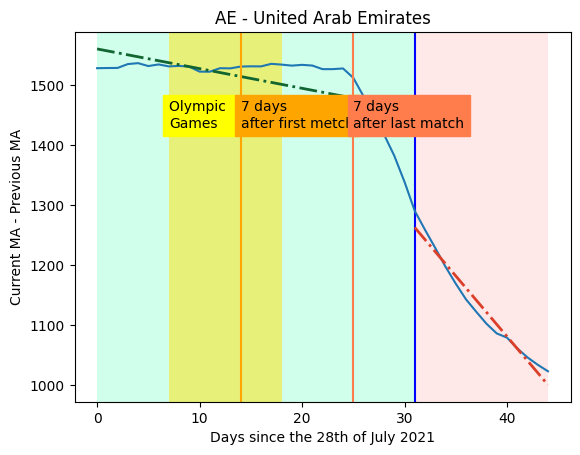

Trend negativo
La percentuale di cambiamento è: 80.07%
 
-54.69 x + 1153   [0 1 2 3 4 5 6 7 8 9]   range(0, 10)   #116530
 
-12.19 x + 642.6   [ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32
 33 34 35 36]   range(9, 37)   #D7A449
 
-2.429 x + 166.4   [36 37 38 39 40 41 42 43 44]   range(36, 45)   #DB3F29


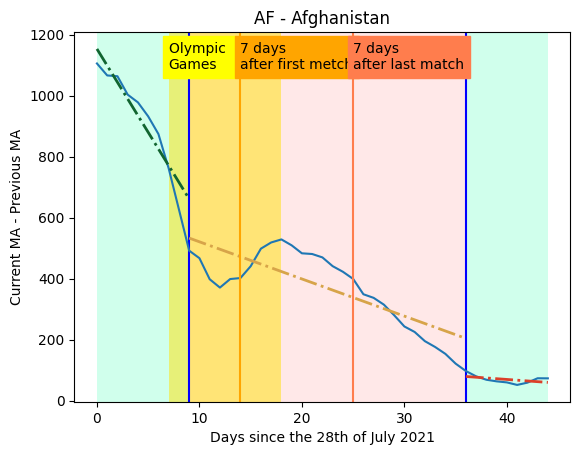

Trend positivo
La percentuale di cambiamento è: 545.90%
 
0.1393 x + 0.1486   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]   range(0, 25)   #116530
 
0.8994 x - 19.75   [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(24, 45)   #DB3F29


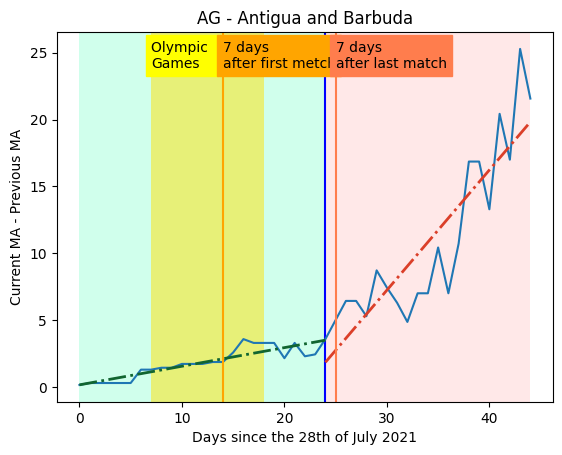

Trend positivo
La percentuale di cambiamento è: 5995.83%
 
-0.005042 x + 0.2164   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]   range(0, 17)   #116530
 
0.2973 x - 3.63   [16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32]   range(16, 33)   #DB3F29


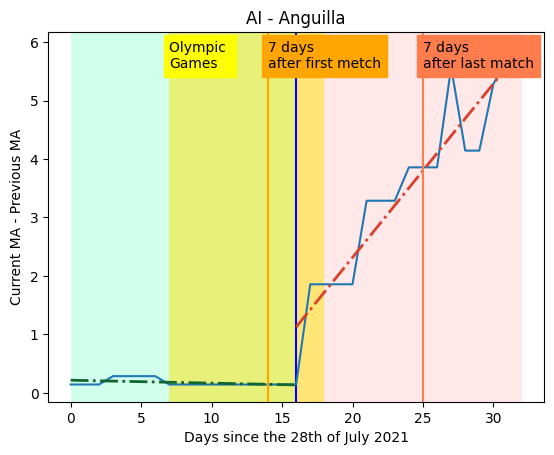

Trend positivo
La percentuale di cambiamento è: 1766.39%
 
1.434 x + 7.667   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]   range(0, 22)   #116530
 
26.76 x - 579   [21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(21, 45)   #DB3F29


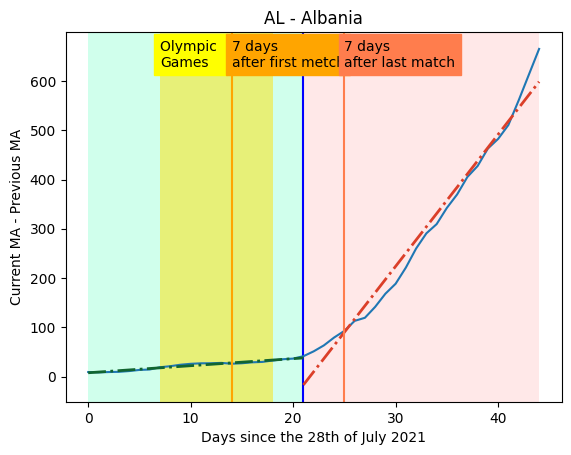

Trend positivo
La percentuale di cambiamento è: 173.76%
 
5.11 x + 136.2   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]   range(0, 28)   #116530
 
13.99 x - 91.63   [27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(27, 45)   #DB3F29


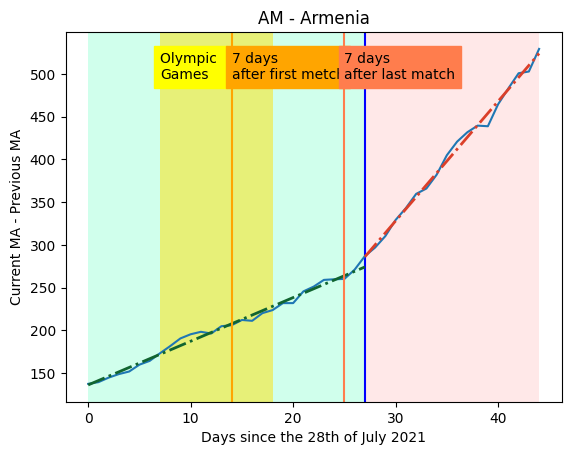

Trend positivo
La percentuale di cambiamento è: 7850.08%
 
-0.05339 x + 132.7   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34]   range(0, 35)   #116530
 
4.138 x + 21.72   [34 35 36 37 38 39 40 41 42 43 44]   range(34, 45)   #DB3F29


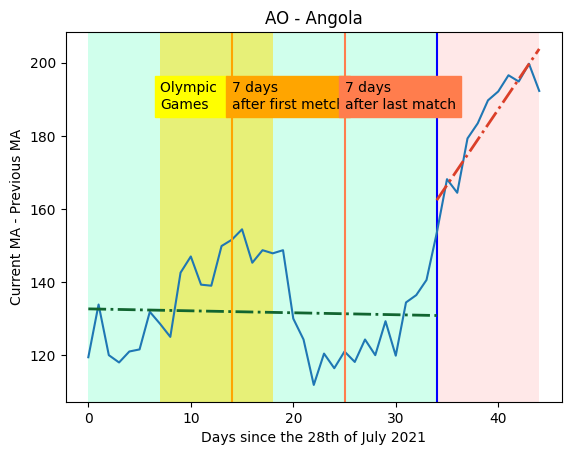

Trend negativo
La percentuale di cambiamento è: -30.06%
 
-155.4 x + 1.479e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]   range(0, 31)   #116530
 
-202.1 x + 1.456e+04   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


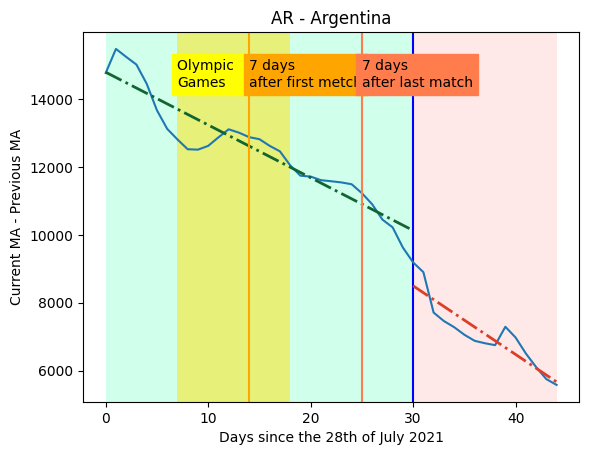

Trend positivo
La percentuale di cambiamento è: 295.87%
 
11.3 x + 238.6   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]   range(0, 29)   #116530
 
44.74 x - 638.4   [28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(28, 45)   #DB3F29


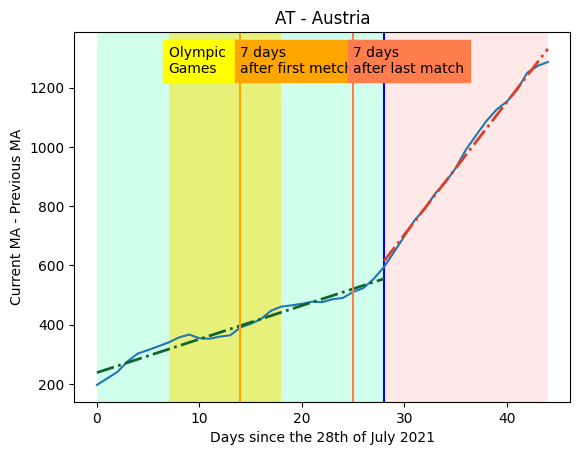

Trend positivo
La percentuale di cambiamento è: 346.55%
 
9.101 x + 68.69   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]   range(0, 31)   #116530
 
40.64 x - 832   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


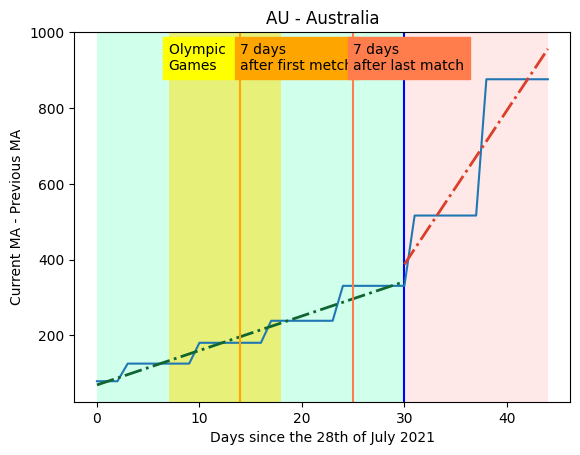

Trend positivo
La percentuale di cambiamento è: 163.64%
 
1.03 x + 3.106   [ 0  1  2  3  4  5  6  7  8  9 10 11 12]   range(0, 13)   #116530
 
2.717 x + 7.619   [12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35
 36 37 38 39 40 41 42 43 44]   range(12, 45)   #DB3F29


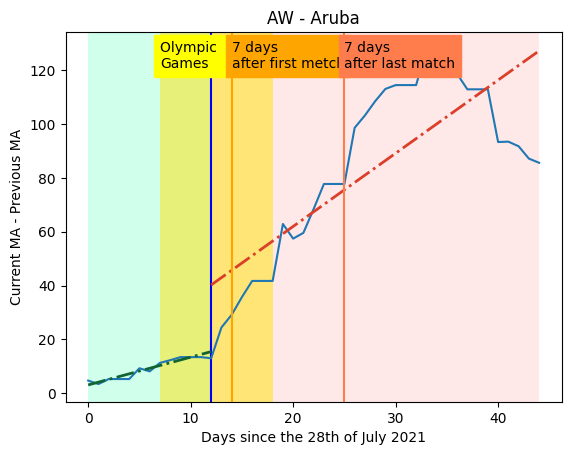

Trend positivo
La percentuale di cambiamento è: 773.05%
 
14.31 x + 117.1   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
125 x - 1724   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


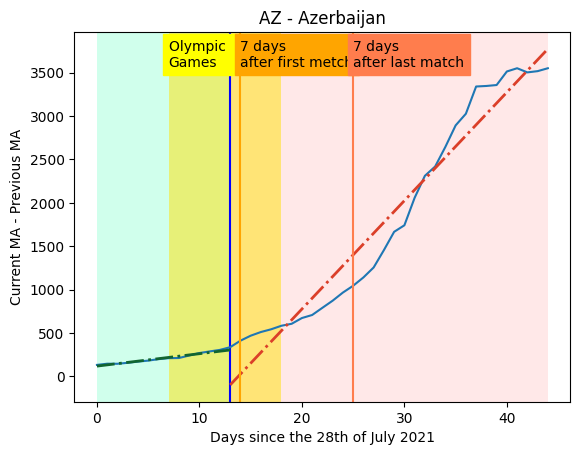

Trend positivo
La percentuale di cambiamento è: 3270.96%
 
0.4058 x + 17.39   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
13.68 x - 225.6   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


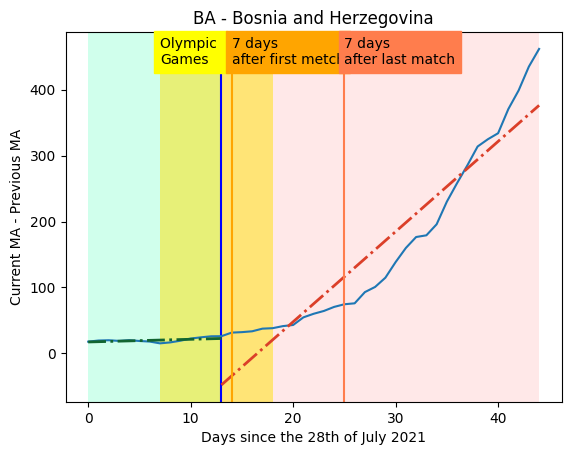

Trend positivo
La percentuale di cambiamento è: 329.83%
 
-0.1973 x + 14.03   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33]   range(0, 34)   #116530
 
0.4535 x - 2.438   [33 34 35 36 37 38 39 40 41 42 43 44]   range(33, 45)   #DB3F29


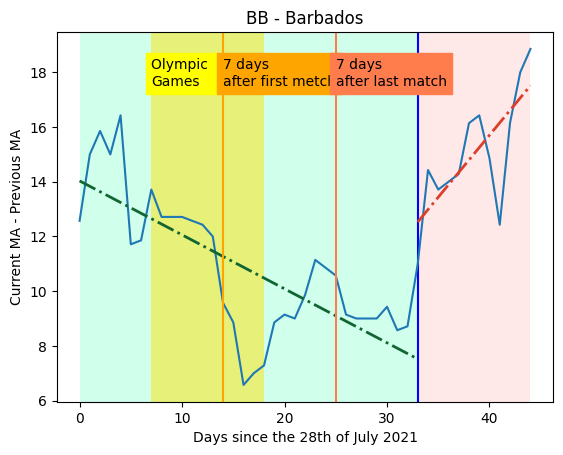

Trend negativo
La percentuale di cambiamento è: -1546.01%
 
22.98 x + 1.125e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32]   range(0, 33)   #116530
 
-332.3 x + 1.897e+04   [32 33 34 35 36 37 38 39 40 41 42 43 44]   range(32, 45)   #DB3F29


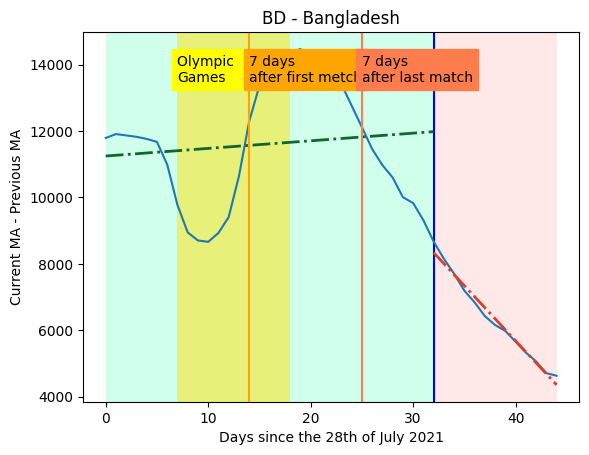

Trend positivo
La percentuale di cambiamento è: -12.38%
 
16.96 x + 1284   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]   range(0, 21)   #116530
 
14.86 x + 1397   [20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43
 44]   range(20, 45)   #DB3F29


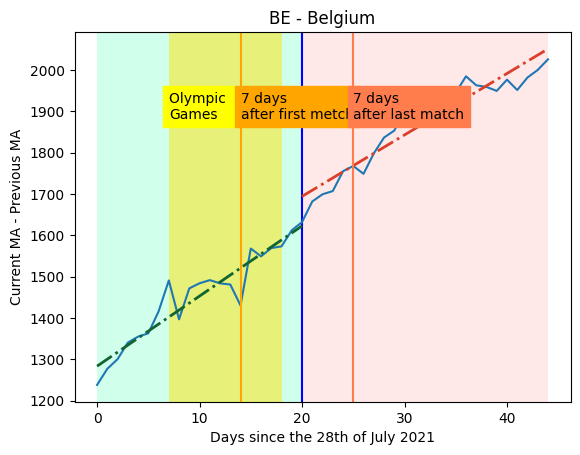

Trend positivo
La percentuale di cambiamento è: 161.79%
 
-0.1212 x + 3.012   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
0.07488 x + 4.156   [14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44]   range(14, 45)   #DB3F29


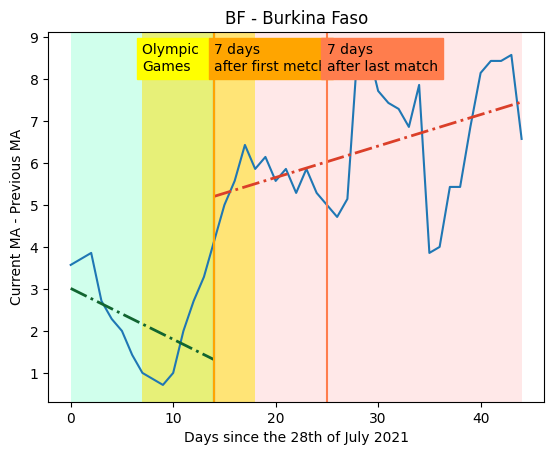

Trend positivo
La percentuale di cambiamento è: 1149.29%
 
3.3 x + 53.98   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]   range(0, 17)   #116530
 
41.23 x - 637.4   [16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39
 40 41 42 43 44]   range(16, 45)   #DB3F29


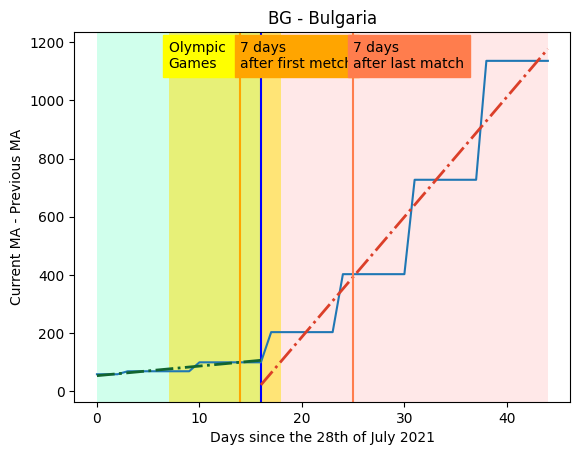

Trend negativo
La percentuale di cambiamento è: 80.86%
 
-0.8352 x + 97.98   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
-0.1598 x + 114.1   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


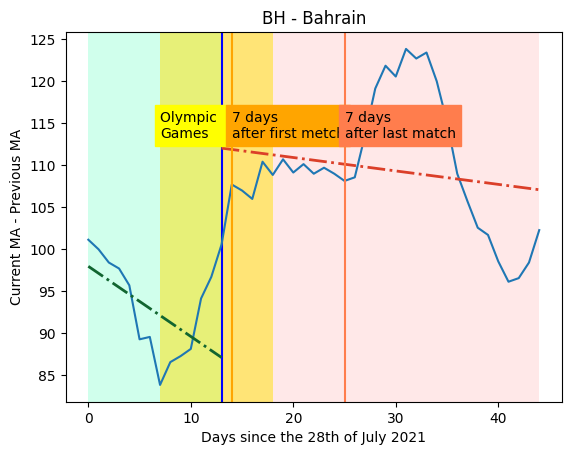

Trend positivo
La percentuale di cambiamento è: 34.18%
 
1.954 x + 25.89   [0 1 2 3 4 5 6 7]   range(0, 8)   #116530
 
2.622 x + 88.68   [ 7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30
 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(7, 45)   #DB3F29


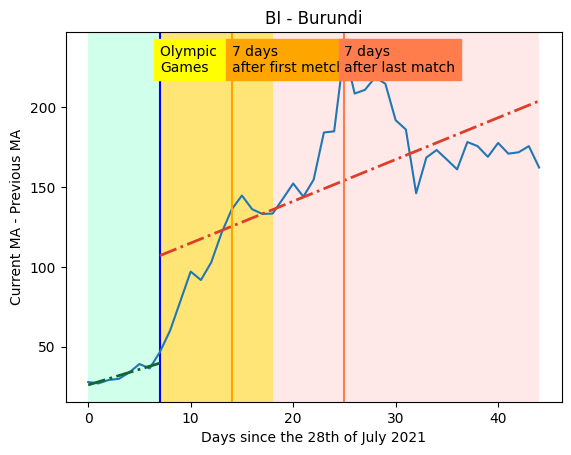

Trend positivo
La percentuale di cambiamento è: 1071338856981644800.00%
 
-2.416e-16 x + 2.429   [0 1 2 3 4]   range(0, 5)   #116530
 
2.589 x - 11.26   [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28]   range(4, 29)   #D7A449
 
20.02 x - 457.6   [28 29 30 31 32 33 34 35 36 37 38 39 40]   range(28, 41)   #DB3F29


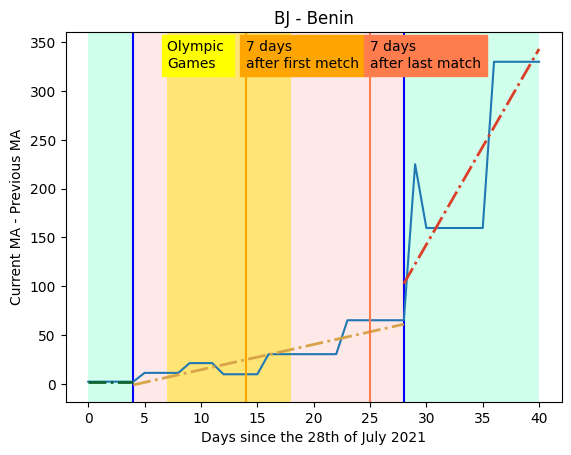

Trend negativo
La percentuale di cambiamento è: -5888.02%
 
0.01939 x + 0.8262   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]   range(0, 16)   #116530
 
-1.122 x + 49.6   [15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38
 39 40 41 42 43]   range(15, 44)   #DB3F29


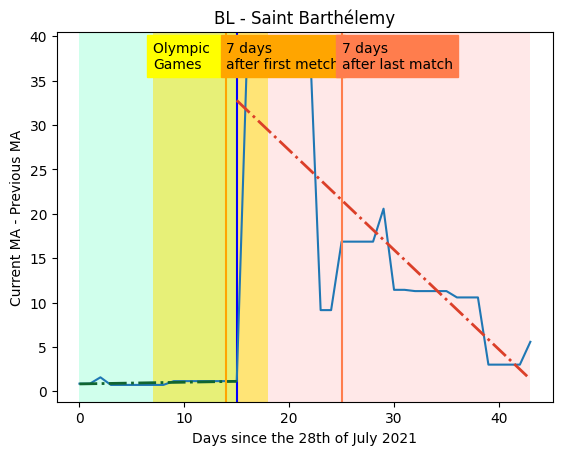

Trend positivo
La percentuale di cambiamento è: 1804.58%
 
0.01805 x + 1.078   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
0.3438 x - 2.166   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


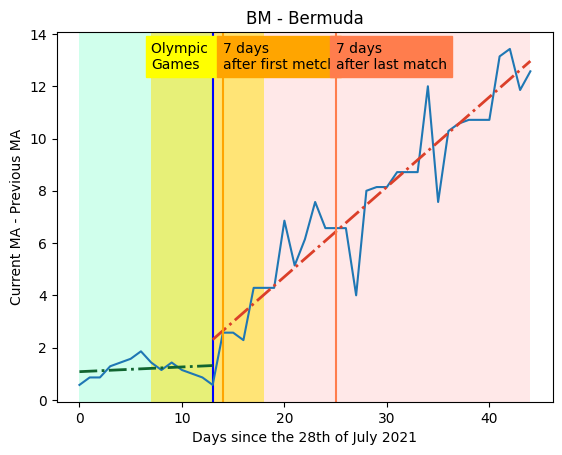

Trend positivo
La percentuale di cambiamento è: 8419.85%
 
-0.1098 x + 4.018   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]   range(0, 25)   #116530
 
9.131 x - 225.3   [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(24, 45)   #DB3F29


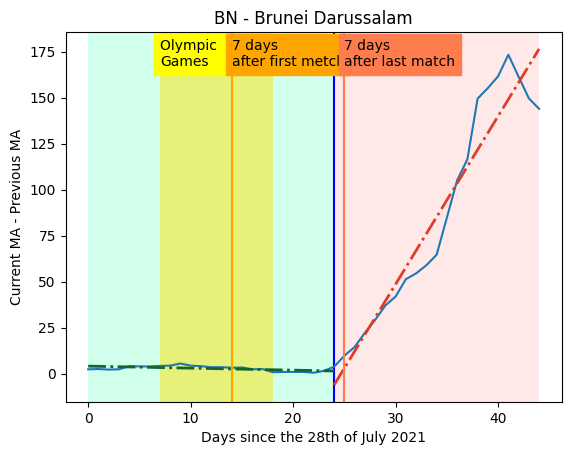

Trend negativo
La percentuale di cambiamento è: 81.81%
 
-26.21 x + 1232   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]   range(0, 22)   #116530
 
-4.767 x + 770.9   [21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(21, 45)   #DB3F29


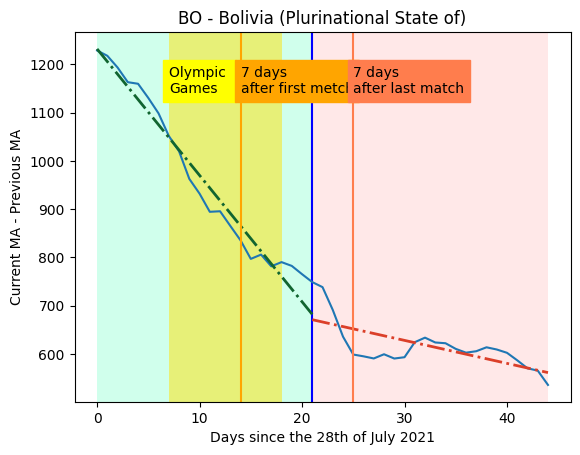

Trend negativo
La percentuale di cambiamento è: -186.59%
 
342.6 x + 3.988e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
-296.7 x + 4.013e+04   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


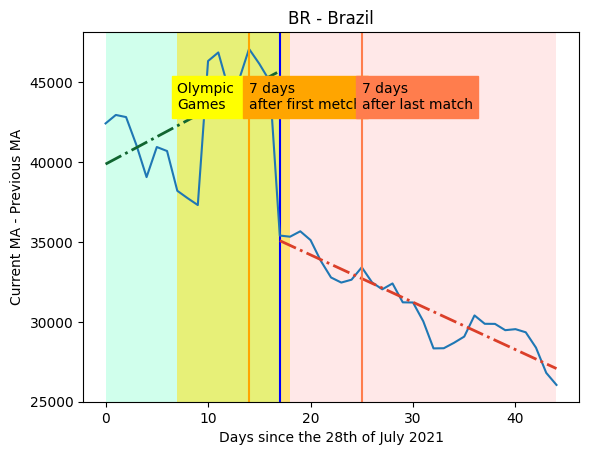

Trend positivo
La percentuale di cambiamento è: -74.32%
 
3.94 x + 41   [ 0  1  2  3  4  5  6  7  8  9 10 11 12]   range(0, 13)   #116530
 
1.012 x + 85.56   [12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35
 36 37 38 39 40 41 42 43 44]   range(12, 45)   #DB3F29


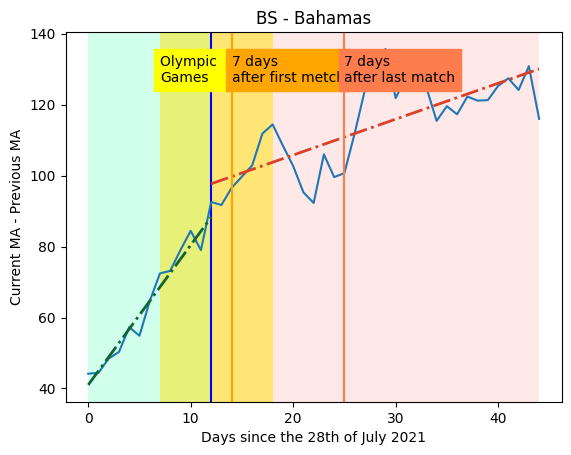

Trend negativo
La percentuale di cambiamento è: 85.71%
 
-0.4833 x + 16.33   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]   range(0, 37)   #116530
 
-0.06905 x + 4.524   [36 37 38 39 40 41 42 43 44]   range(36, 45)   #DB3F29


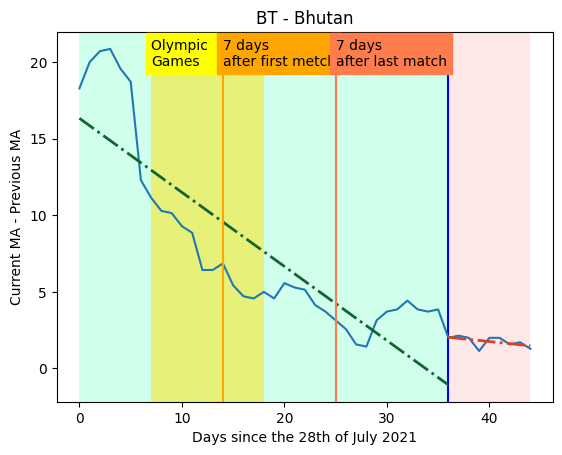

Trend negativo
La percentuale di cambiamento è: -409.15%
 
16 x + 1502   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34]   range(0, 35)   #116530
 
-49.45 x + 3096   [34 35 36 37 38 39 40 41 42 43 44]   range(34, 45)   #DB3F29


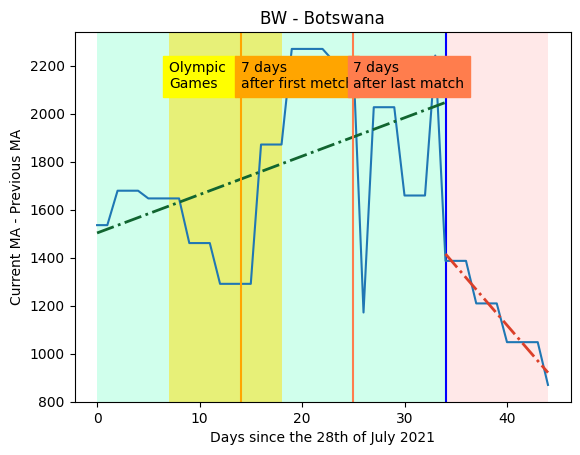

Trend positivo
La percentuale di cambiamento è: 620.37%
 
3.674 x + 886   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35]   range(0, 36)   #116530
 
26.47 x + 168.4   [35 36 37 38 39 40 41 42 43 44]   range(35, 45)   #DB3F29


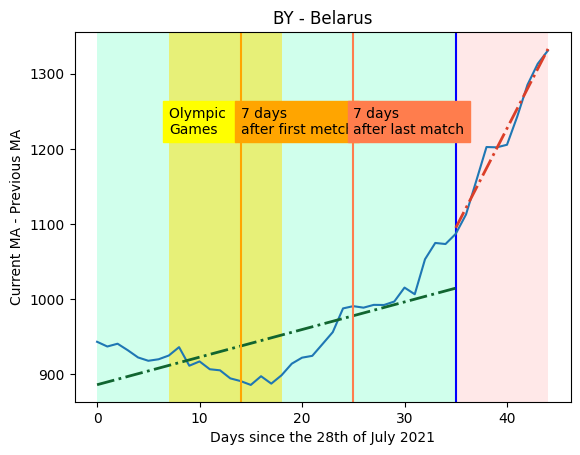

Trend positivo
La percentuale di cambiamento è: 279.99%
 
0.6215 x + 24.11   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]   range(0, 30)   #116530
 
2.362 x - 14.19   [29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(29, 45)   #DB3F29


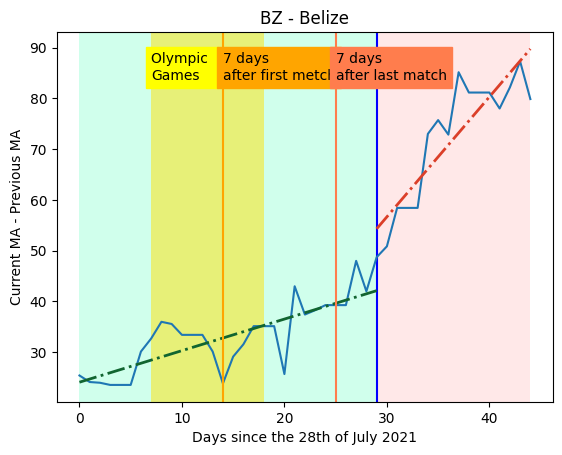

Trend positivo
La percentuale di cambiamento è: 1410.80%
 
5.37 x + 396.4   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]   range(0, 16)   #116530
 
81.13 x - 802.4   [15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38
 39 40 41 42 43 44]   range(15, 45)   #DB3F29


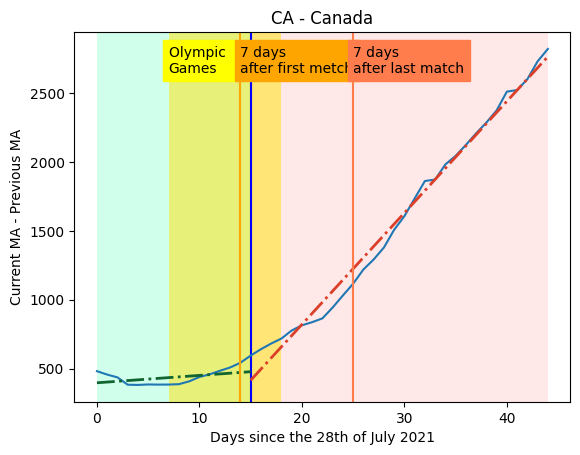

Trend negativo
La percentuale di cambiamento è: -234.23%
 
-1.638 x + 293   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]   range(0, 32)   #116530
 
-5.474 x + 354.9   [31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(31, 45)   #DB3F29


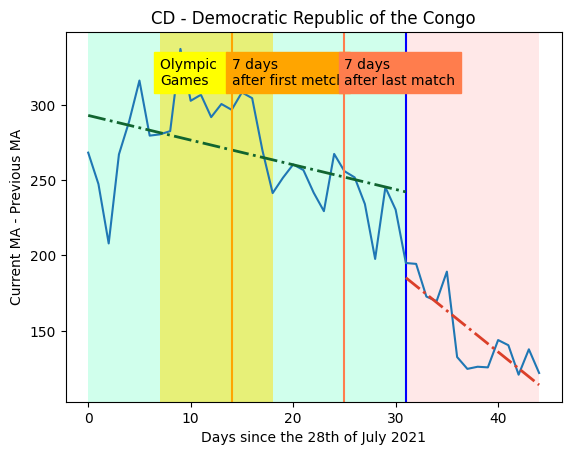

Trend positivo
La percentuale di cambiamento è: 31.41%
 
0.08819 x + 4.022   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33]   range(0, 34)   #116530
 
0.1159 x - 1.509   [33 34 35 36 37 38 39 40 41 42 43 44]   range(33, 45)   #DB3F29


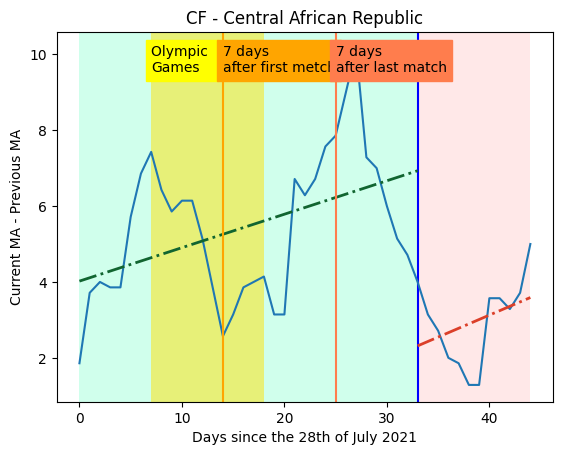

Trend positivo
La percentuale di cambiamento è: 141.42%
 
-0.3195 x + 18.27   [ 0  1  2  3  4  5  6  7  8  9 10 11]   range(0, 12)   #116530
 
0.1323 x + 8.513   [11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40 41 42 43 44]   range(11, 45)   #DB3F29


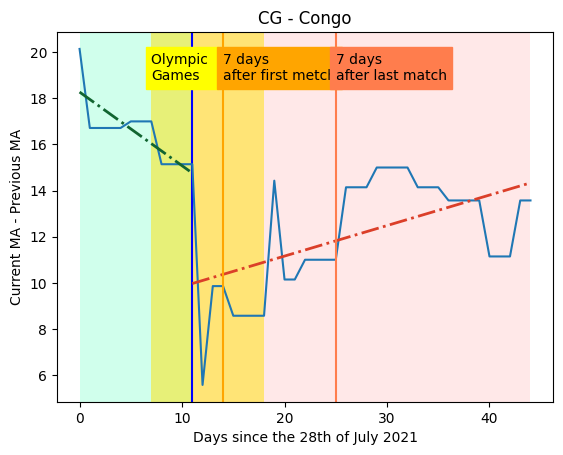

Trend positivo
La percentuale di cambiamento è: 302.93%
 
19.91 x + 460.3   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]   range(0, 26)   #116530
 
80.22 x - 623.3   [25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(25, 45)   #DB3F29


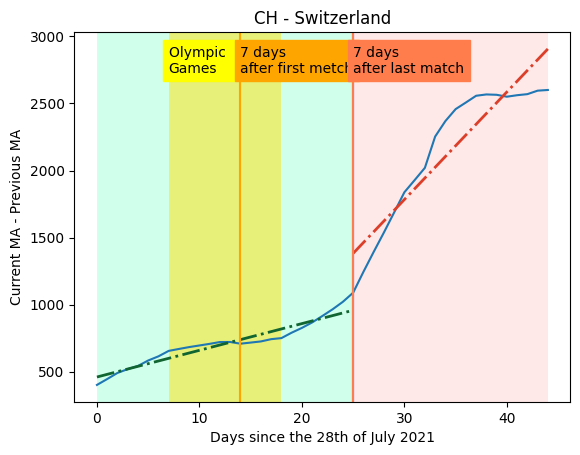

Trend positivo
La percentuale di cambiamento è: 54.34%
 
2.027 x + 38.9   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
3.129 x + 54.27   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


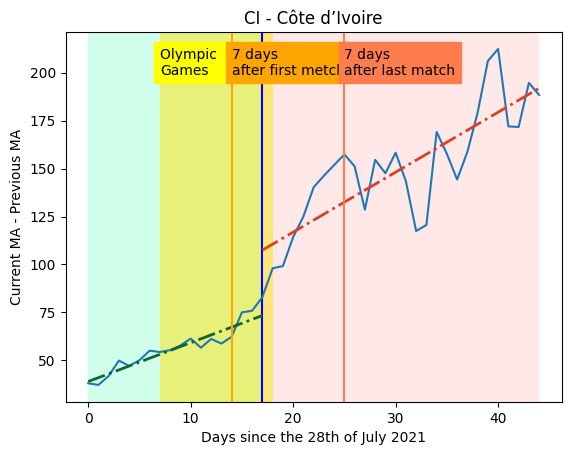

Trend negativo
La percentuale di cambiamento è: 66.28%
 
-57.68 x + 2042   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]   range(0, 20)   #116530
 
-19.45 x + 1436   [19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42
 43 44]   range(19, 45)   #DB3F29


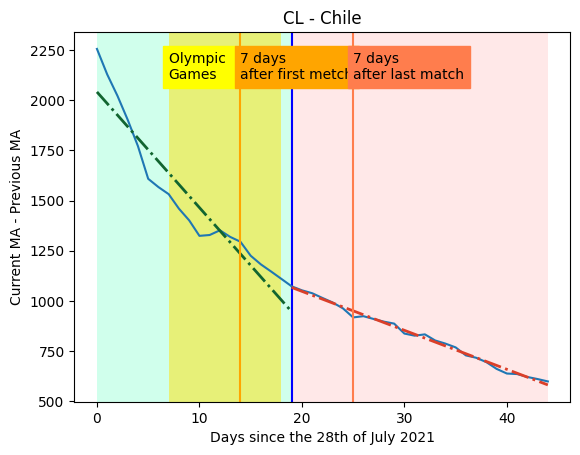

Trend positivo
La percentuale di cambiamento è: 4032.10%
 
0.105 x + 46.59   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]   range(0, 28)   #116530
 
4.339 x - 47.96   [27 28 29 30 31 32 33 34 35 36 37]   range(27, 38)   #DB3F29


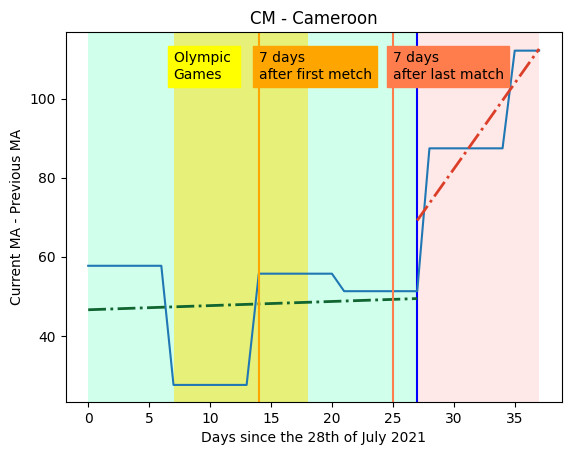

Trend negativo
La percentuale di cambiamento è: -232.40%
 
2.002 x + 54.69   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34]   range(0, 35)   #116530
 
-2.651 x + 150.5   [34 35 36 37 38 39 40 41 42 43 44]   range(34, 45)   #DB3F29


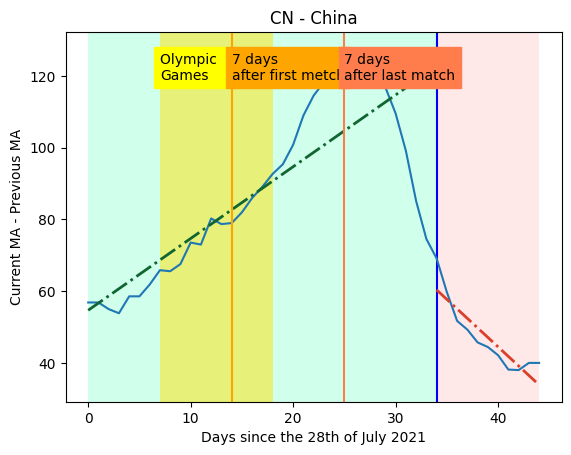

Trend negativo
La percentuale di cambiamento è: 62.55%
 
-605.1 x + 2.079e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
-402.4 x + 1.701e+04   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30]   range(13, 31)   #D7A449
 
-150.7 x + 9171   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


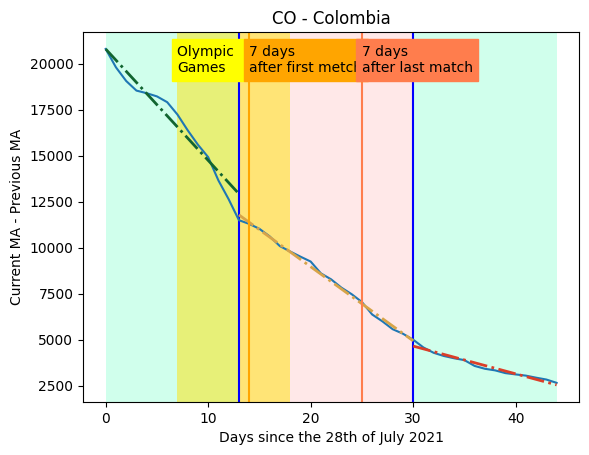

Trend positivo
La percentuale di cambiamento è: 2325.21%
 
1.071 x + 1273   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]   range(0, 28)   #116530
 
25.97 x + 825.2   [27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(27, 45)   #DB3F29


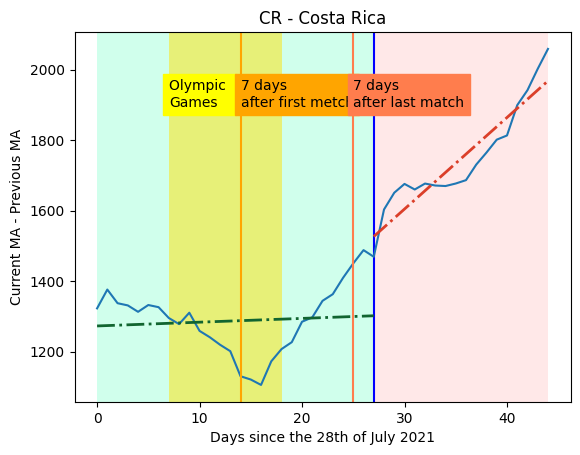

Trend positivo
La percentuale di cambiamento è: -62.51%
 
79.44 x + 6021   [ 0  1  2  3  4  5  6  7  8  9 10 11 12]   range(0, 13)   #116530
 
29.78 x + 8017   [12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35
 36 37 38 39 40 41 42 43 44]   range(12, 45)   #DB3F29


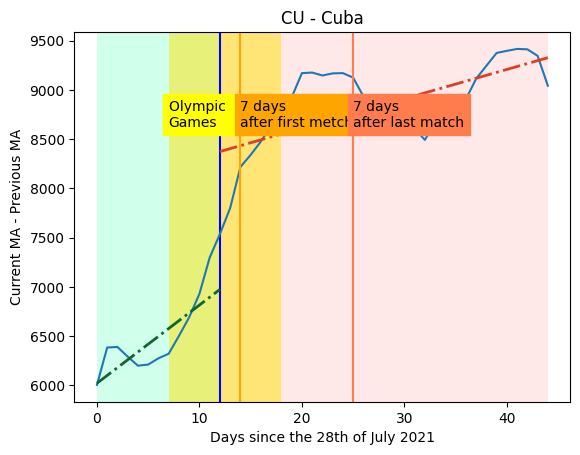

Trend positivo
La percentuale di cambiamento è: 358.44%
 
-0.3358 x + 42.69   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]   range(0, 31)   #116530
 
0.8679 x + 19.11   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


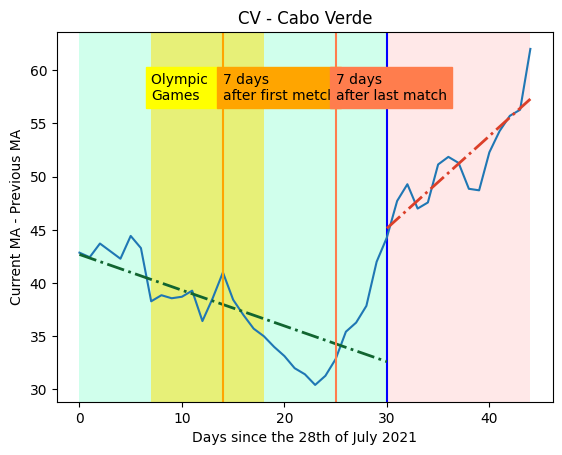

Trend negativo
La percentuale di cambiamento è: -107.46%
 
4.057 x + 11.49   [0 1 2 3 4 5]   range(0, 6)   #116530
 
-0.3025 x + 70.05   [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(5, 45)   #DB3F29


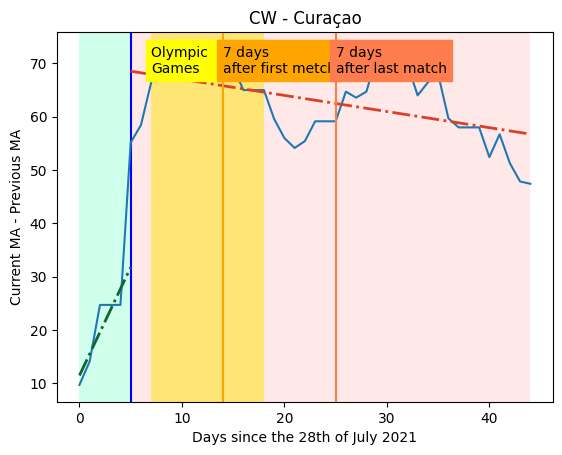

Trend negativo
La percentuale di cambiamento è: 6.83%
 
-14.54 x + 1048   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]   range(0, 19)   #116530
 
-13.54 x + 870.6   [18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44]   range(18, 45)   #DB3F29


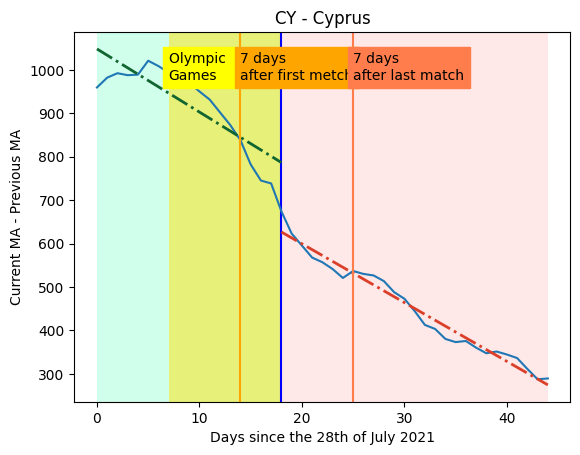

Trend positivo
La percentuale di cambiamento è: 108.18%
 
-3.29 x + 249.9   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
0.2691 x + 180.3   [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44]   range(10, 45)   #DB3F29


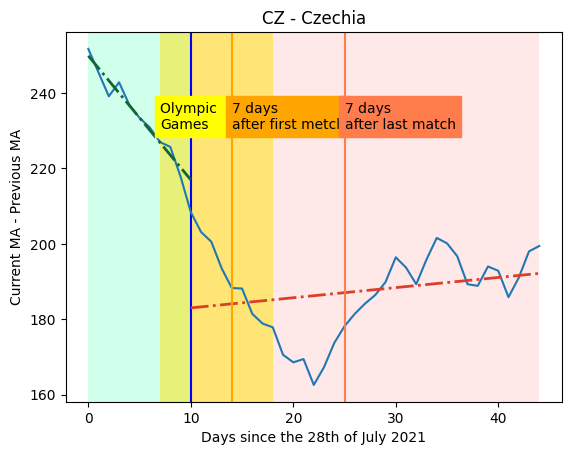

Trend positivo
La percentuale di cambiamento è: 294.80%
 
74.14 x + 831.2   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]   range(0, 31)   #116530
 
292.7 x - 5187   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


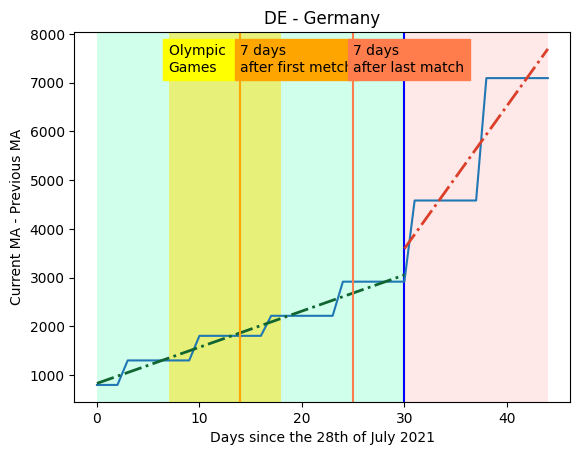

Trend positivo
La percentuale di cambiamento è: 178.36%
 
0.01157 x + 1.425   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]   range(0, 29)   #116530
 
0.03221 x + 1.42   [28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(28, 45)   #DB3F29


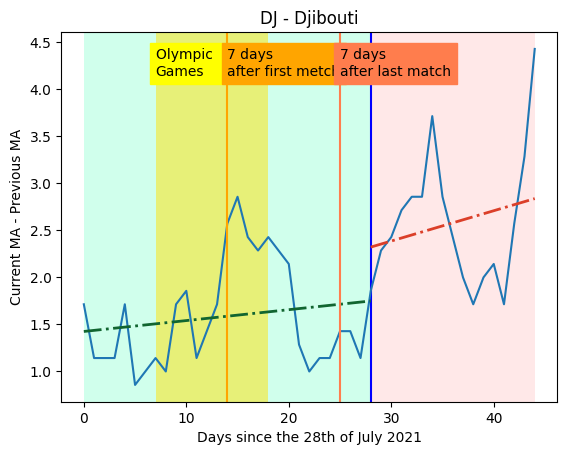

/usr/local/lib/python3.10/site-packages/numpy/lib/polynomial.py:668: RuntimeWarning: invalid value encountered in divide
  lhs /= scale


Error in  DK
 ** On entry to DLASCLS parameter number  4 had an illegal value
Trend positivo
La percentuale di cambiamento è: 10159.29%
 
0.01596 x + 0.6557   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]   range(0, 25)   #116530
 
1.638 x - 2.395   [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(24, 45)   #DB3F29


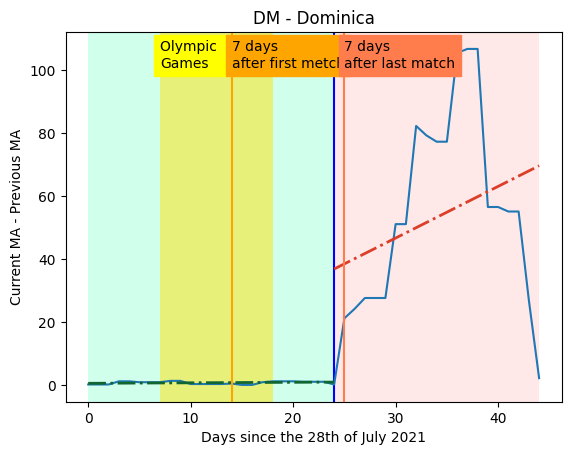

Trend negativo
La percentuale di cambiamento è: 88.26%
 
-36.15 x + 673.2   [0 1 2 3 4 5 6]   range(0, 7)   #116530
 
-4.245 x + 408.3   [ 6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29
 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(6, 45)   #DB3F29


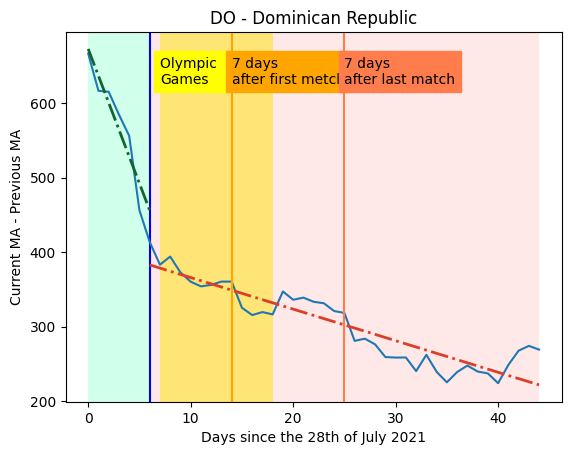

Trend negativo
La percentuale di cambiamento è: -511.16%
 
7.229 x + 1114   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]   range(0, 32)   #116530
 
-29.72 x + 1787   [31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(31, 45)   #DB3F29


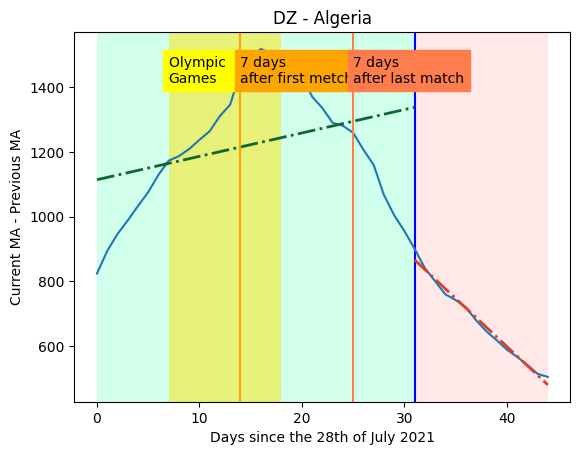

Trend negativo
La percentuale di cambiamento è: 77.58%
 
-16.14 x + 1079   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]   range(0, 27)   #116530
 
-3.617 x + 602.9   [26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(26, 45)   #DB3F29


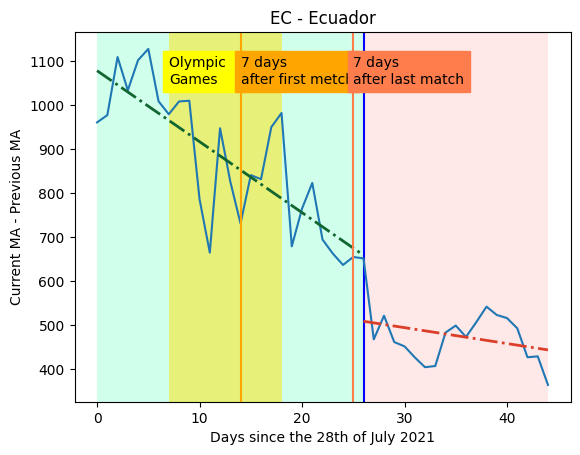

Trend positivo
La percentuale di cambiamento è: 38.48%
 
4.01 x + 35.98   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]   range(0, 17)   #116530
 
5.553 x + 65.22   [16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39
 40 41 42 43 44]   range(16, 45)   #DB3F29


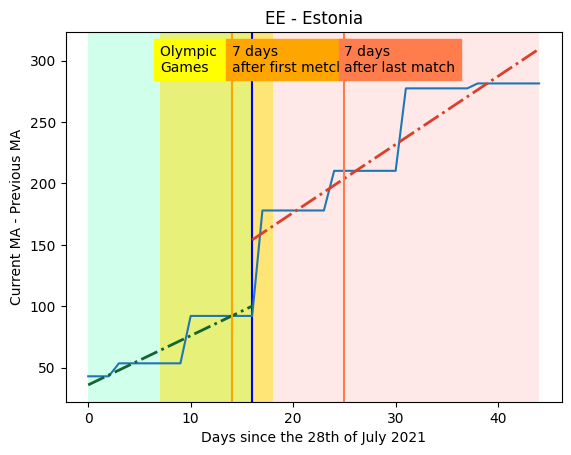

Trend positivo
La percentuale di cambiamento è: 147.60%
 
-7.704 x + 116.5   [0 1 2 3 4 5 6 7]   range(0, 8)   #116530
 
3.667 x - 11.15   [ 7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30
 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(7, 45)   #DB3F29


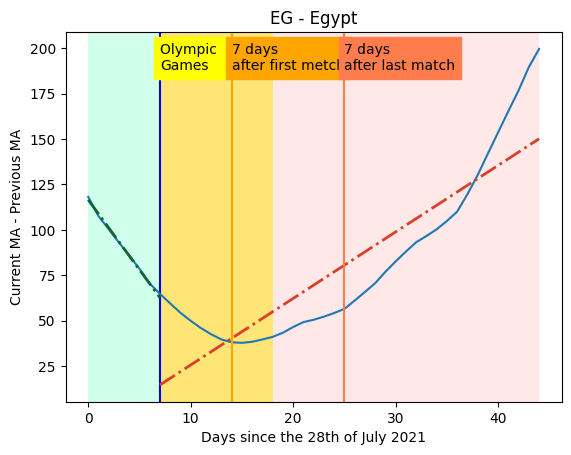

Trend negativo
La percentuale di cambiamento è: 90.97%
 
-0.743 x + 20.55   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]   range(0, 22)   #116530
 
-0.06708 x + 5.537   [21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(21, 45)   #DB3F29


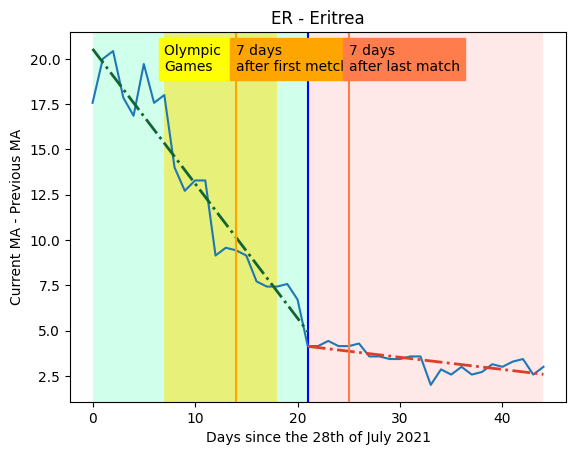

Trend negativo
La percentuale di cambiamento è: -1478.23%
 
33.52 x + 2.37e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]   range(0, 25)   #116530
 
-461.9 x + 2.896e+04   [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(24, 45)   #DB3F29


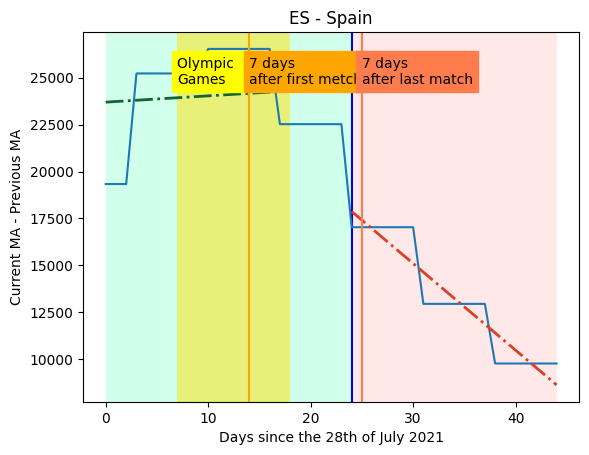

Trend positivo
La percentuale di cambiamento è: 1041.18%
 
2.952 x + 82.54   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
33.69 x - 323.3   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


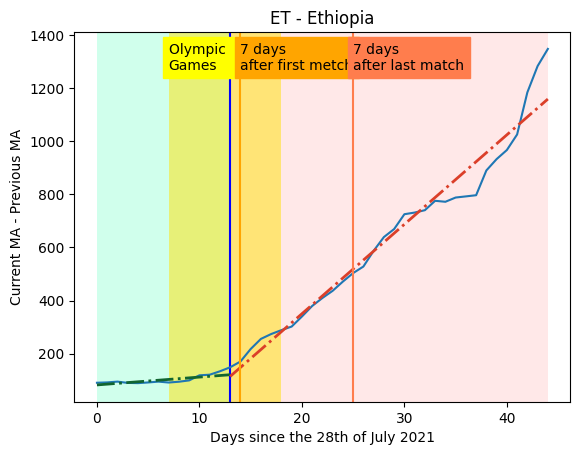

Trend positivo
La percentuale di cambiamento è: -91.87%
 
12.4 x + 262.6   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
1.008 x + 636   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


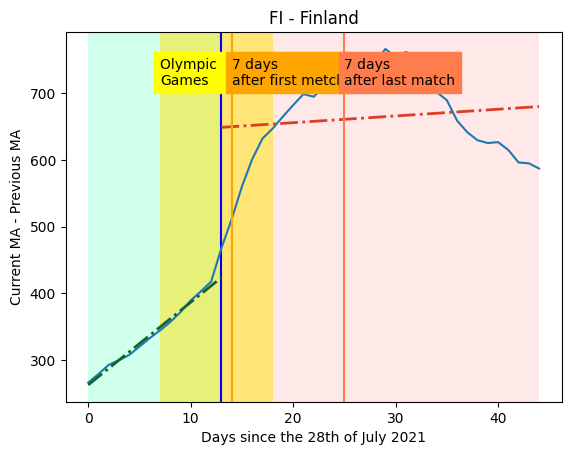

Trend negativo
La percentuale di cambiamento è: -1001.15%
 
1.286 x + 927.1   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]   range(0, 28)   #116530
 
-11.59 x + 887.8   [27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(27, 45)   #DB3F29


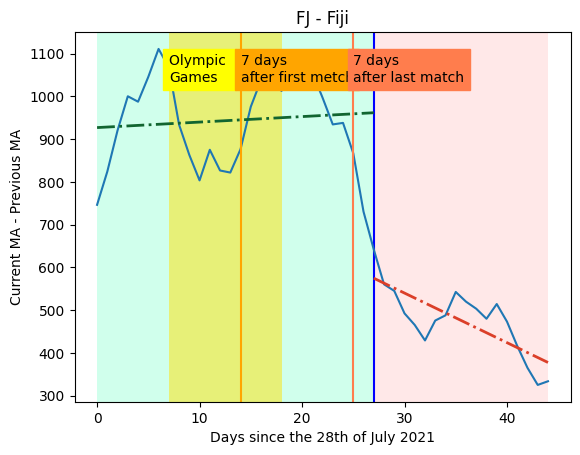

Error in  ** On entry to DLASCLS parameter number  4 had an illegal value
 FK
Trend negativo
La percentuale di cambiamento è: 90.99%
 
-0.5735 x + 12.27   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]   range(0, 16)   #116530
 
-0.05164 x + 2.424   [15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38
 39 40 41 42 43 44]   range(15, 45)   #DB3F29


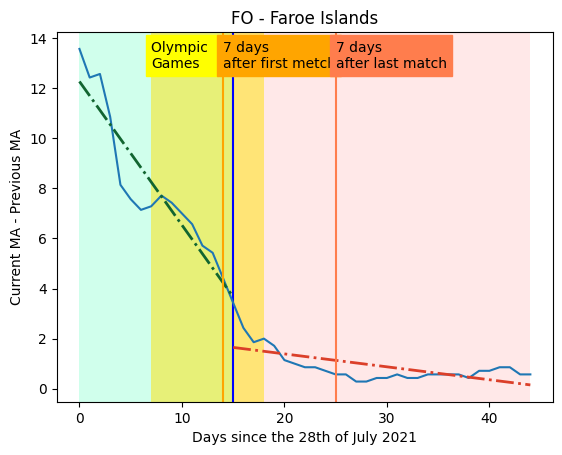

Trend positivo
La percentuale di cambiamento è: -82.10%
 
424.3 x + 3755   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
75.95 x + 1.775e+04   [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44]   range(10, 45)   #DB3F29


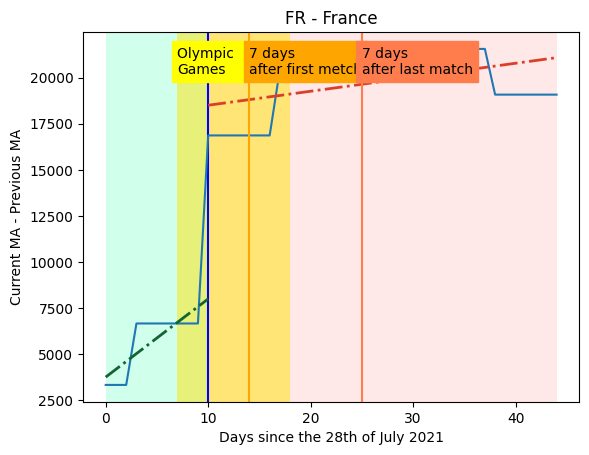

Trend positivo
La percentuale di cambiamento è: 339.45%
 
-0.1562 x + 12.63   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]   range(0, 28)   #116530
 
0.374 x + 2.222   [27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(27, 45)   #DB3F29


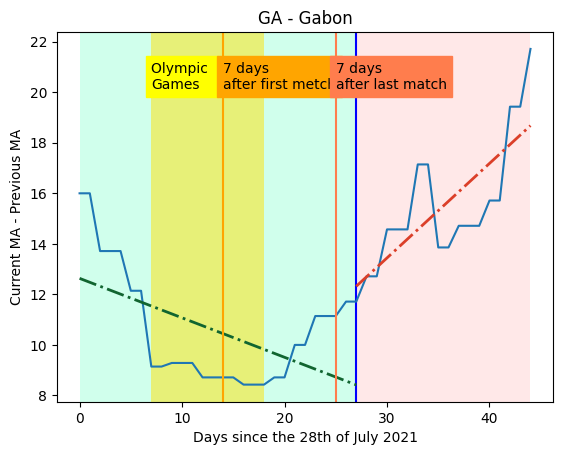

Trend positivo
La percentuale di cambiamento è: 15.82%
 
162.2 x + 4.282e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11]   range(0, 12)   #116530
 
187.9 x + 2.485e+04   [11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40 41 42 43 44]   range(11, 45)   #DB3F29


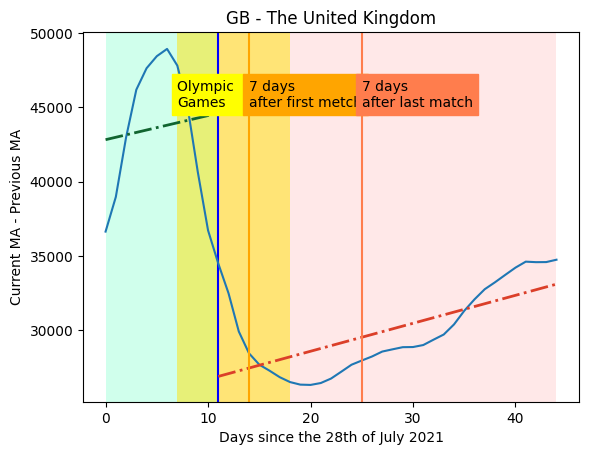

Trend positivo
La percentuale di cambiamento è: 2063.43%
 
0.01646 x + 0.1262   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]   range(0, 25)   #116530
 
0.05259 x - 0.1711   [24 25 26 27 28 29 30 31 32 33 34 35 36 37]   range(24, 38)   #D7A449
 
1.138 x - 40.24   [37 38 39 40 41 42 43 44]   range(37, 45)   #DB3F29


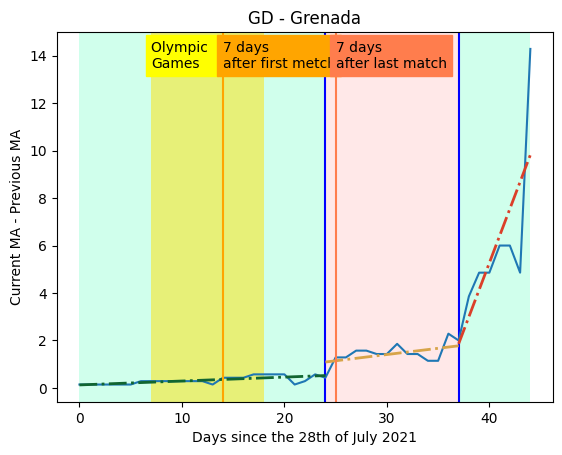

Trend positivo
La percentuale di cambiamento è: -41.35%
 
92.82 x + 1220   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]   range(0, 21)   #116530
 
54.44 x + 2582   [20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43
 44]   range(20, 45)   #DB3F29


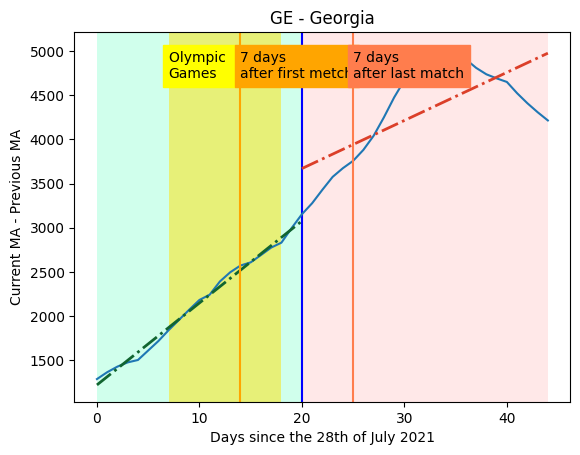

Trend positivo
La percentuale di cambiamento è: 247.11%
 
0.8976 x + 80.62   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]   range(0, 28)   #116530
 
3.116 x + 44.46   [27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(27, 45)   #DB3F29


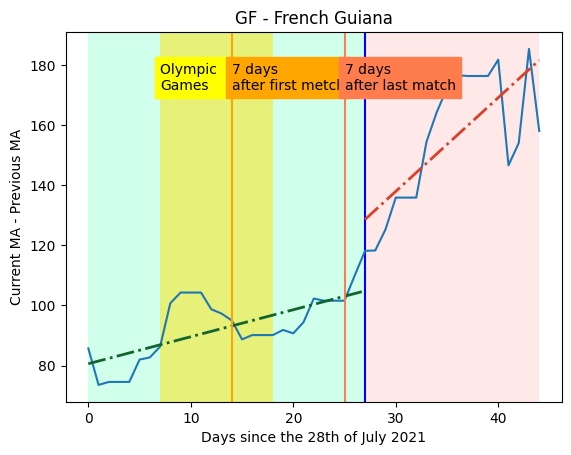

Trend positivo
La percentuale di cambiamento è: -56.35%
 
0.5 x + 1.262   [0 1 2 3]   range(0, 4)   #116530
 
0.2183 x + 2.775   [ 3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26
 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(3, 45)   #DB3F29


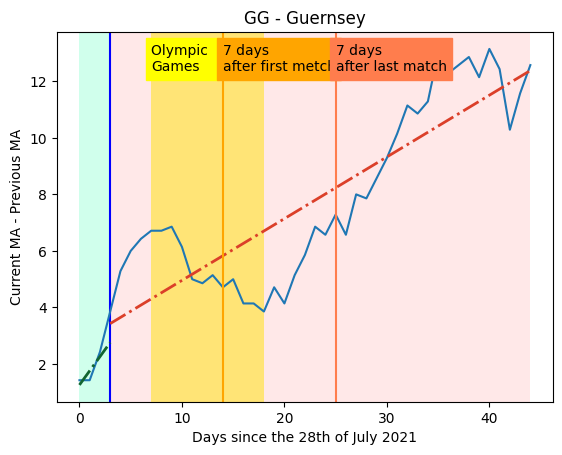

Trend negativo
La percentuale di cambiamento è: -1449.47%
 
0.2433 x + 288.9   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]   range(0, 21)   #116530
 
-3.283 x + 659.4   [20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43
 44]   range(20, 45)   #DB3F29


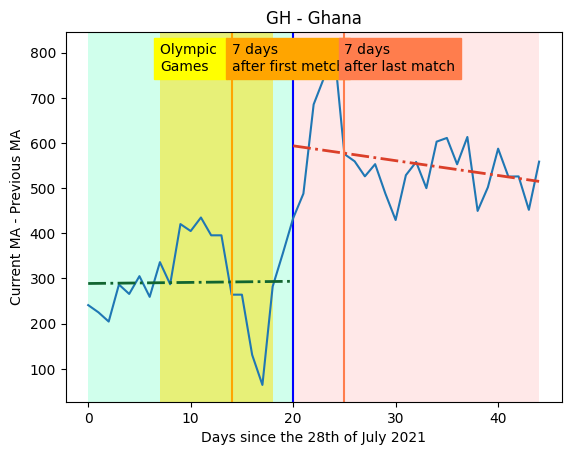

Trend negativo
La percentuale di cambiamento è: -16062.67%
 
-0.003273 x + 24.33   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]   range(0, 31)   #116530
 
-0.5291 x + 30.46   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


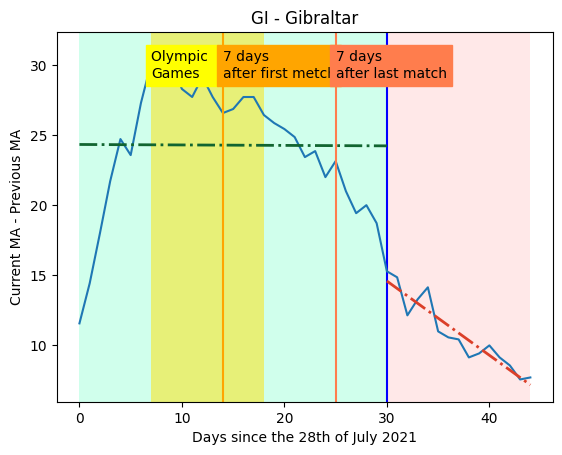

Trend negativo
La percentuale di cambiamento è: -192.99%
 
0.063 x + 2.436   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]   range(0, 23)   #116530
 
-0.05858 x + 10.1   [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(22, 45)   #DB3F29


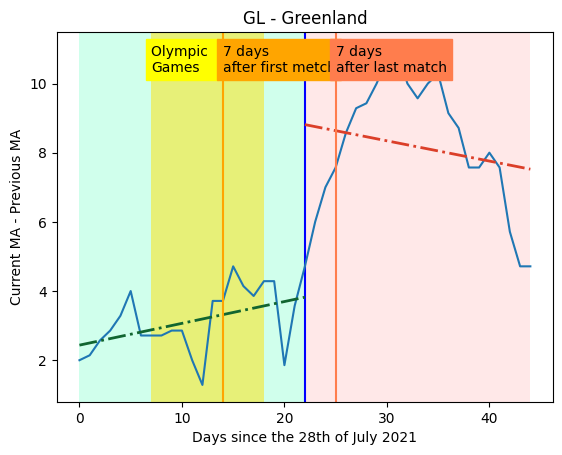

Trend negativo
La percentuale di cambiamento è: -550.18%
 
-0.2615 x + 87.09   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34]   range(0, 35)   #116530
 
-1.7 x + 98.99   [34 35 36 37 38 39 40 41 42 43 44]   range(34, 45)   #DB3F29


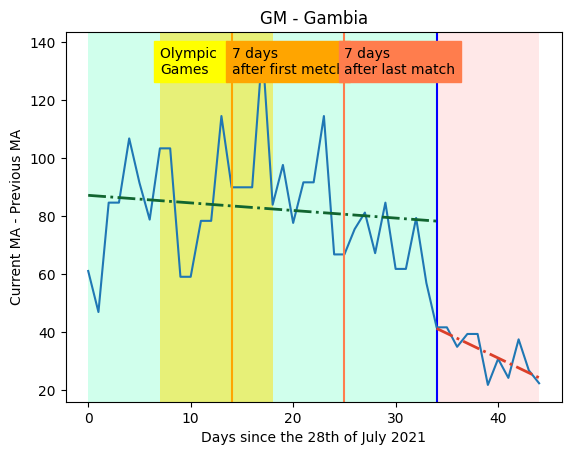

Trend negativo
La percentuale di cambiamento è: -39.56%
 
-0.8031 x + 72.08   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
-1.121 x + 161.4   [14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44]   range(14, 45)   #DB3F29


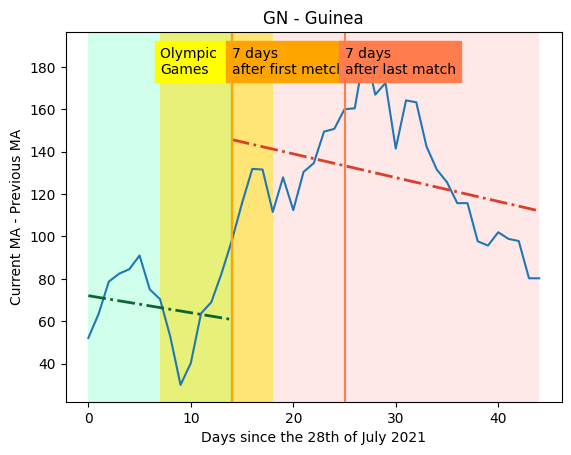

Trend positivo
La percentuale di cambiamento è: 1074.57%
 
2.176 x + 18.79   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]   range(0, 16)   #116530
 
25.56 x - 62.26   [15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38
 39 40 41 42 43 44]   range(15, 45)   #DB3F29


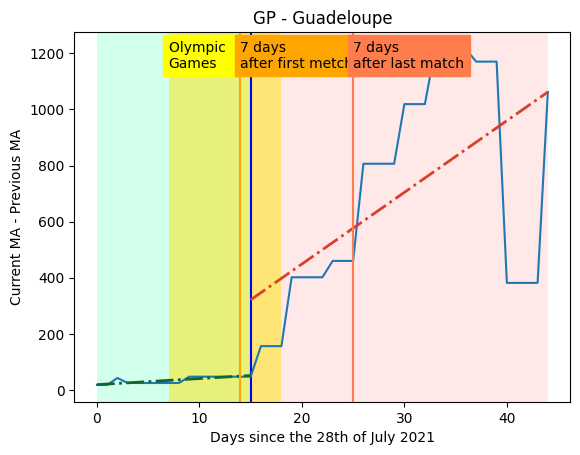

Trend positivo
La percentuale di cambiamento è: 15515.43%
 
-0.01238 x + 5.066   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34]   range(0, 35)   #116530
 
1.908 x - 57.09   [34 35 36 37 38 39 40 41 42 43 44]   range(34, 45)   #DB3F29


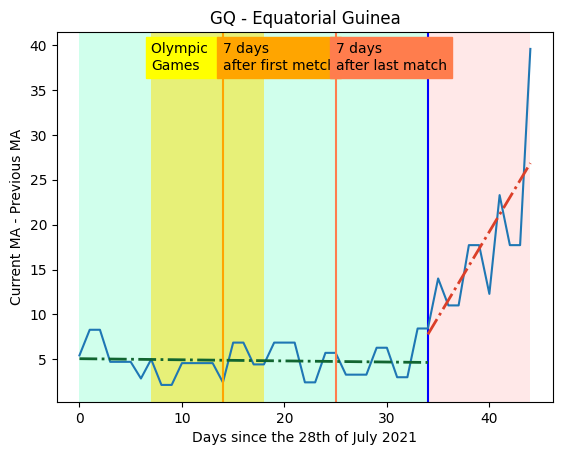

Trend positivo
La percentuale di cambiamento è: -60.09%
 
19.82 x + 2286   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]   range(0, 31)   #116530
 
7.911 x + 2890   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


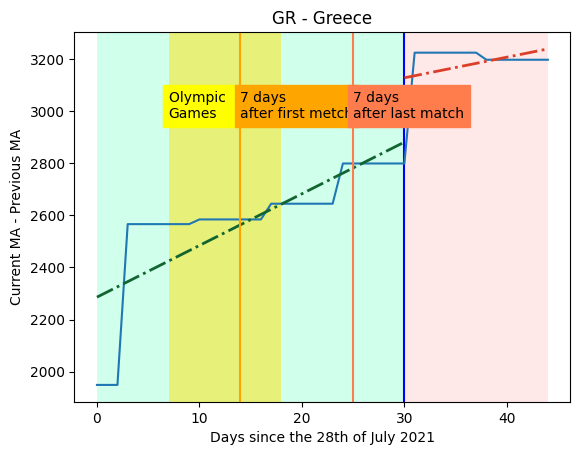

Trend positivo
La percentuale di cambiamento è: 238.77%
 
14.88 x + 2260   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]   range(0, 23)   #116530
 
50.4 x + 1718   [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(22, 45)   #DB3F29


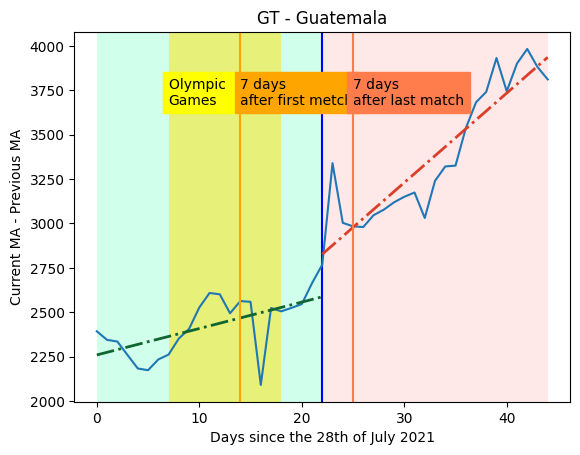

Trend positivo
La percentuale di cambiamento è: 7773.32%
 
-0.04423 x + 4.9   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]   range(0, 19)   #116530
 
3.394 x - 63.97   [18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44]   range(18, 45)   #DB3F29


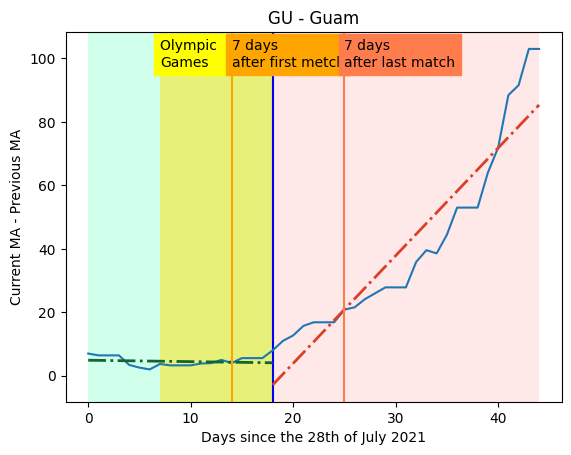

Trend positivo
La percentuale di cambiamento è: -51.90%
 
0.9955 x + 12.08   [ 0  1  2  3  4  5  6  7  8  9 10 11 12]   range(0, 13)   #116530
 
0.4788 x + 31.13   [12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35
 36 37 38 39 40 41 42 43 44]   range(12, 45)   #DB3F29


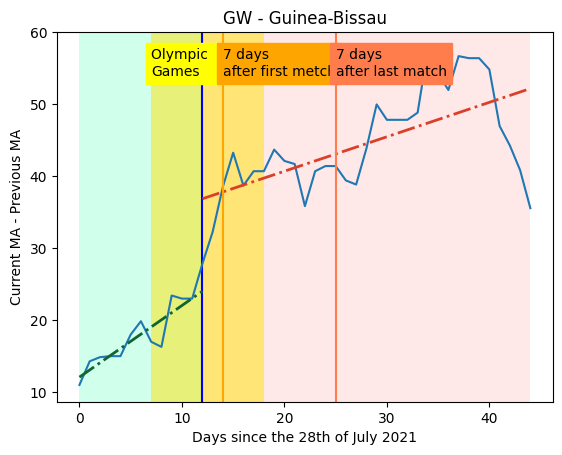

Trend positivo
La percentuale di cambiamento è: 1124.32%
 
-0.4977 x + 80.82   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35]   range(0, 36)   #116530
 
5.098 x - 92.05   [35 36 37 38 39 40 41 42 43 44]   range(35, 45)   #DB3F29


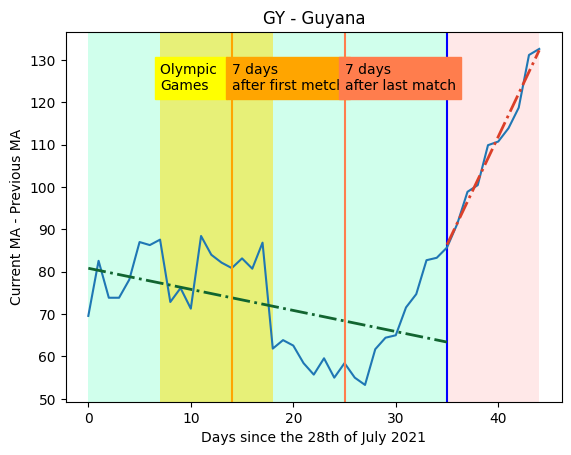

Trend positivo
La percentuale di cambiamento è: -83.19%
 
21.95 x + 808.3   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
3.689 x + 1299   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


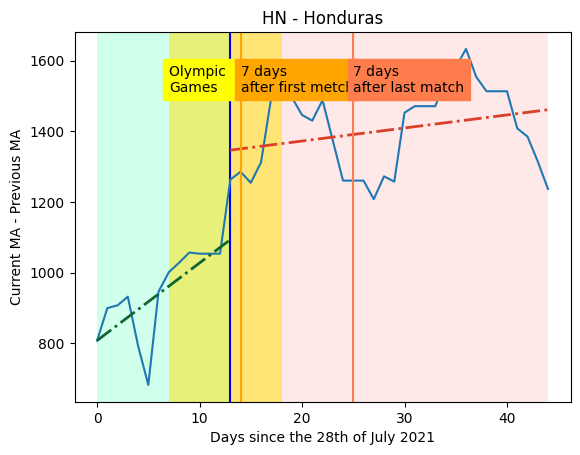

Trend positivo
La percentuale di cambiamento è: 333.22%
 
3.727 x + 95.56   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]   range(0, 30)   #116530
 
16.15 x - 241   [29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(29, 45)   #DB3F29


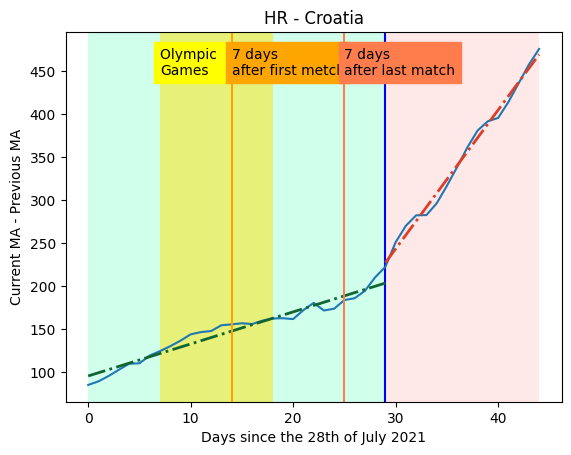

Trend negativo
La percentuale di cambiamento è: -9.53%
 
-0.4702 x + 42.42   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]   range(0, 27)   #116530
 
-0.515 x + 39.84   [26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(26, 45)   #DB3F29


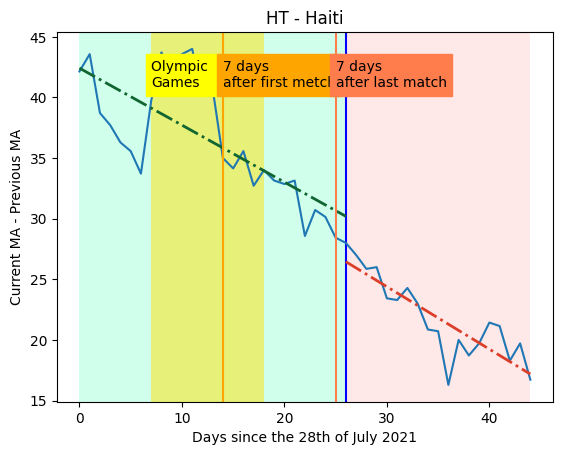

Trend positivo
La percentuale di cambiamento è: 787.00%
 
0.5236 x + 45.01   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]   range(0, 32)   #116530
 
4.644 x - 87.53   [31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(31, 45)   #DB3F29


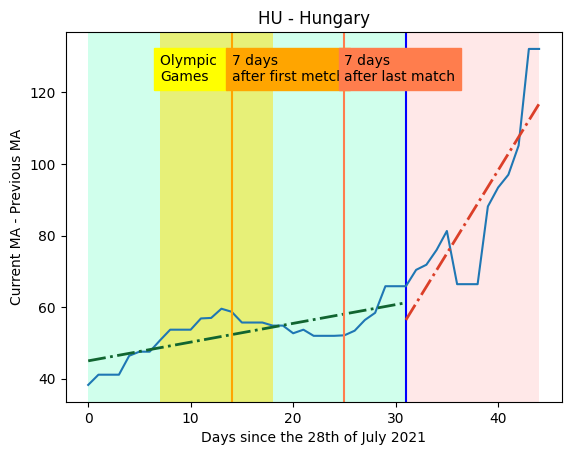

Trend negativo
La percentuale di cambiamento è: -50.13%
 
-666.3 x + 4.926e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]   range(0, 29)   #116530
 
-1000 x + 5.73e+04   [28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(28, 45)   #DB3F29


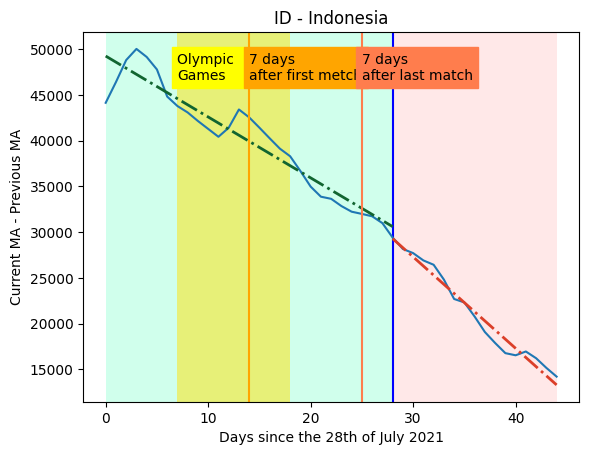

Trend positivo
La percentuale di cambiamento è: -34.59%
 
28.11 x + 777.1   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]   range(0, 26)   #116530
 
18.38 x + 1075   [25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(25, 45)   #DB3F29


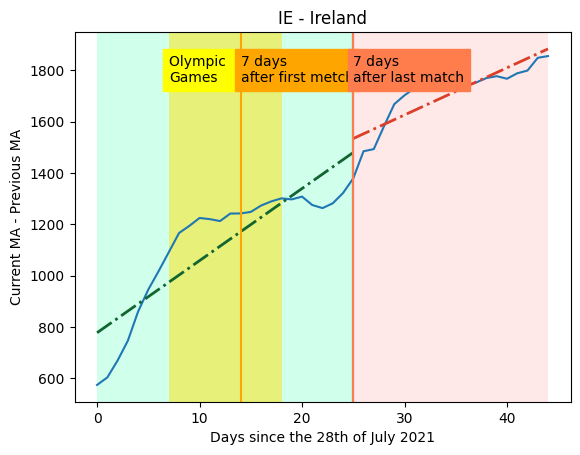

Trend positivo
La percentuale di cambiamento è: 116.55%
 
117.3 x + 272.3   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]   range(0, 27)   #116530
 
254.1 x - 2438   [26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(26, 45)   #DB3F29


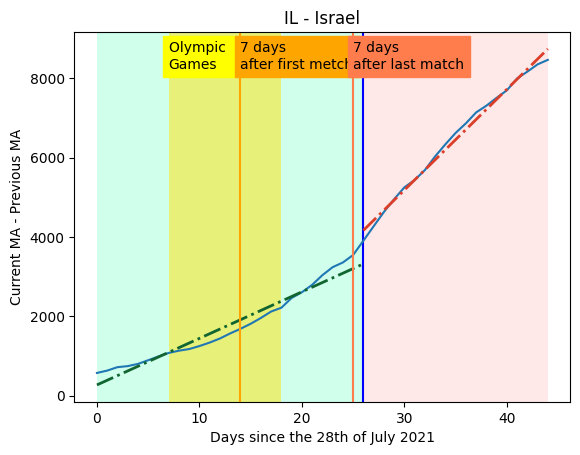

Trend negativo
La percentuale di cambiamento è: -48.31%
 
-1.071 x + 143.5   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]   range(0, 32)   #116530
 
-1.588 x + 114.1   [31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(31, 45)   #DB3F29


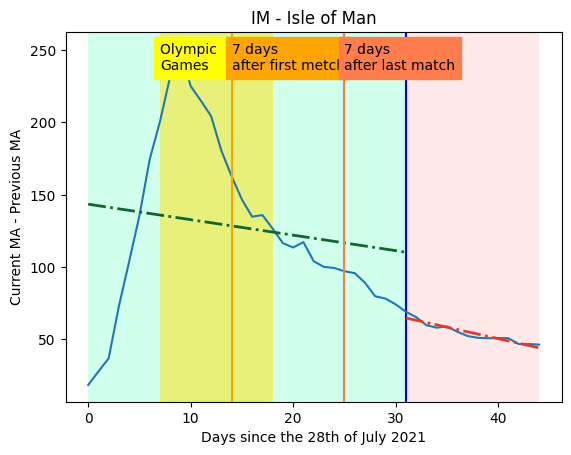

Trend positivo
La percentuale di cambiamento è: 919.92%
 
-79.85 x + 3.984e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]   range(0, 39)   #116530
 
654.7 x + 6695   [38 39 40 41 42 43 44]   range(38, 45)   #DB3F29


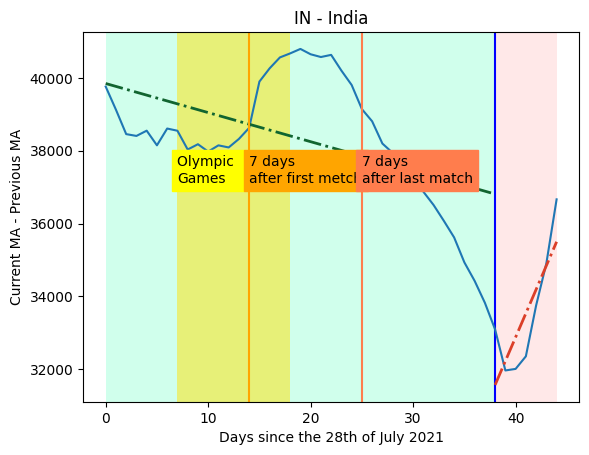

Trend negativo
La percentuale di cambiamento è: -663.94%
 
33.03 x + 9266   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]   range(0, 37)   #116530
 
-186.3 x + 1.455e+04   [36 37 38 39 40 41 42 43 44]   range(36, 45)   #DB3F29


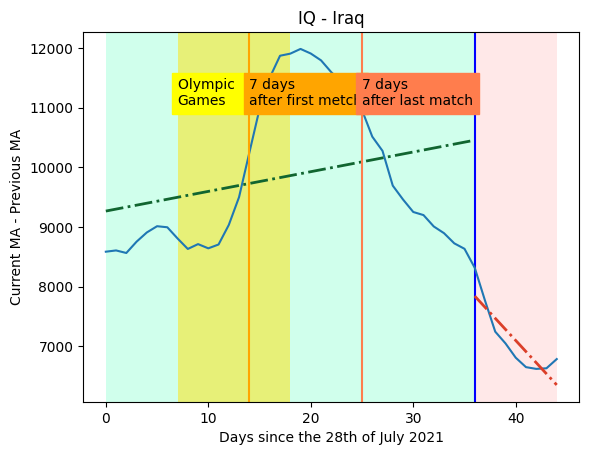

Trend positivo
La percentuale di cambiamento è: -53.92%
 
482.3 x + 1.931e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]   range(0, 16)   #116530
 
222.2 x + 2.864e+04   [15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38
 39 40 41 42 43 44]   range(15, 45)   #DB3F29


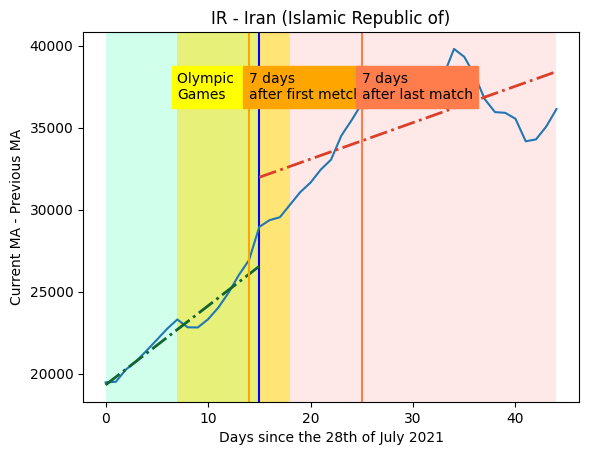

Trend positivo
La percentuale di cambiamento è: -72.26%
 
1.586 x + 4.276   [0 1 2 3 4 5 6 7 8 9]   range(0, 10)   #116530
 
0.4399 x + 83.04   [ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32
 33 34 35 36 37 38 39 40 41 42 43 44]   range(9, 45)   #DB3F29


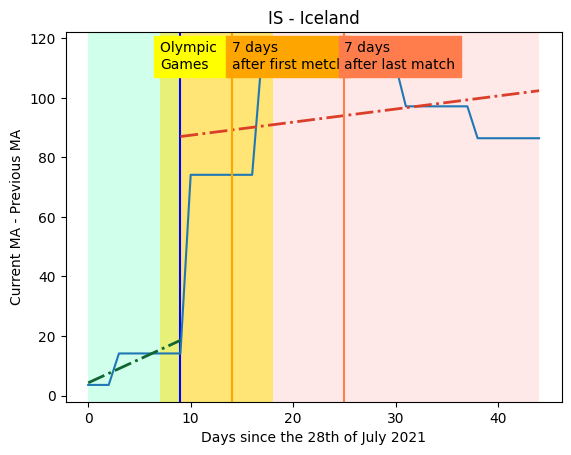

Trend positivo
La percentuale di cambiamento è: -77.47%
 
263.4 x + 1302   [ 0  1  2  3  4  5  6  7  8  9 10 11]   range(0, 12)   #116530
 
59.35 x + 4193   [11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40 41 42 43 44]   range(11, 45)   #DB3F29


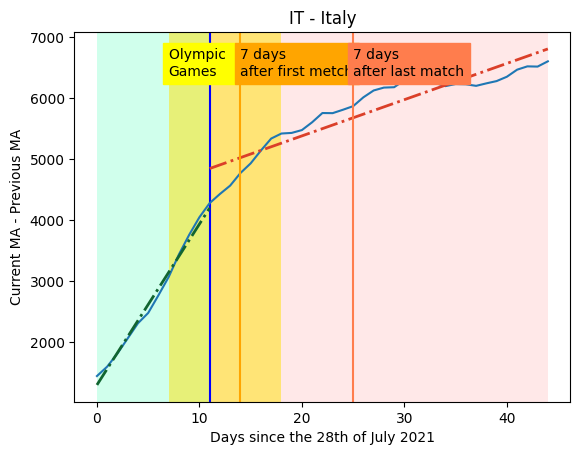

Trend negativo
La percentuale di cambiamento è: 97.59%
 
-9.844 x + 272.4   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]   range(0, 25)   #116530
 
-0.2373 x + 40.23   [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(24, 45)   #DB3F29


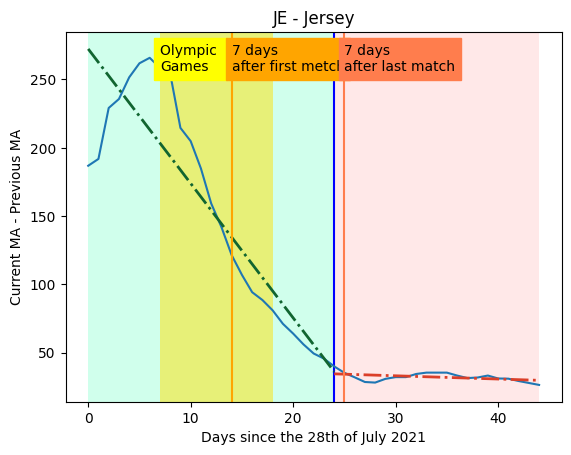

Trend positivo
La percentuale di cambiamento è: 163.74%
 
7.823 x + 32.95   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]   range(0, 29)   #116530
 
20.63 x - 232.3   [28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(28, 45)   #DB3F29


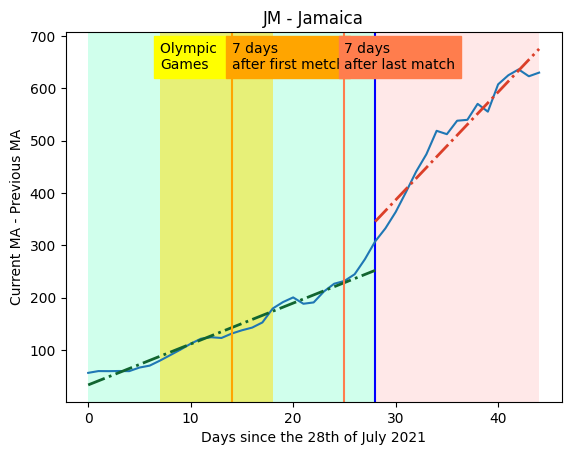

Trend positivo
La percentuale di cambiamento è: 103.57%
 
-8.522 x + 612.4   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
0.3039 x + 851.4   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


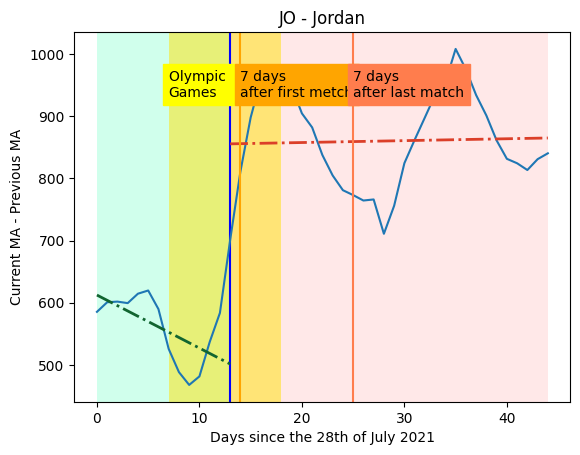

Trend positivo
La percentuale di cambiamento è: 197.21%
 
192 x + 2394   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
570.6 x - 690   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


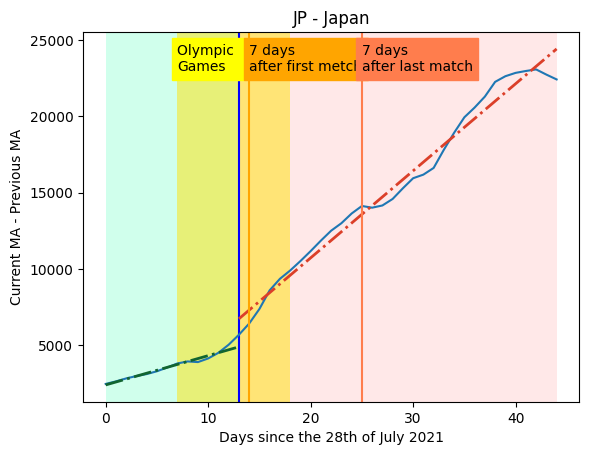

Trend positivo
La percentuale di cambiamento è: -38.05%
 
15.76 x + 489.3   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
9.764 x + 823.5   [14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44]   range(14, 45)   #DB3F29


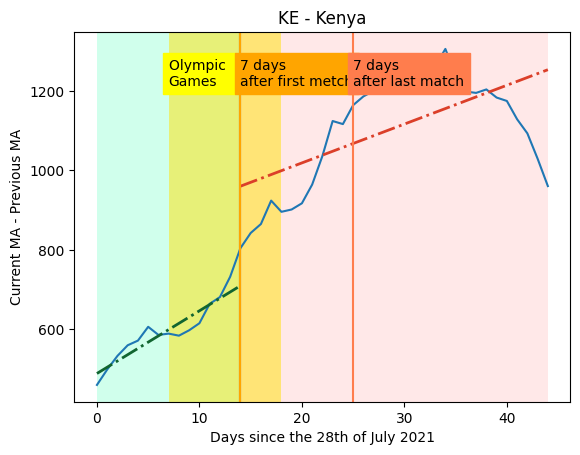

Trend negativo
La percentuale di cambiamento è: 38.98%
 
-25.36 x + 1424   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]   range(0, 32)   #116530
 
-15.48 x + 912.4   [31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(31, 45)   #DB3F29


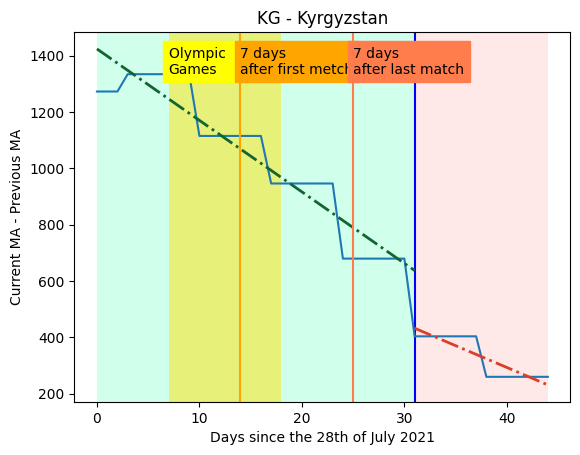

Trend negativo
La percentuale di cambiamento è: 56.93%
 
-12.58 x + 934.6   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]   range(0, 21)   #116530
 
-5.418 x + 706.4   [20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43
 44]   range(20, 45)   #DB3F29


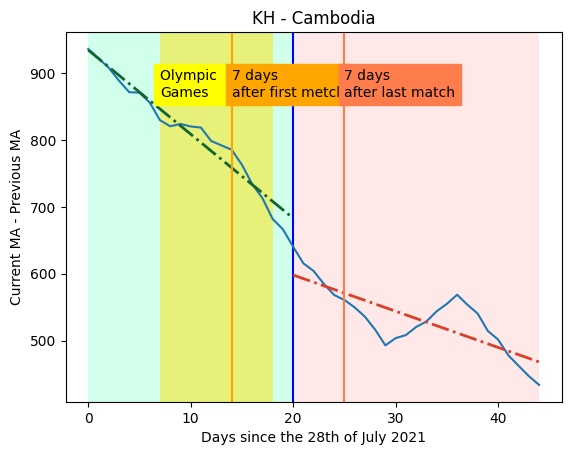

Trend positivo
La percentuale di cambiamento è: 136.37%
 
-0.1429 x + 3.176   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
0.05196 x - 0.5286   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


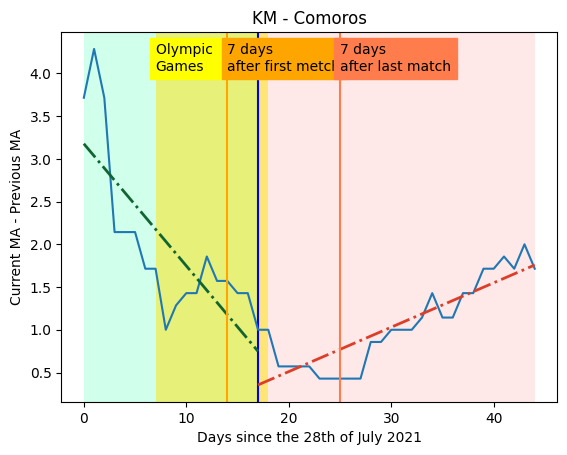

Trend positivo
La percentuale di cambiamento è: 9865.97%
 
0.02391 x + 2.734   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]   range(0, 32)   #116530
 
2.382 x - 70.46   [31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(31, 45)   #DB3F29


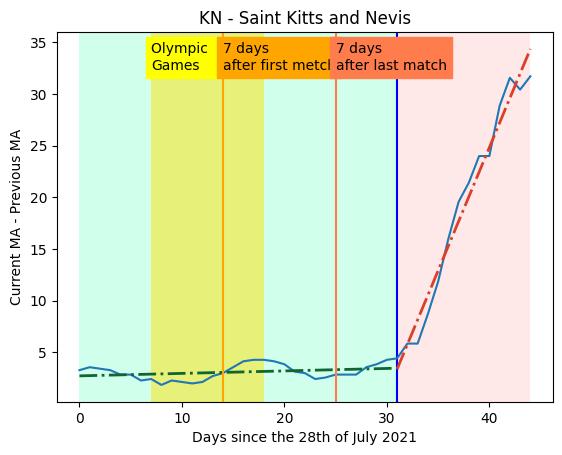

Trend positivo
La percentuale di cambiamento è: -85.39%
 
5.917 x + 1452   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]   range(0, 25)   #116530
 
0.8647 x + 1753   [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(24, 45)   #DB3F29


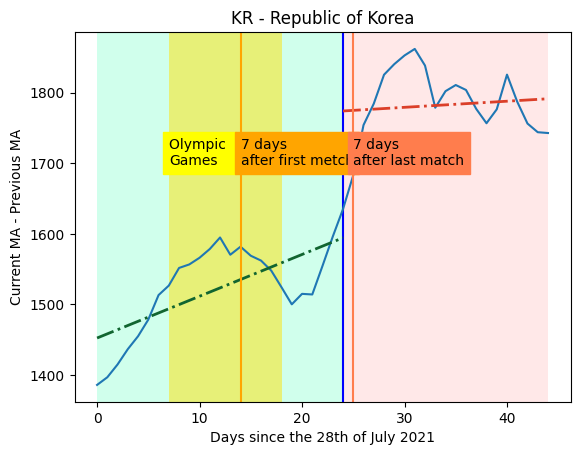

Trend negativo
La percentuale di cambiamento è: 41.08%
 
-33.48 x + 1483   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34]   range(0, 35)   #116530
 
-19.73 x + 1029   [34 35 36 37 38 39 40 41 42 43 44]   range(34, 45)   #DB3F29


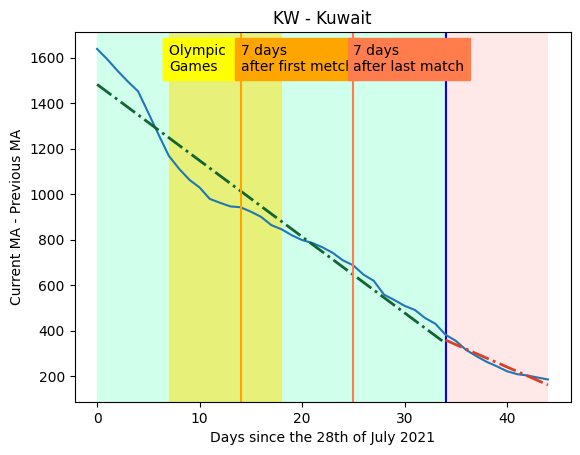

Trend positivo
La percentuale di cambiamento è: 1647.13%
 
0.08824 x + 0.6218   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
0.00623 x + 0.5635   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37]   range(17, 38)   #D7A449
 
0.1088 x - 2.765   [37 38 39 40 41 42 43 44]   range(37, 45)   #DB3F29


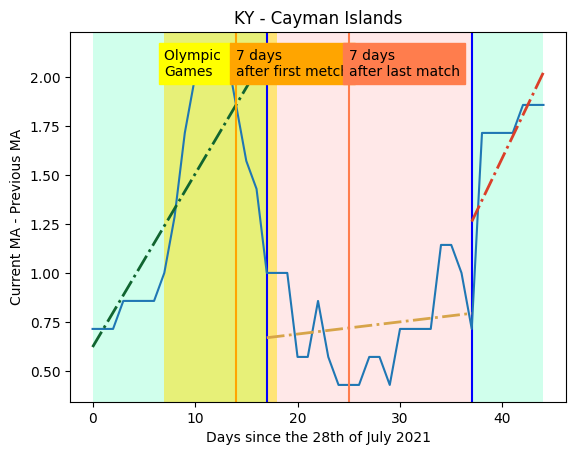

Trend negativo
La percentuale di cambiamento è: -104.31%
 
171 x + 4297   [ 0  1  2  3  4  5  6  7  8  9 10 11 12]   range(0, 13)   #116530
 
-7.364 x + 7713   [12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35
 36 37 38 39 40 41 42 43 44]   range(12, 45)   #DB3F29


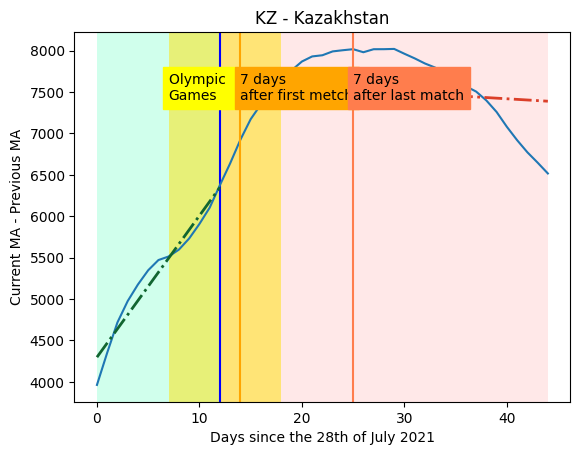

Trend positivo
La percentuale di cambiamento è: -42.16%
 
7.573 x + 82.12   [0 1 2 3 4 5 6 7 8]   range(0, 9)   #116530
 
4.38 x + 155.4   [ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31
 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(8, 45)   #DB3F29


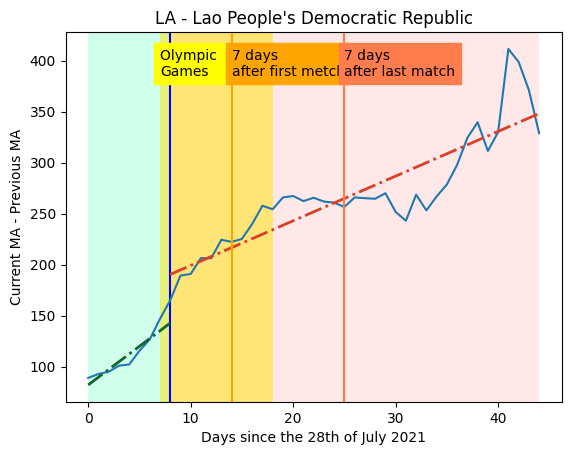

Trend positivo
La percentuale di cambiamento è: -25.03%
 
21.14 x + 356.4   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
15.85 x + 816.9   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


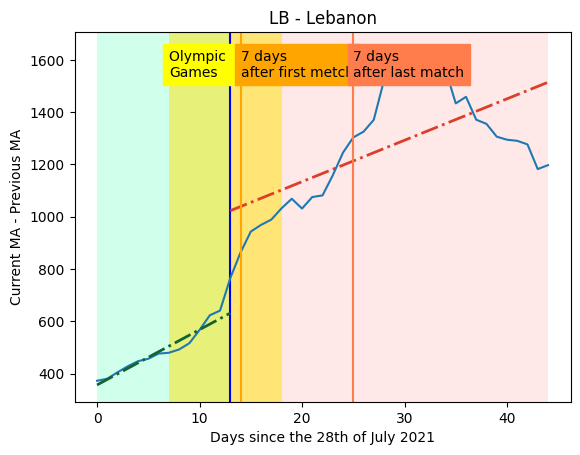

Trend positivo
La percentuale di cambiamento è: 1671.86%
 
-0.3176 x + 11.02   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
4.992 x - 88.33   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


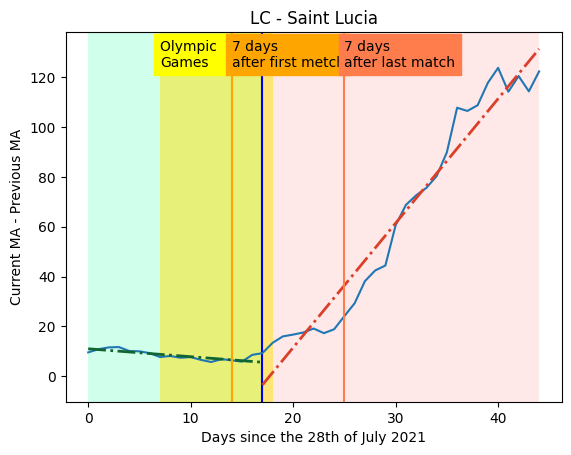

Trend positivo
La percentuale di cambiamento è: 43465.91%
 
-0.0003297 x + 1.918   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]   range(0, 26)   #116530
 
0.143 x + 3.203   [25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(25, 45)   #DB3F29


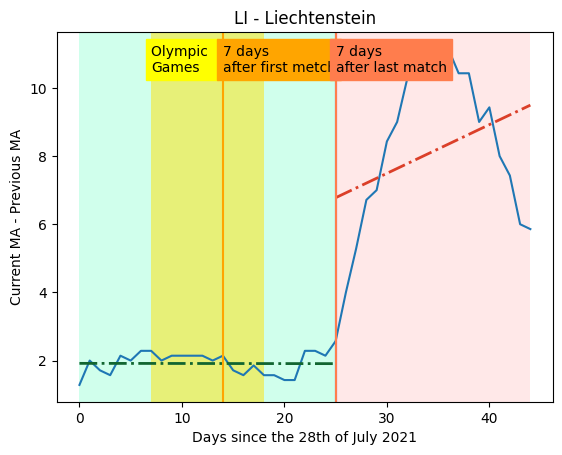

Trend positivo
La percentuale di cambiamento è: 153.40%
 
52.64 x + 1252   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]   range(0, 26)   #116530
 
133.4 x - 384.8   [25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(25, 45)   #DB3F29


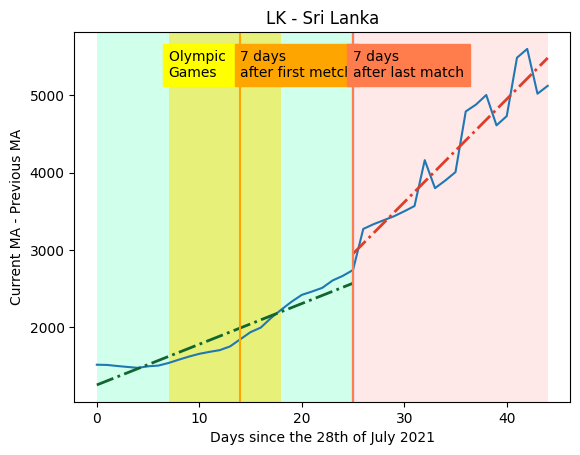

Trend negativo
La percentuale di cambiamento è: 98.78%
 
-2.924 x + 40.25   [0 1 2 3 4 5 6 7 8 9]   range(0, 10)   #116530
 
-0.03582 x + 6.711   [ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32
 33 34 35 36 37 38 39 40 41 42 43 44]   range(9, 45)   #DB3F29


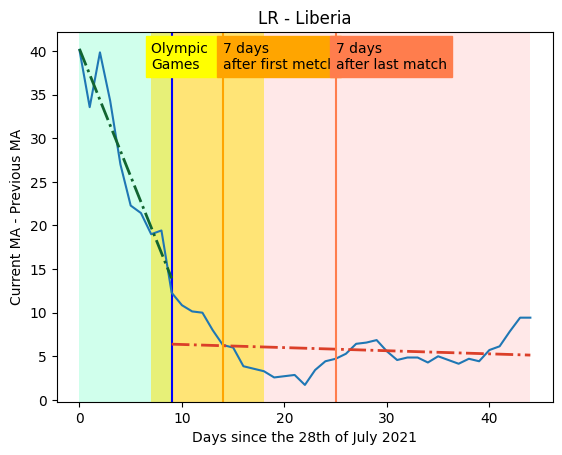

Trend negativo
La percentuale di cambiamento è: -119040.00%
 
-0.0003677 x + 67.39   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]   range(0, 37)   #116530
 
-0.4381 x + 31.32   [36 37 38 39 40 41 42 43 44]   range(36, 45)   #DB3F29


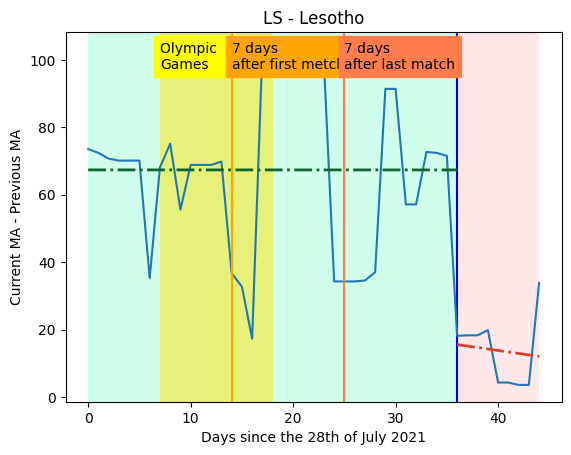

Trend positivo
La percentuale di cambiamento è: 93.59%
 
6.891 x + 60.7   [0 1 2 3 4 5 6 7 8]   range(0, 9)   #116530
 
13.34 x + 79.81   [ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31
 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(8, 45)   #DB3F29


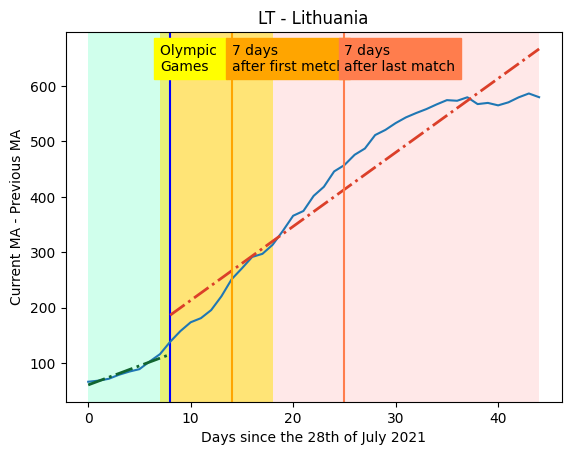

Trend negativo
La percentuale di cambiamento è: 90.33%
 
-2.635 x + 129.4   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
-0.2548 x + 74.45   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


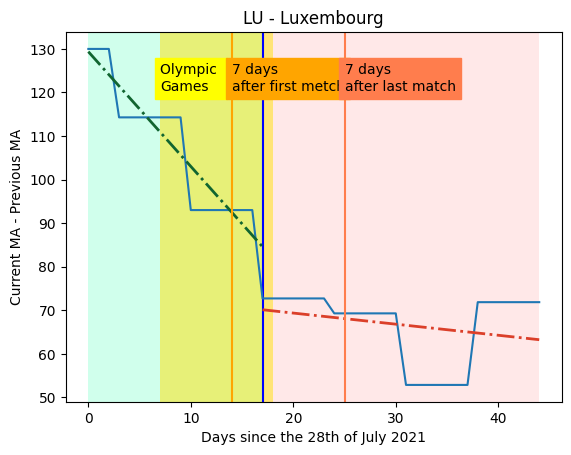

Trend positivo
La percentuale di cambiamento è: 173.64%
 
0.716 x + 35.31   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]   range(0, 17)   #116530
 
1.959 x + 21.02   [16 17 18 19 20 21 22 23 24 25 26 27 28 29 30]   range(16, 31)   #D7A449
 
3.811 x - 27.76   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


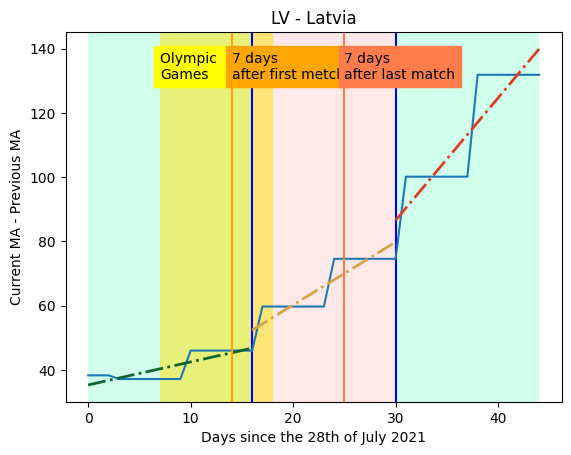

Trend negativo
La percentuale di cambiamento è: -1820.05%
 
-4.194 x + 2279   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]   range(0, 40)   #116530
 
-80.53 x + 5008   [39 40 41 42 43 44]   range(39, 45)   #DB3F29


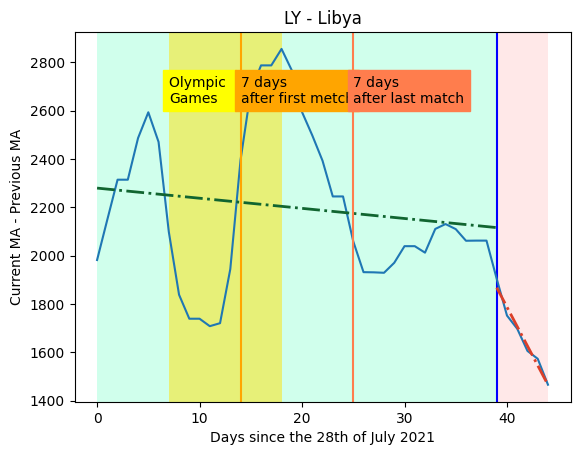

Trend positivo
La percentuale di cambiamento è: -89.98%
 
147.7 x + 1494   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
14.8 x + 7558   [14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44]   range(14, 45)   #DB3F29


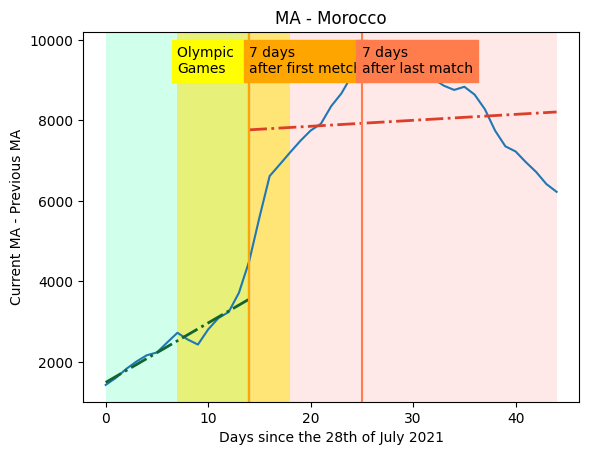

Trend negativo
La percentuale di cambiamento è: -150.01%
 
0.4204 x + 7.592   [0 1 2 3 4 5 6]   range(0, 7)   #116530
 
-0.2102 x + 18.77   [ 6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29
 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(6, 45)   #DB3F29


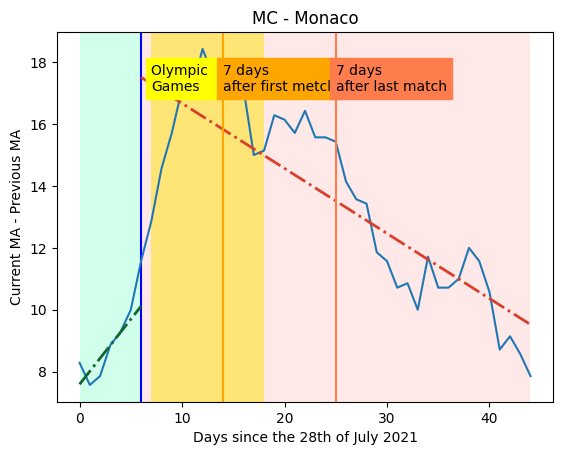

Trend positivo
La percentuale di cambiamento è: 309.89%
 
4.38 x + 53.65   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33]   range(0, 34)   #116530
 
17.95 x - 369.1   [33 34 35 36 37 38 39 40 41 42 43 44]   range(33, 45)   #DB3F29


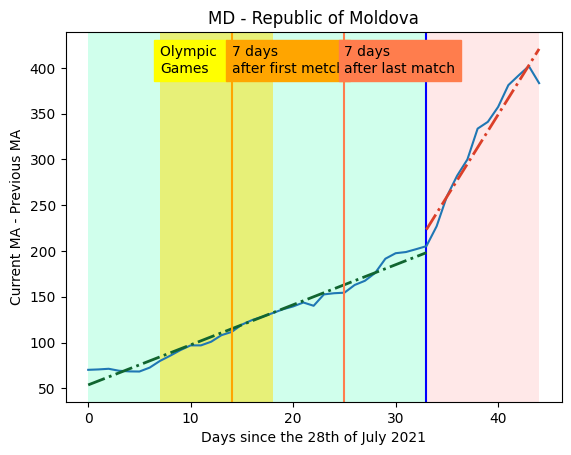

Trend positivo
La percentuale di cambiamento è: 1653.52%
 
1.029 x + 21.46   [0 1 2 3 4 5 6 7 8 9]   range(0, 10)   #116530
 
18.04 x - 193.8   [ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32
 33 34 35 36 37 38 39 40 41 42 43 44]   range(9, 45)   #DB3F29


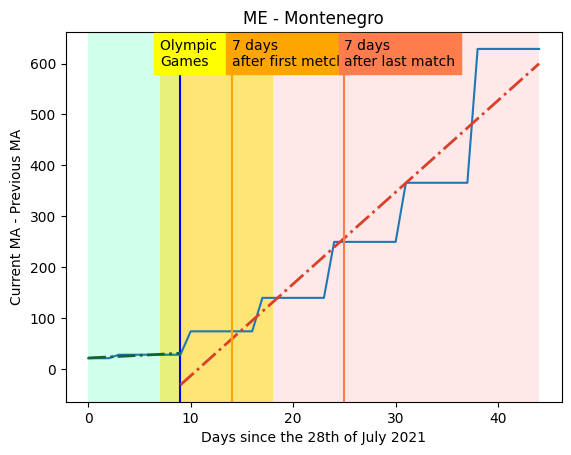

Trend positivo
La percentuale di cambiamento è: 902.09%
 
-0.01636 x + 8.306   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]   range(0, 19)   #116530
 
0.1313 x + 17.42   [18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44]   range(18, 45)   #DB3F29


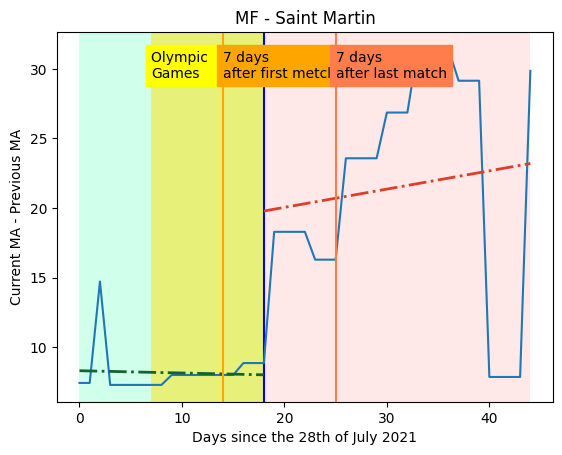

Trend negativo
La percentuale di cambiamento è: 67.63%
 
-0.3488 x + 15.6   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]   range(0, 22)   #116530
 
-0.1129 x + 8.563   [21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(21, 45)   #DB3F29


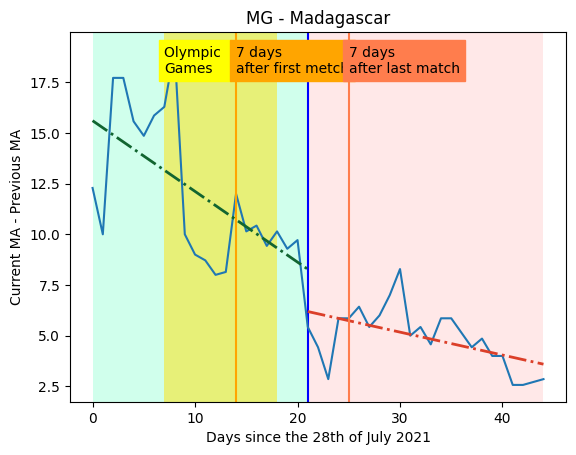

Trend positivo
La percentuale di cambiamento è: 1098.38%
 
0.7519 x + 13.03   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]   range(0, 17)   #116530
 
3.964 x - 20.89   [16 17 18 19 20 21 22 23]   range(16, 24)   #D7A449
 
47.51 x - 1008   [23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(23, 45)   #DB3F29


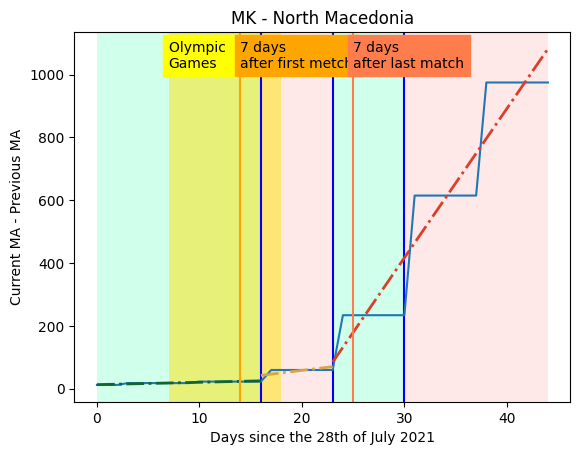

Trend positivo
La percentuale di cambiamento è: 1329.69%
 
0.009034 x + 5.412   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]   range(0, 23)   #116530
 
0.1292 x + 4.179   [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(22, 45)   #DB3F29


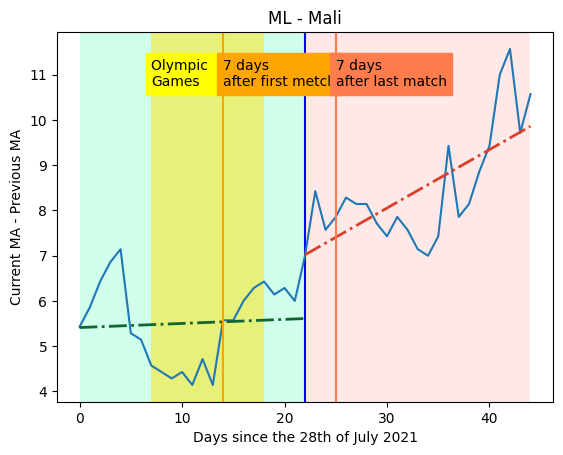

Trend negativo
La percentuale di cambiamento è: -118.70%
 
-35.45 x + 5540   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]   range(0, 23)   #116530
 
-77.53 x + 5786   [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(22, 45)   #DB3F29


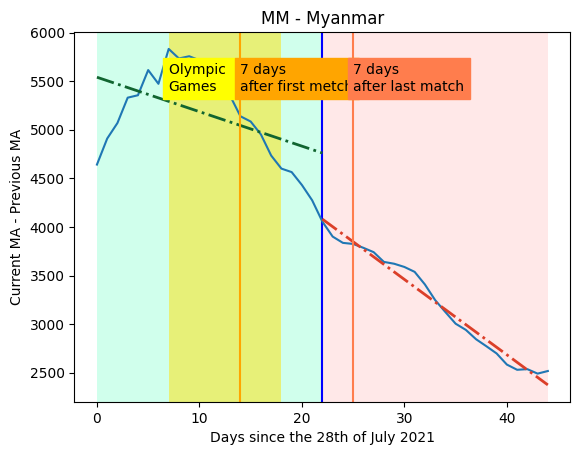

Trend positivo
La percentuale di cambiamento è: 1285.01%
 
-7.3 x + 1417   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]   range(0, 37)   #116530
 
86.5 x - 1629   [36 37 38 39 40 41 42 43 44]   range(36, 45)   #DB3F29


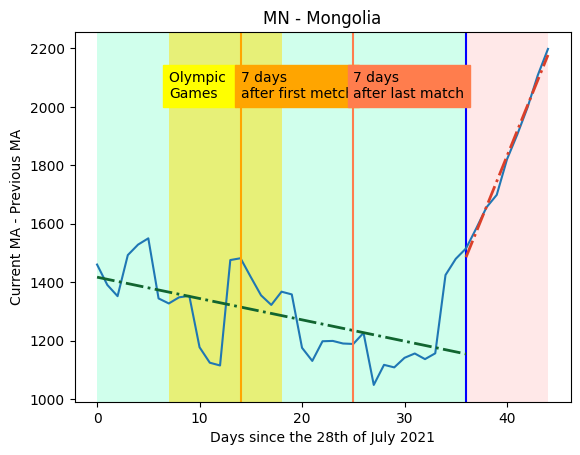

Trend positivo
La percentuale di cambiamento è: 74.93%
 
0.00105 x + 0.2521   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
0.001838 x + 1.388   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


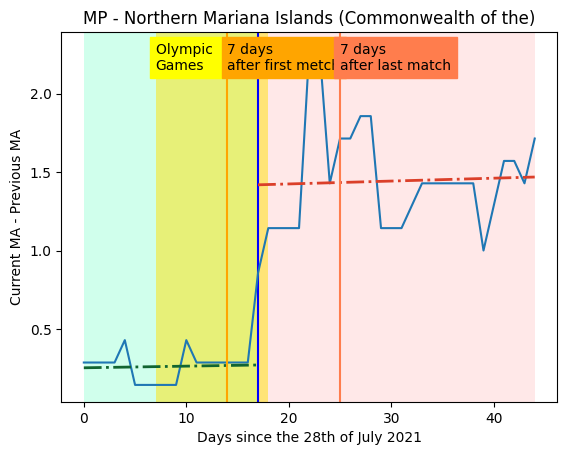

Trend negativo
La percentuale di cambiamento è: -189.78%
 
15.11 x + 187.7   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
-13.57 x + 982.6   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43]   range(13, 44)   #DB3F29


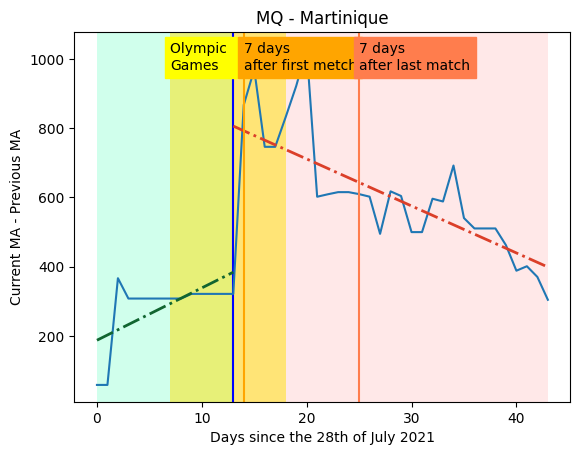

Trend negativo
La percentuale di cambiamento è: -136.64%
 
5.031 x + 110.5   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
-1.843 x + 329.1   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


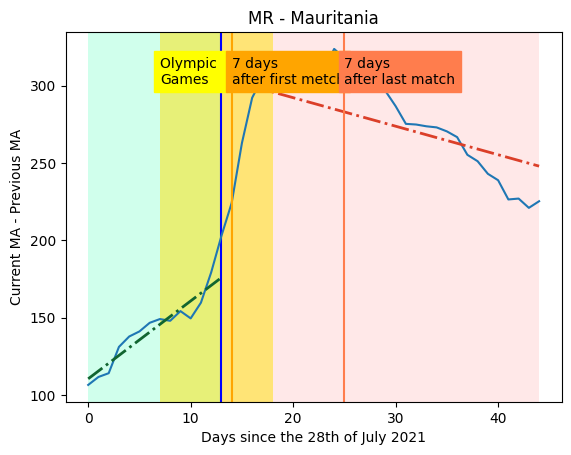

Error in  ** On entry to DLASCLS parameter number  4 had an illegal value
 MS
Trend negativo
La percentuale di cambiamento è: -140.25%
 
2.532 x + 143.4   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
-1.019 x + 103.6   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


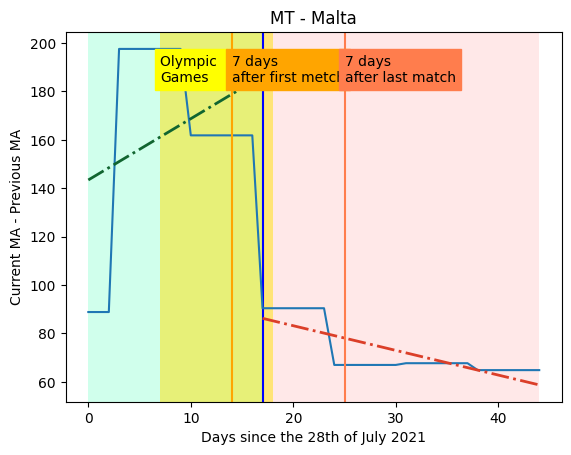

Trend positivo
La percentuale di cambiamento è: 40937.98%
 
5.814 x + 37.83   [0 1 2 3 4 5]   range(0, 6)   #116530
 
-0.02892 x + 114.2   [ 5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 29 30 31 32 33 34]   range(5, 35)   #D7A449
 
11.81 x - 199.4   [34 35 36 37 38 39 40 41 42 43 44]   range(34, 45)   #DB3F29


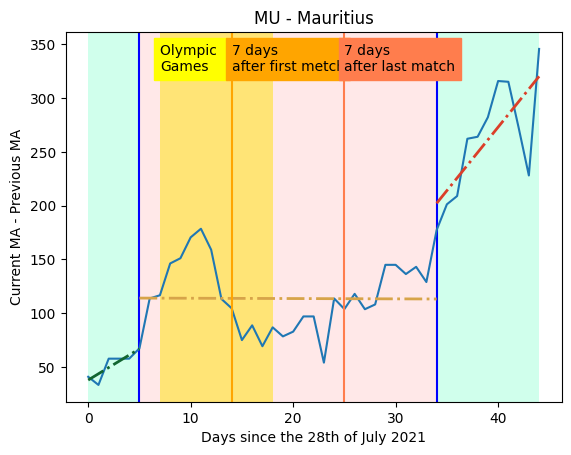

Error in  ** On entry to DLASCLS parameter number  4 had an illegal value
 MV
Trend negativo
La percentuale di cambiamento è: -207.08%
 
-4.954 x + 663.7   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]   range(0, 29)   #116530
 
-15.21 x + 800.7   [28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(28, 45)   #DB3F29


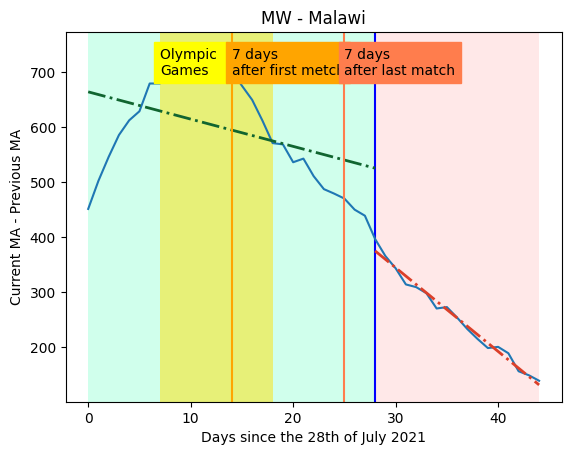

Trend positivo
La percentuale di cambiamento è: -94.69%
 
463.6 x + 9658   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
24.63 x + 1.684e+04   [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44]   range(10, 45)   #DB3F29


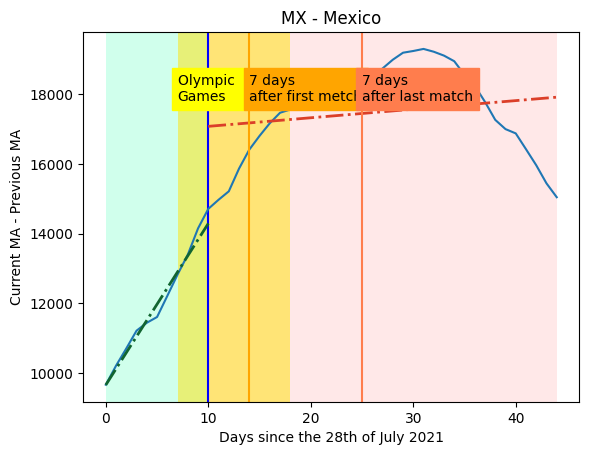

Trend positivo
La percentuale di cambiamento è: -41.26%
 
337.4 x + 1.029e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
198.2 x + 1.376e+04   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


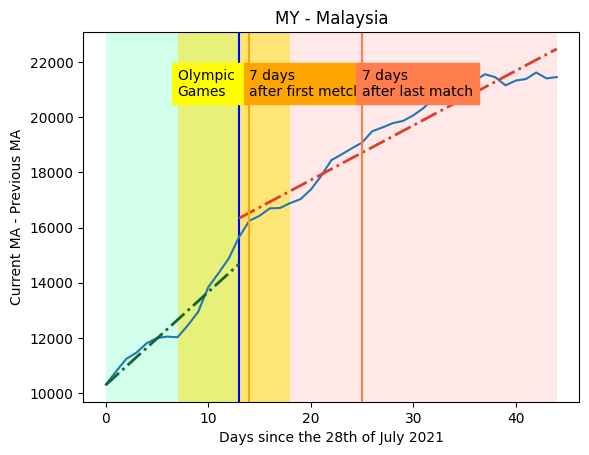

Trend negativo
La percentuale di cambiamento è: -2083.28%
 
-1.918 x + 1569   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]   range(0, 30)   #116530
 
-41.87 x + 2233   [29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(29, 45)   #DB3F29


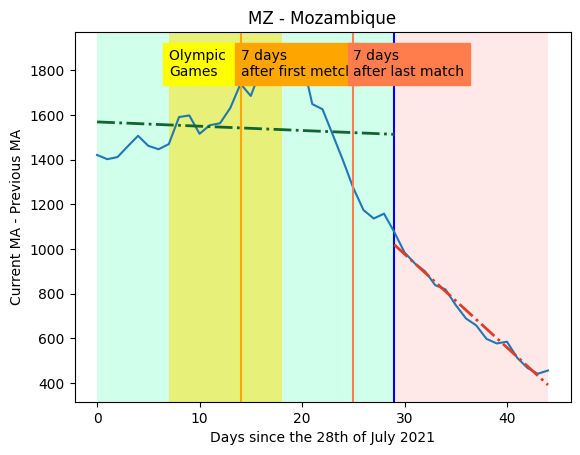

Error in  ** On entry to DLASCLS parameter number  4 had an illegal value
 NC
Trend positivo
La percentuale di cambiamento è: 107.33%
 
-0.2083 x + 5.842   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]   range(0, 19)   #116530
 
0.01526 x + 6.437   [18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44]   range(18, 45)   #DB3F29


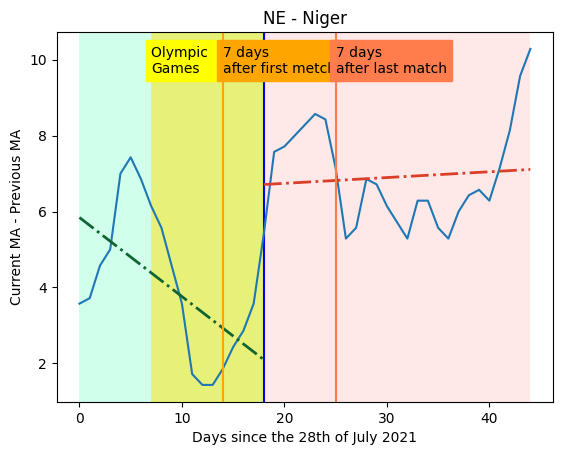

Trend positivo
La percentuale di cambiamento è: -32.74%
 
13.24 x + 86.07   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]   range(0, 16)   #116530
 
8.907 x + 309.5   [15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38
 39 40 41 42 43 44]   range(15, 45)   #DB3F29


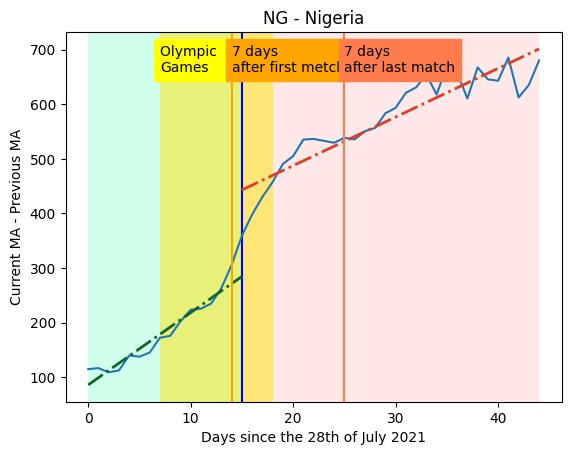

Trend positivo
La percentuale di cambiamento è: 563.78%
 
0.2927 x + 34.33   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]   range(0, 41)   #116530
 
1.943 x - 30.54   [40 41 42 43 44]   range(40, 45)   #DB3F29


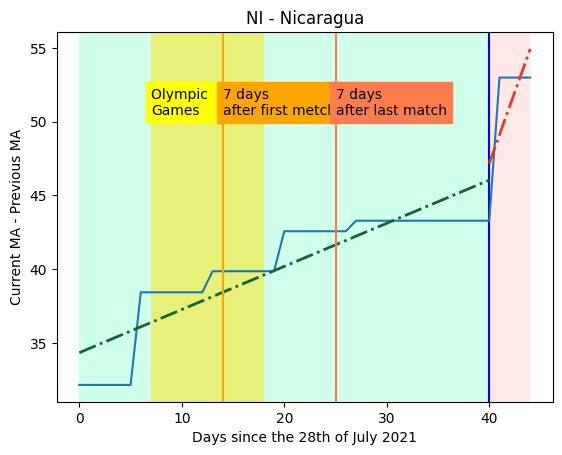

Trend negativo
La percentuale di cambiamento è: 85.79%
 
-230 x + 9454   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
-32.69 x + 3607   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


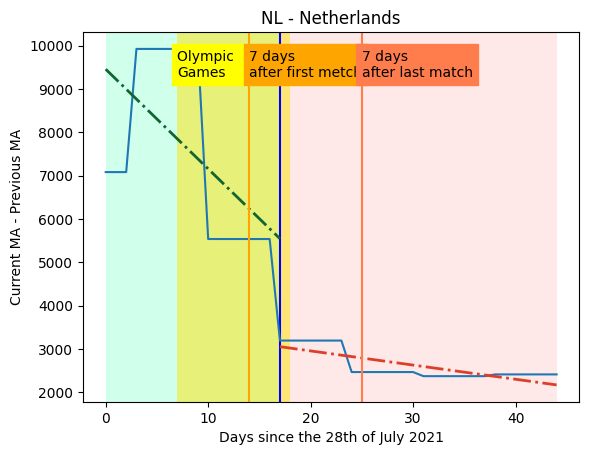

Trend positivo
La percentuale di cambiamento è: 249.73%
 
5.918 x + 148.3   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
20.7 x - 68.71   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


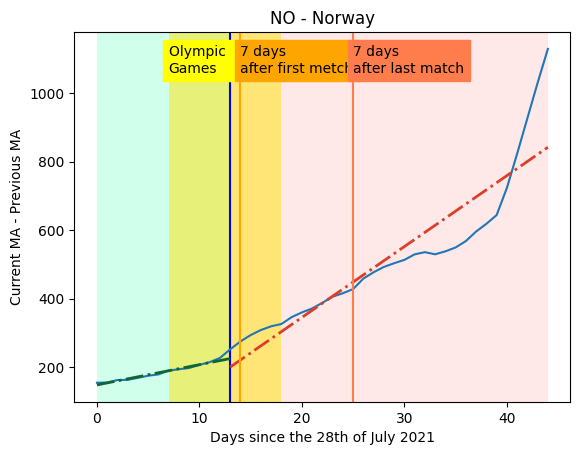

Trend negativo
La percentuale di cambiamento è: -144.27%
 
25.69 x + 1599   [ 0  1  2  3  4  5  6  7  8  9 10 11]   range(0, 12)   #116530
 
-11.37 x + 2607   [11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40 41 42 43 44]   range(11, 45)   #DB3F29


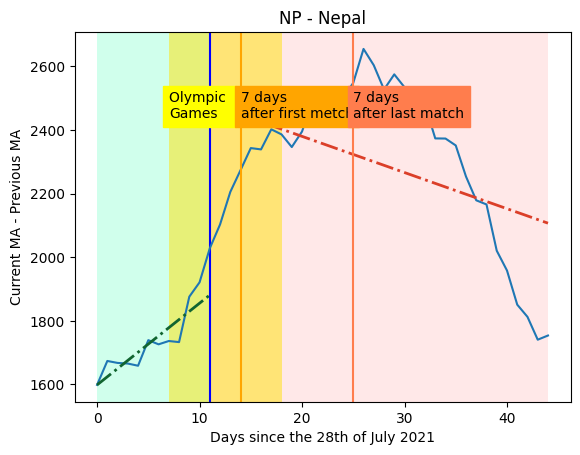

Trend positivo
La percentuale di cambiamento è: 6517.60%
 
-0.02292 x + 6.241   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
1.471 x - 30.49   [14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44]   range(14, 45)   #DB3F29


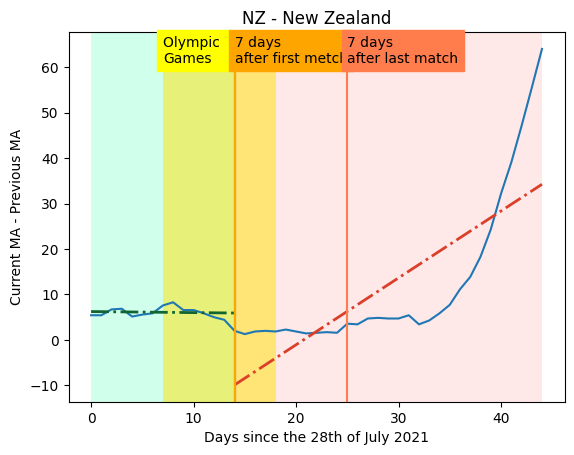

Trend negativo
La percentuale di cambiamento è: 84.37%
 
-67.22 x + 1128   [0 1 2 3 4 5 6 7 8]   range(0, 9)   #116530
 
-10.5 x + 558.8   [ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31
 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(8, 45)   #DB3F29


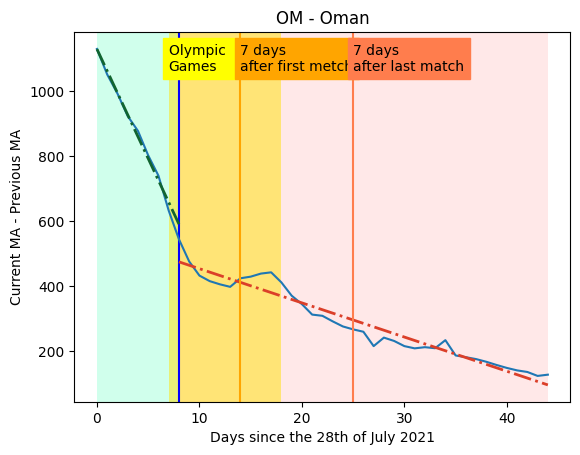

Trend negativo
La percentuale di cambiamento è: -84.79%
 
-7.87 x + 1075   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33]   range(0, 34)   #116530
 
-14.54 x + 1259   [33 34 35 36 37 38 39 40 41 42 43 44]   range(33, 45)   #DB3F29


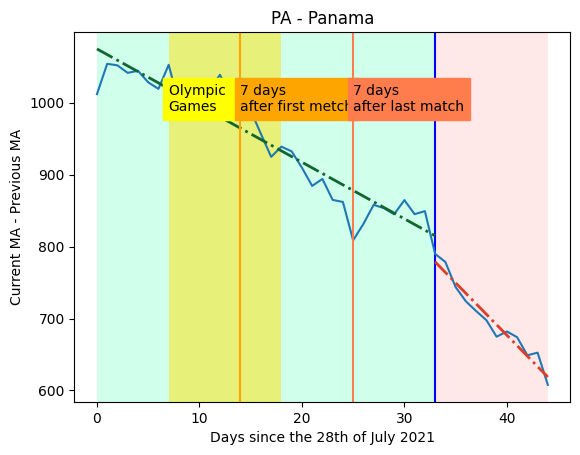

Trend negativo
La percentuale di cambiamento è: 22.35%
 
-16.56 x + 1881   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]   range(0, 30)   #116530
 
-12.86 x + 1683   [29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(29, 45)   #DB3F29


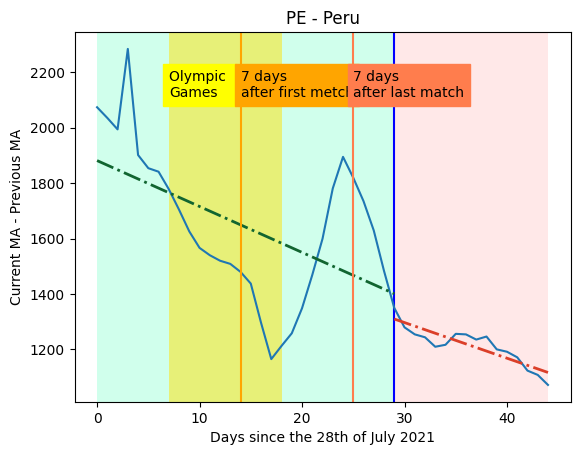

Trend positivo
La percentuale di cambiamento è: -45.03%
 
14.26 x - 64.7   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]   range(0, 26)   #116530
 
7.836 x + 619.2   [25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(25, 45)   #DB3F29


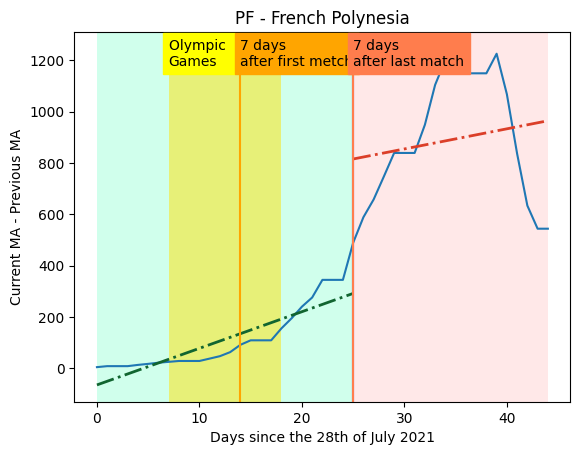

Trend positivo
La percentuale di cambiamento è: 241.91%
 
-0.4612 x + 24.85   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]   range(0, 23)   #116530
 
0.6544 x - 13.33   [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(22, 45)   #DB3F29


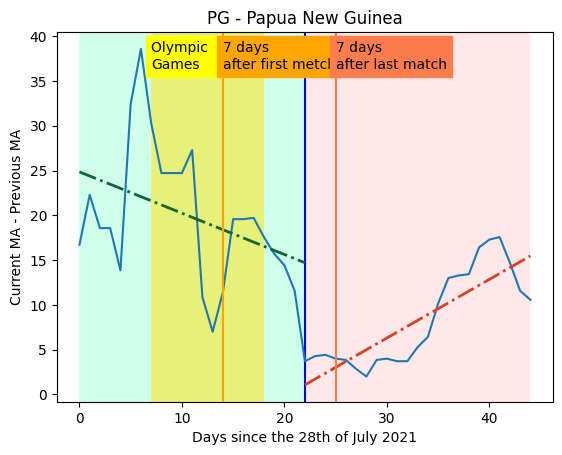

Trend positivo
La percentuale di cambiamento è: 185.08%
 
130.8 x + 4671   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]   range(0, 23)   #116530
 
372.9 x - 83.06   [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(22, 45)   #DB3F29


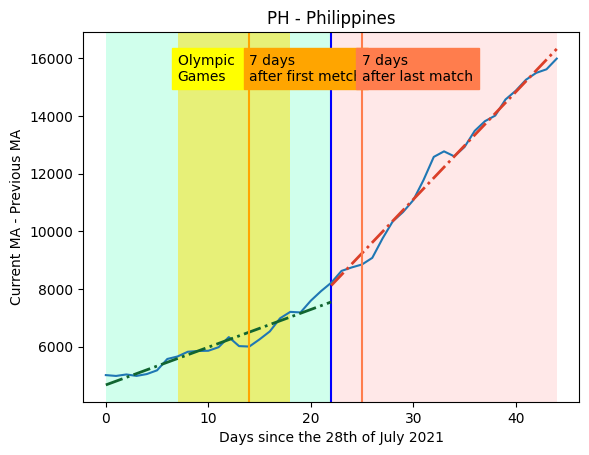

Trend negativo
La percentuale di cambiamento è: -138.02%
 
42.72 x + 2003   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]   range(0, 16)   #116530
 
-16.24 x + 4682   [15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38
 39 40 41 42 43 44]   range(15, 45)   #DB3F29


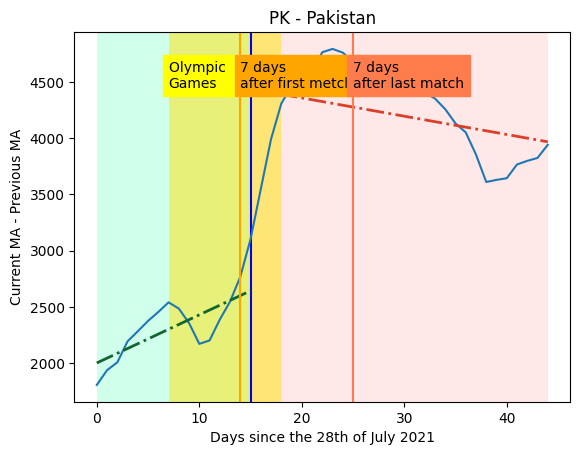

Trend positivo
La percentuale di cambiamento è: 20.43%
 
2.61 x + 79.39   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]   range(0, 20)   #116530
 
3.143 x + 76.76   [19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42
 43 44]   range(19, 45)   #DB3F29


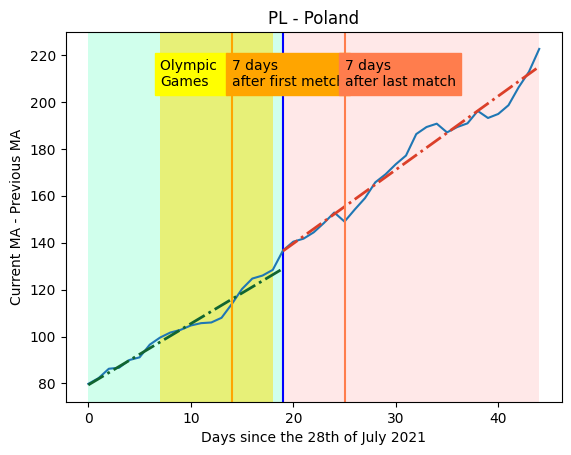

Error in  ** On entry to DLASCLS parameter number  4 had an illegal value
 PM
Trend positivo
La percentuale di cambiamento è: -78.09%
 
22.8 x + 118.3   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]   range(0, 19)   #116530
 
4.996 x + 705.5   [18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44]   range(18, 45)   #DB3F29


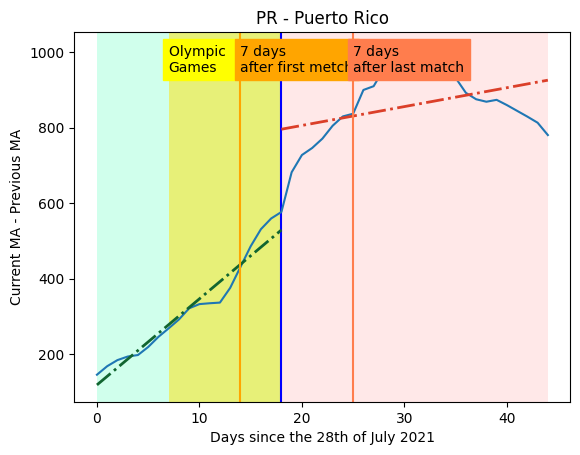

Trend positivo
La percentuale di cambiamento è: 1295.82%
 
-1.23 x + 76.23   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
5.171 x + 25.09   [14 15 16 17 18 19 20 21 22 23 24 25 26 27]   range(14, 28)   #D7A449
 
72.18 x - 1886   [27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(27, 45)   #DB3F29


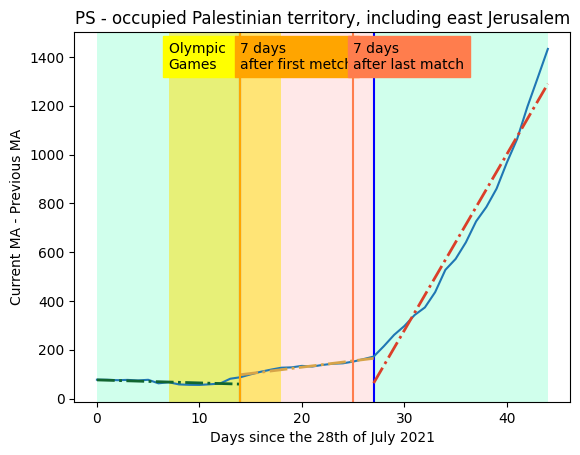

Trend negativo
La percentuale di cambiamento è: -196.68%
 
13.37 x + 3262   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
-12.93 x + 2809   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


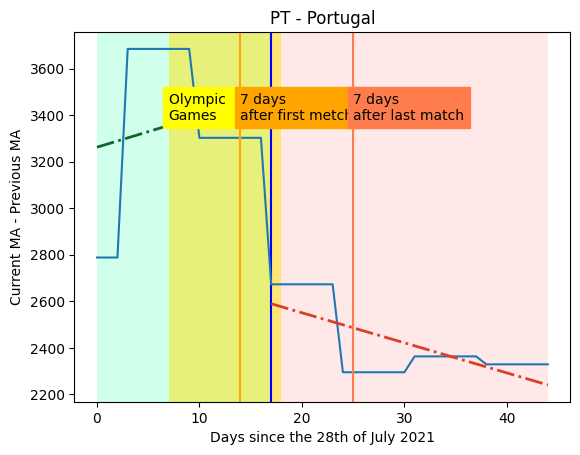

Error in  ** On entry to DLASCLS parameter number  4 had an illegal value
 PW
Trend negativo
La percentuale di cambiamento è: 72.99%
 
-30.6 x + 1115   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33]   range(0, 34)   #116530
 
-8.263 x + 476.7   [33 34 35 36 37 38 39 40 41 42 43 44]   range(33, 45)   #DB3F29


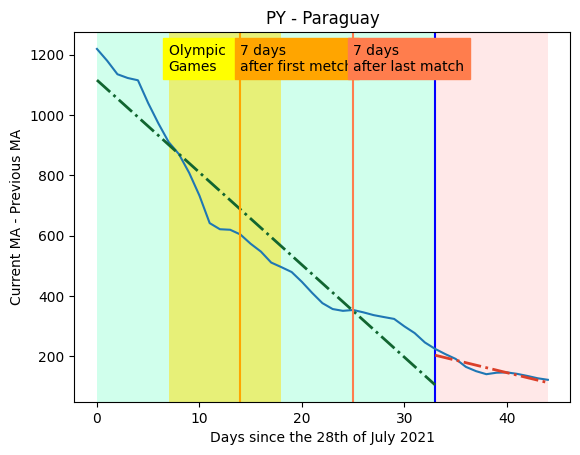

Trend positivo
La percentuale di cambiamento è: 2.28%
 
2.424 x + 116   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]   range(0, 25)   #116530
 
2.479 x + 134.8   [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(24, 45)   #DB3F29


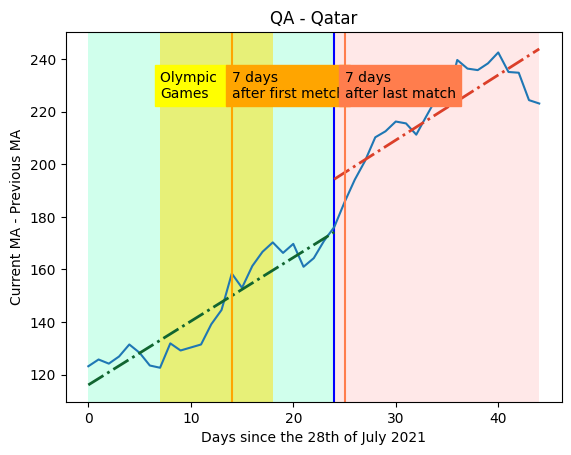

Trend negativo
La percentuale di cambiamento è: 78.24%
 
-2.338 x + 210.7   [ 0  1  2  3  4  5  6  7  8  9 10 11 12]   range(0, 13)   #116530
 
-0.5088 x + 447   [12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35
 36 37 38 39 40 41 42]   range(12, 43)   #DB3F29


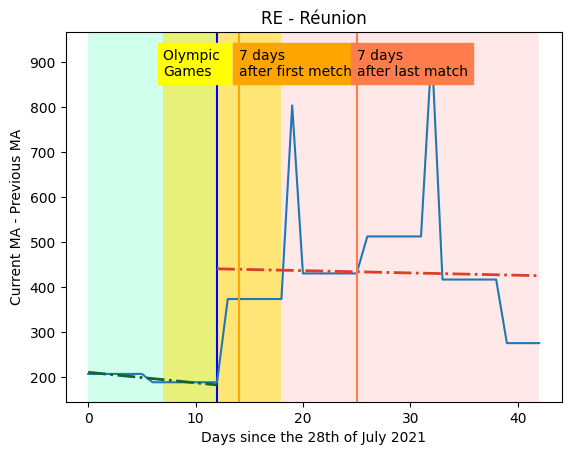

Trend positivo
La percentuale di cambiamento è: 455.27%
 
3.064 x + 45.14   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
17.01 x - 157.3   [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44]   range(10, 45)   #DB3F29


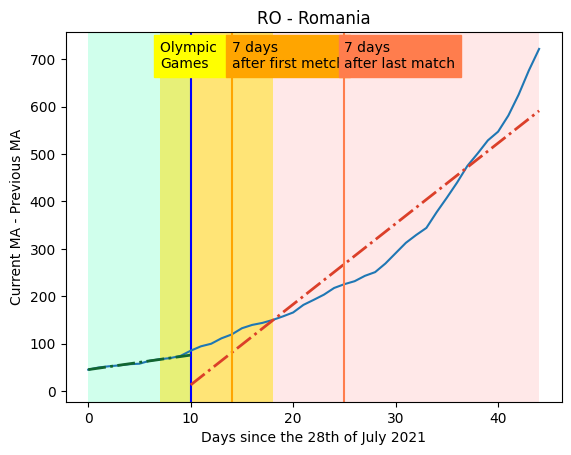

Trend positivo
La percentuale di cambiamento è: 395.79%
 
16.84 x + 55.7   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]   range(0, 30)   #116530
 
83.5 x - 1746   [29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(29, 45)   #DB3F29


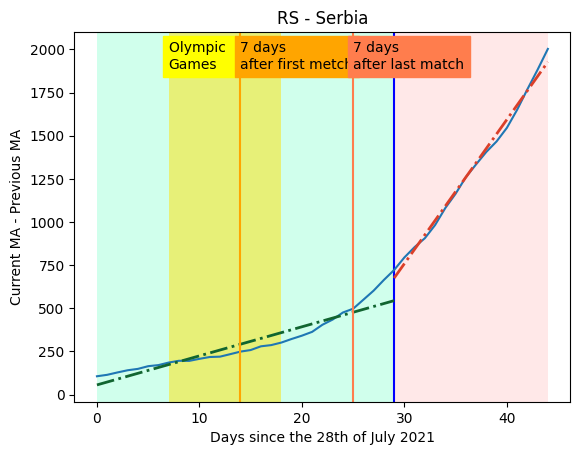

Error in  ** On entry to DLASCLS parameter number  4 had an illegal value
 RU
Trend negativo
La percentuale di cambiamento è: 18.82%
 
-12.67 x + 1201   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]   range(0, 25)   #116530
 
-10.29 x + 886.7   [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(24, 45)   #DB3F29


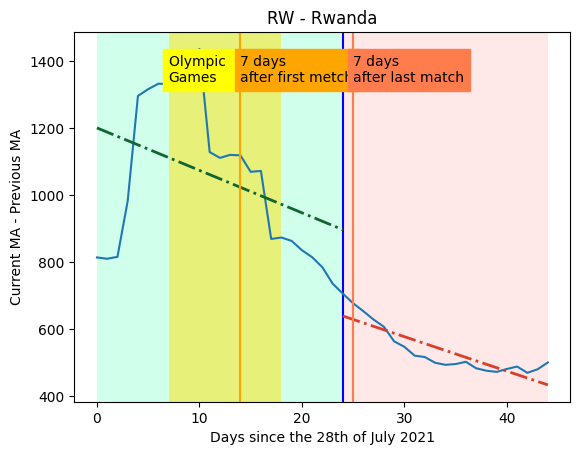

Trend negativo
La percentuale di cambiamento è: -284.97%
 
-8.264 x + 1275   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]   range(0, 29)   #116530
 
-31.81 x + 1732   [28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(28, 45)   #DB3F29


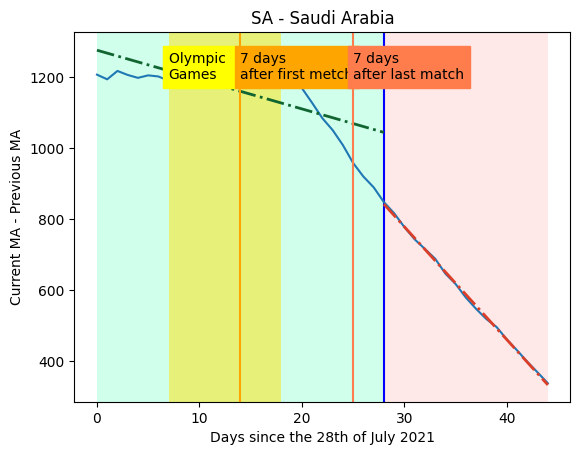

Trend positivo
La percentuale di cambiamento è: 76.32%
 
0.216 x + 80.29   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
0.3809 x + 45.29   [14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44]   range(14, 45)   #DB3F29


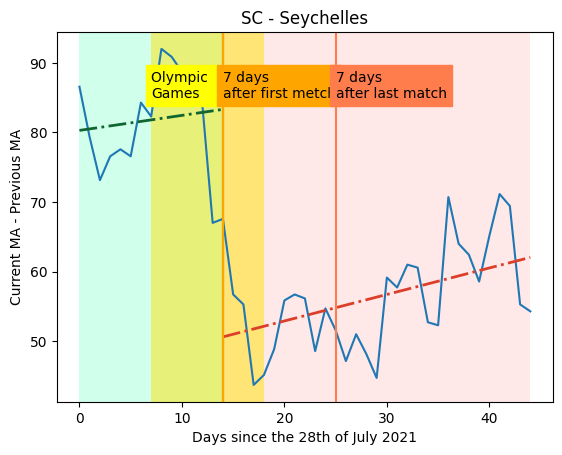

Trend negativo
La percentuale di cambiamento è: 96.82%
 
-0.7672 x + 31.01   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]   range(0, 22)   #116530
 
-0.02441 x + 10.54   [21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(21, 45)   #DB3F29


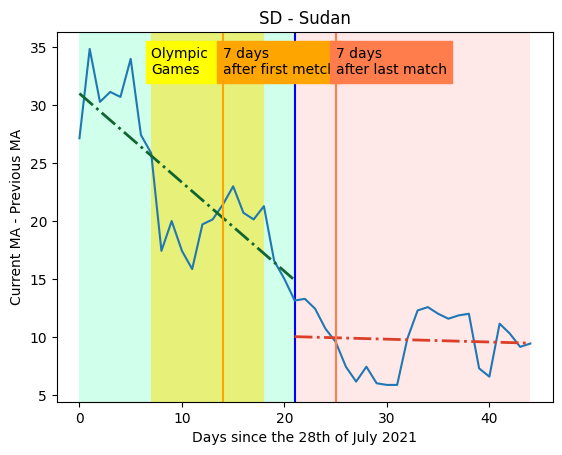

Trend positivo
La percentuale di cambiamento è: 8.02%
 
15.43 x + 228.8   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]   range(0, 20)   #116530
 
16.67 x + 279.8   [19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42
 43 44]   range(19, 45)   #DB3F29


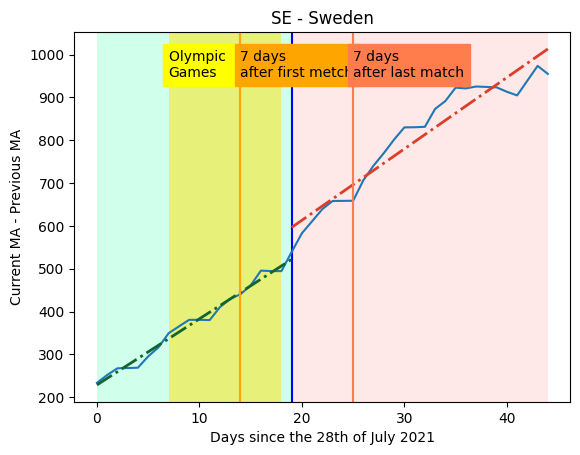

Trend negativo
La percentuale di cambiamento è: -124.29%
 
9.329 x + 25.19   [0 1 2 3 4]   range(0, 5)   #116530
 
-2.266 x + 150.6   [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(4, 45)   #DB3F29


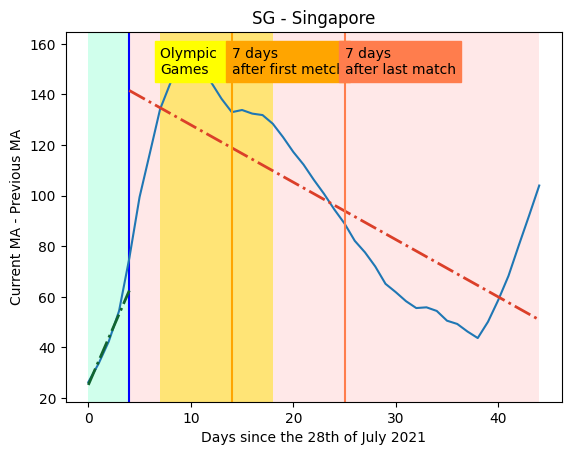

Trend positivo
La percentuale di cambiamento è: 410.00%
 
2.692 x + 40.12   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]   range(0, 31)   #116530
 
13.73 x - 266.1   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


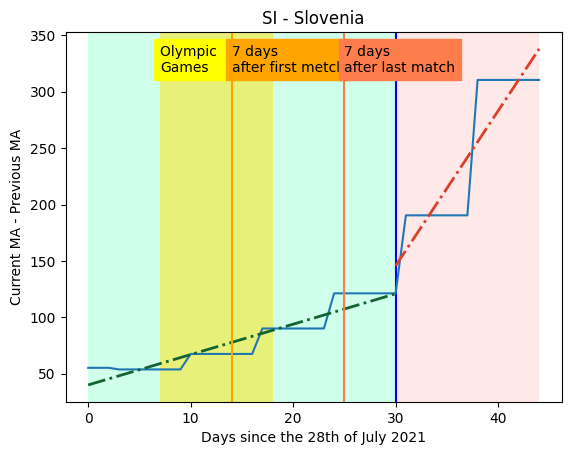

Trend positivo
La percentuale di cambiamento è: 54.41%
 
1.015 x + 23.97   [ 0  1  2  3  4  5  6  7  8  9 10 11 12]   range(0, 13)   #116530
 
1.567 x + 18.87   [12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35
 36 37 38 39 40 41 42 43 44]   range(12, 45)   #DB3F29


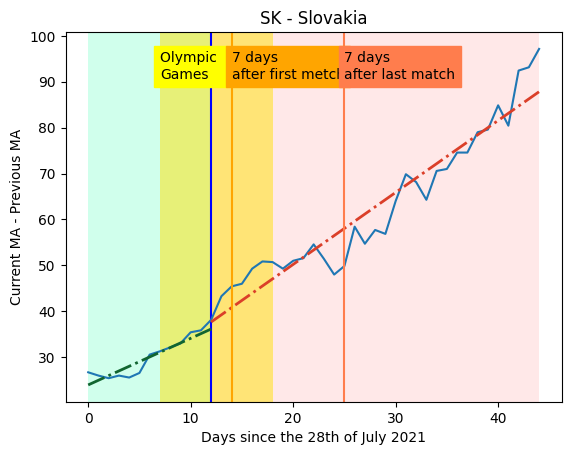

Trend negativo
La percentuale di cambiamento è: 87.53%
 
-1.19 x + 26.37   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]   range(0, 23)   #116530
 
-0.1484 x + 8.076   [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(22, 45)   #DB3F29


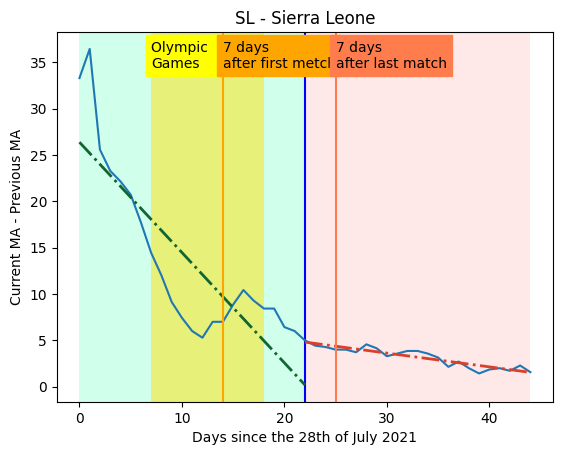

Trend positivo
La percentuale di cambiamento è: 11076.40%
 
0.1961 x + 0.4481   [ 0  1  2  3  4  5  6  7  8  9 10 11]   range(0, 12)   #116530
 
0.006263 x + 4.755   [11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40]   range(11, 41)   #D7A449
 
0.7 x - 21.91   [40 41 42 43 44]   range(40, 45)   #DB3F29


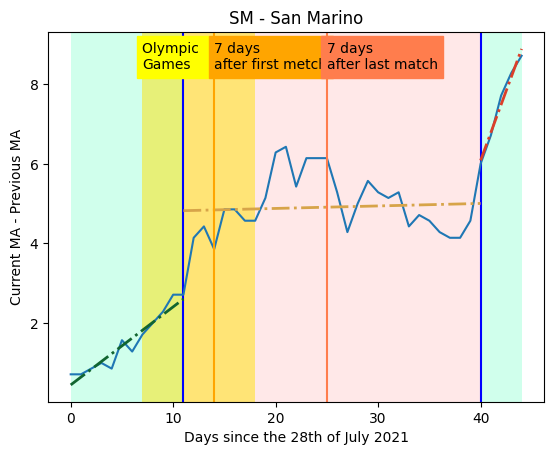

Trend negativo
La percentuale di cambiamento è: -85.23%
 
-8.627 x + 842.4   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]   range(0, 37)   #116530
 
-15.98 x + 812.9   [36 37 38 39 40 41 42 43 44]   range(36, 45)   #DB3F29


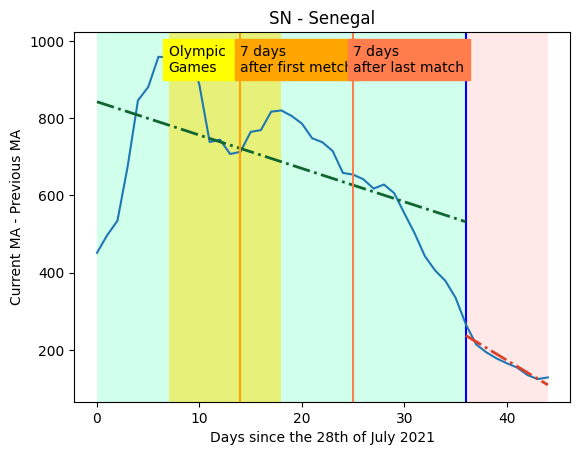

Trend positivo
La percentuale di cambiamento è: -56.09%
 
1.199 x + 6.788   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]   range(0, 21)   #116530
 
0.5265 x + 42.95   [20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43
 44]   range(20, 45)   #DB3F29


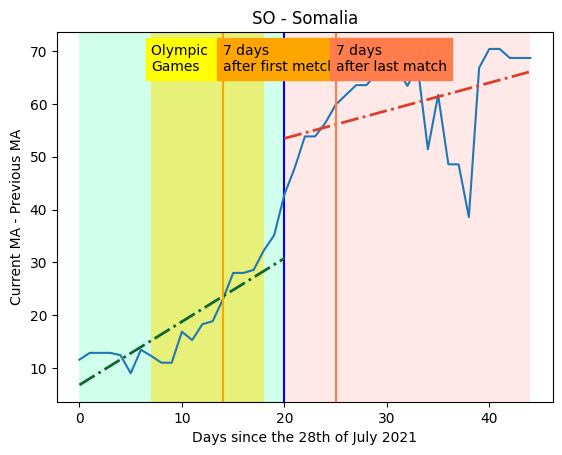

Trend positivo
La percentuale di cambiamento è: 149.64%
 
-2.962 x + 137.7   [0 1 2 3 4 5 6 7 8 9]   range(0, 10)   #116530
 
1.47 x + 56.51   [ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32
 33 34 35 36 37 38 39 40 41 42 43 44]   range(9, 45)   #DB3F29


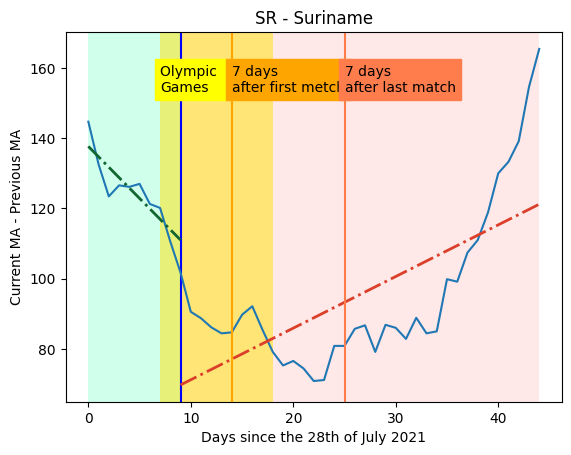

Trend positivo
La percentuale di cambiamento è: 295540144064566016.00%
 
-7.452e-16 x + 3.714   [0 1 2 3 4 5]   range(0, 6)   #116530
 
2.202 x - 4.238   [ 5  6  7  8  9 10 11 12 13]   range(5, 14)   #D7A449
 
0.4114 x + 0.6954   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39]   range(13, 40)   #DB3F29


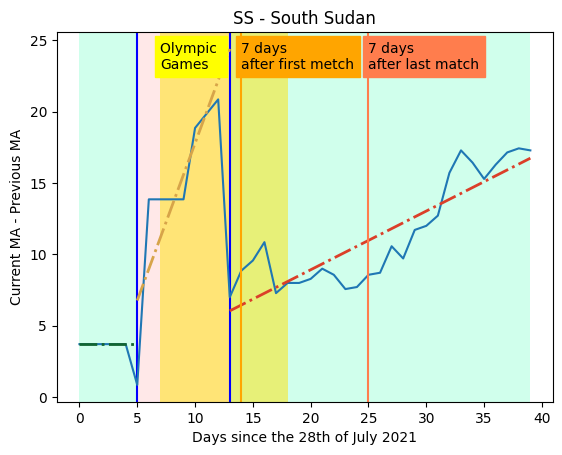

Trend positivo
La percentuale di cambiamento è: 11851.00%
 
0.006435 x + 2.641   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]   range(0, 37)   #116530
 
0.769 x - 24.3   [36 37 38 39 40 41 42 43 44]   range(36, 45)   #DB3F29


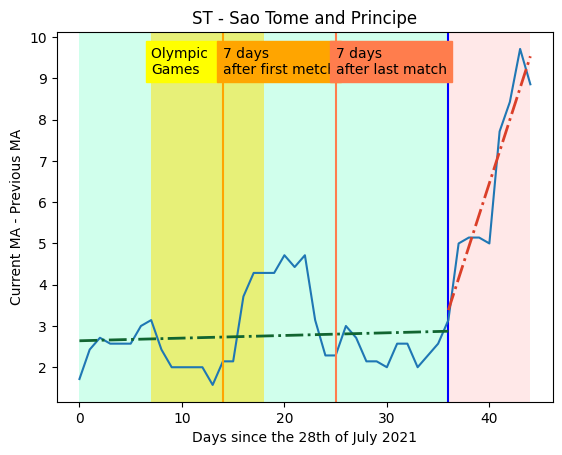

Trend positivo
La percentuale di cambiamento è: 102.32%
 
-10.06 x + 263.8   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
0.2333 x + 281   [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44]   range(10, 45)   #DB3F29


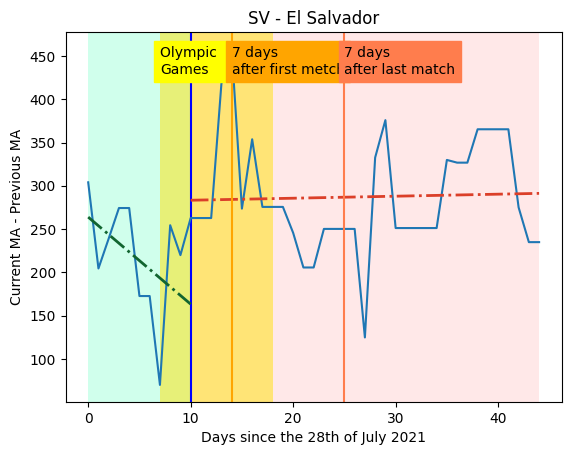

Trend positivo
La percentuale di cambiamento è: -57.57%
 
0.5812 x + 0.8278   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]   range(0, 27)   #116530
 
0.2466 x + 23.96   [26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(26, 45)   #DB3F29


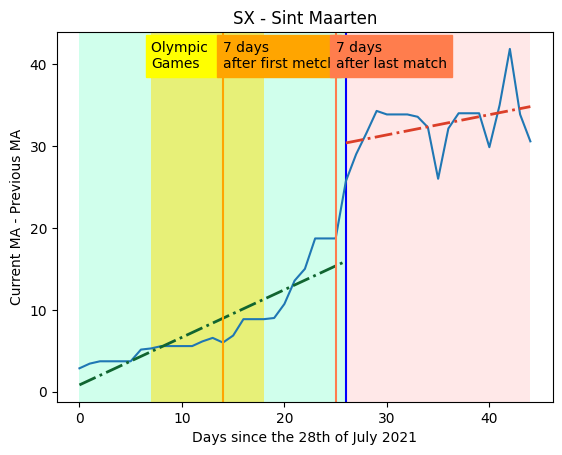

Trend positivo
La percentuale di cambiamento è: 1245.83%
 
-0.2637 x + 8.484   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
3.022 x - 47.01   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


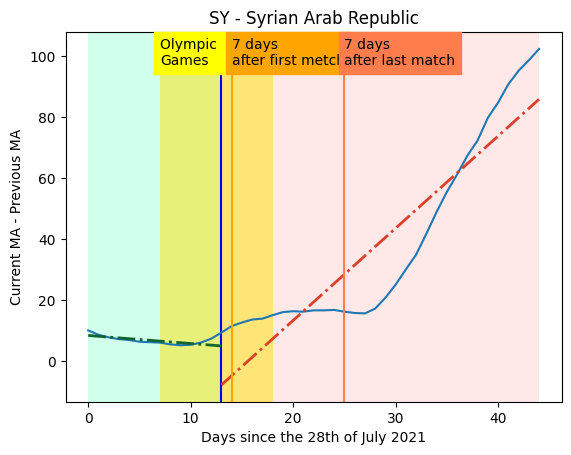

Trend positivo
La percentuale di cambiamento è: 95.73%
 
3.785 x + 148.6   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
7.409 x + 364.4   [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44]   range(10, 45)   #DB3F29


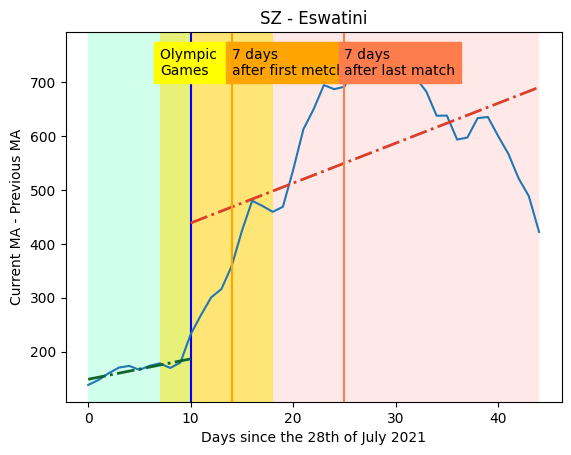

Trend positivo
La percentuale di cambiamento è: 86.70%
 
0.01637 x + 2.242   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]   range(0, 24)   #116530
 
0.03057 x + 4.852   [23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(23, 45)   #DB3F29


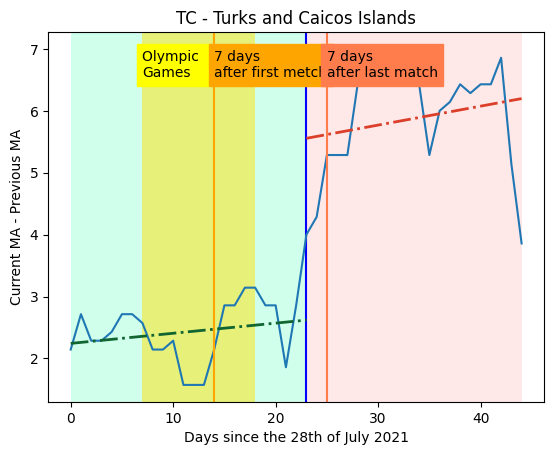

Trend negativo
La percentuale di cambiamento è: -106.17%
 
0.1207 x + 0.8452   [0 1 2 3 4 5 6 7 8]   range(0, 9)   #116530
 
-0.007451 x + 0.8269   [ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31
 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(8, 45)   #DB3F29


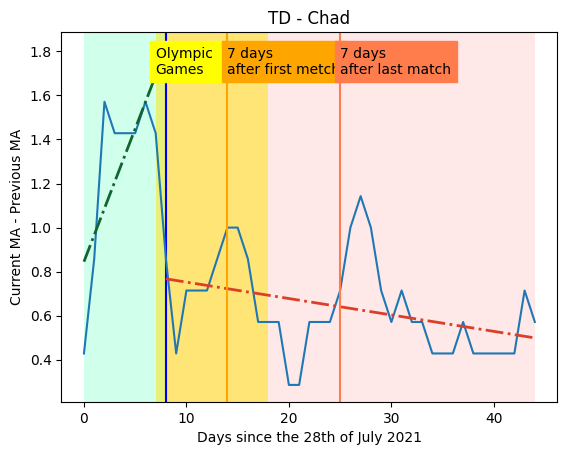

Trend positivo
La percentuale di cambiamento è: 82.50%
 
2.943 x + 39.22   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
5.371 x + 5.028   [14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44]   range(14, 45)   #DB3F29


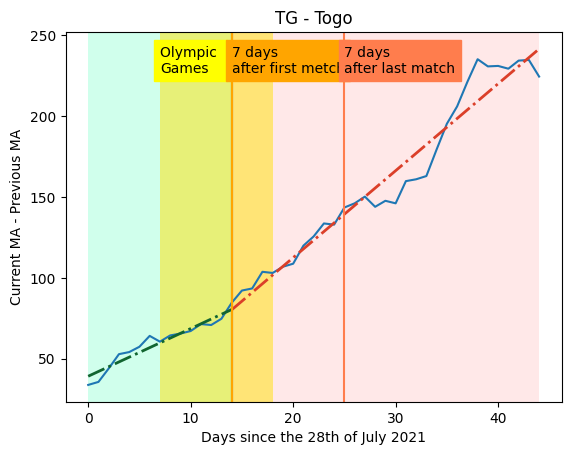

Trend positivo
La percentuale di cambiamento è: -79.32%
 
482.4 x + 8418   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
99.76 x + 1.663e+04   [14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44]   range(14, 45)   #DB3F29


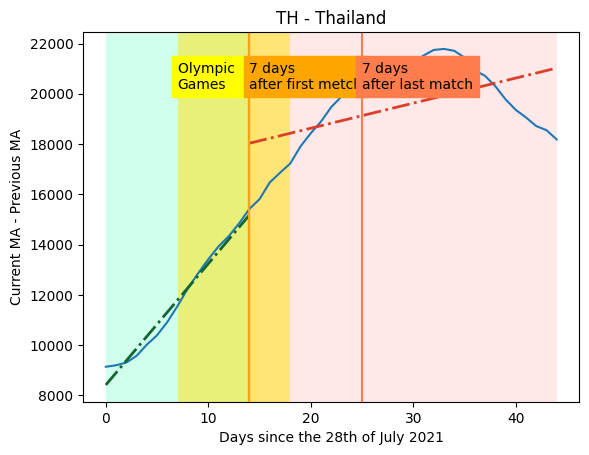

Trend negativo
La percentuale di cambiamento è: -161.18%
 
1.35 x + 38.77   [0 1 2 3 4 5 6 7 8]   range(0, 9)   #116530
 
-0.8261 x + 86.79   [ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31
 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(8, 45)   #DB3F29


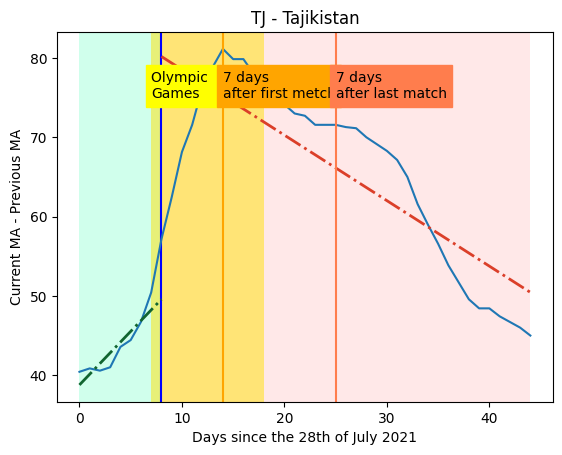

Trend positivo
La percentuale di cambiamento è: 600.93%
 
-1.72 x + 48.29   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
8.615 x - 91.46   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


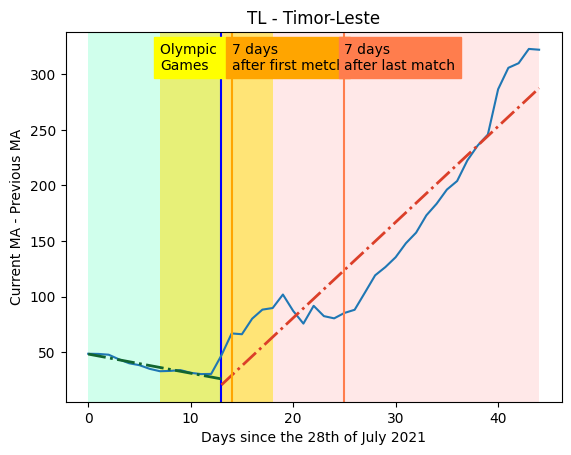

Trend negativo
La percentuale di cambiamento è: 94.81%
 
-290.2 x + 7687   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]   range(0, 19)   #116530
 
-15.06 x + 2905   [18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44]   range(18, 45)   #DB3F29


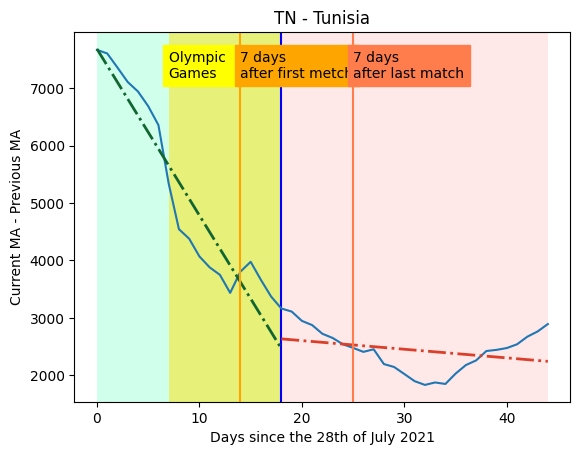

Trend positivo
La percentuale di cambiamento è: -95.03%
 
427.3 x + 5271   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]   range(0, 14)   #116530
 
21.25 x + 2.052e+04   [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44]   range(13, 45)   #DB3F29


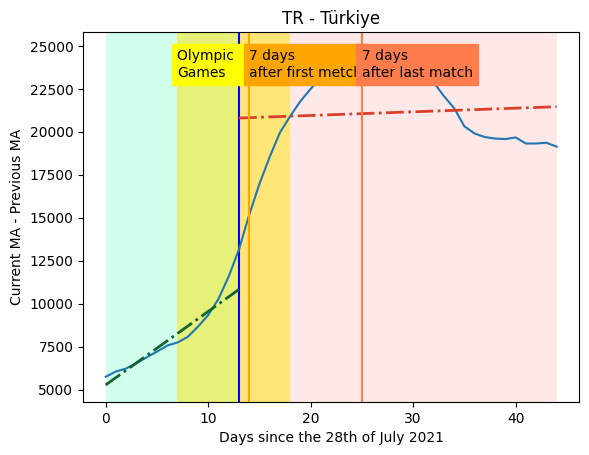

Trend negativo
La percentuale di cambiamento è: -269.78%
 
0.5553 x + 189.2   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41]   range(0, 42)   #116530
 
-0.9429 x + 203.6   [41 42 43 44]   range(41, 45)   #DB3F29


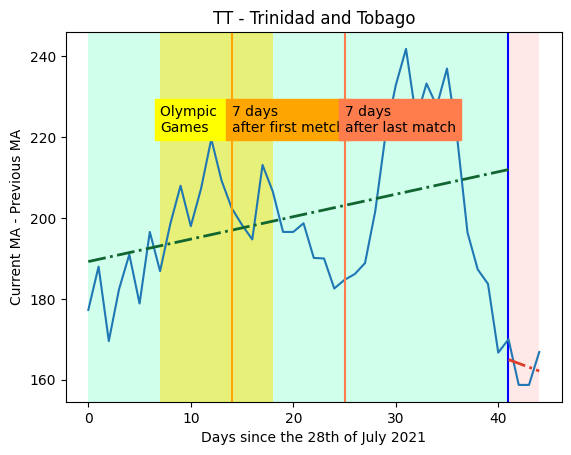

Trend negativo
La percentuale di cambiamento è: 31322.27%
 
-0.8392 x + 63.62   [ 0  1  2  3  4  5  6  7  8  9 10 11 12]   range(0, 13)   #116530
 
262 x - 1455   [12 13 14 15 16 17 18 19 20]   range(12, 21)   #D7A449
 
-8.814 x + 386.4   [20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35]   range(20, 36)   #DB3F29


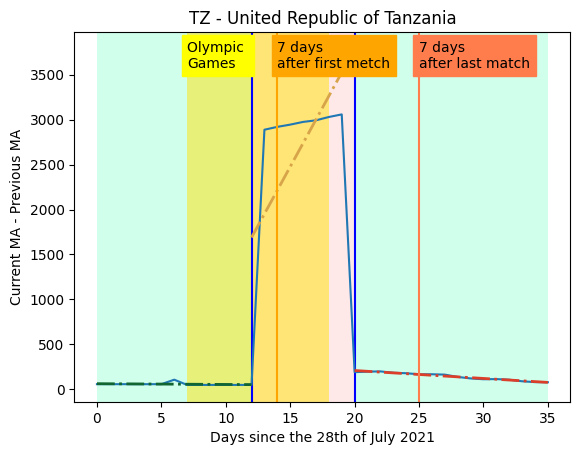

Trend positivo
La percentuale di cambiamento è: 173.31%
 
10.73 x + 447.6   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]   range(0, 24)   #116530
 
29.34 x + 42.12   [23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(23, 45)   #DB3F29


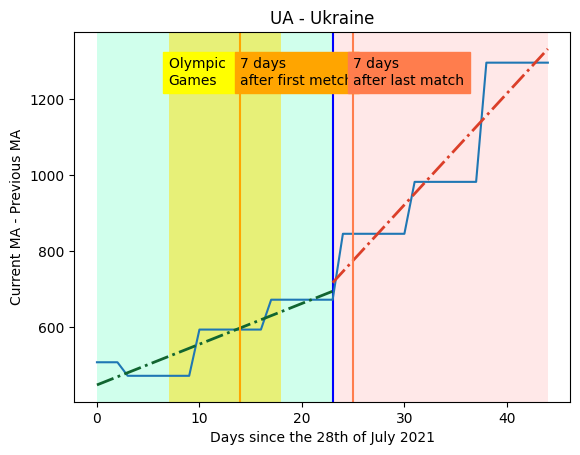

Trend negativo
La percentuale di cambiamento è: 3088.96%
 
-8.155 x + 403.9   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34]   range(0, 35)   #116530
 
243.7 x - 6405   [34 35 36 37 38 39 40 41 42]   range(34, 43)   #D7A449
 
-22.21 x + 1092   [42 43 44]   range(42, 45)   #DB3F29


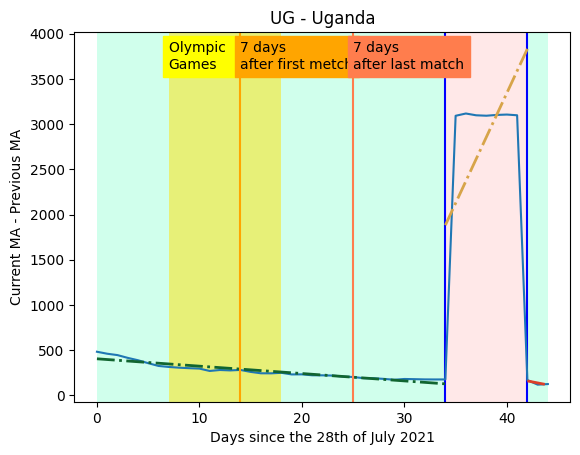

Trend positivo
La percentuale di cambiamento è: 31.29%
 
2152 x + 3.134e+04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]   range(0, 18)   #116530
 
2825 x + 3.629e+04   [17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44]   range(17, 45)   #DB3F29


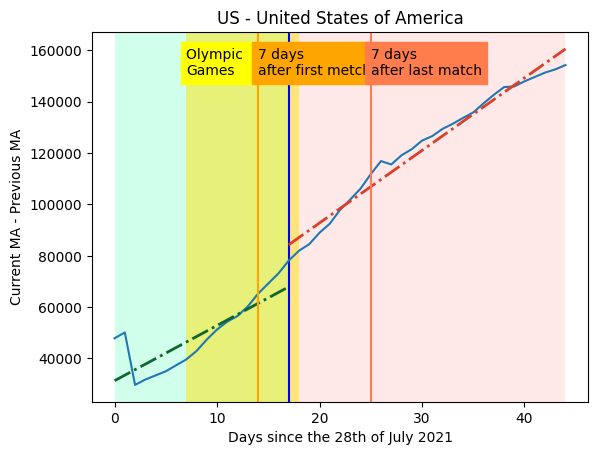

Trend negativo
La percentuale di cambiamento è: 82.26%
 
-21.82 x + 447.3   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
-7.942 x + 315   [10 11 12 13 14 15 16 17 18 19 20 21 22]   range(10, 23)   #D7A449
 
-1.409 x + 165.5   [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(22, 45)   #DB3F29


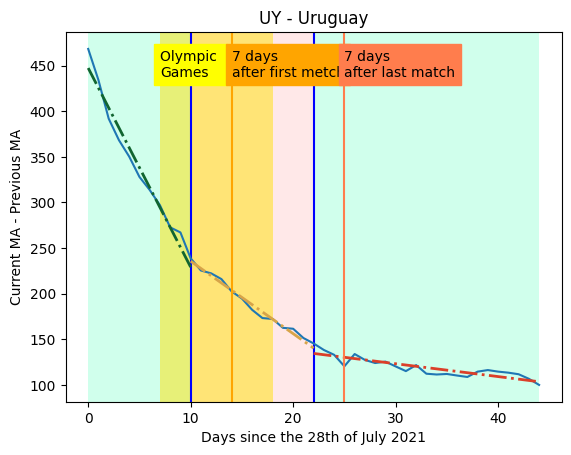

Trend positivo
La percentuale di cambiamento è: 16.56%
 
3.691 x + 482.1   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
4.302 x + 737.6   [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44]   range(10, 45)   #DB3F29


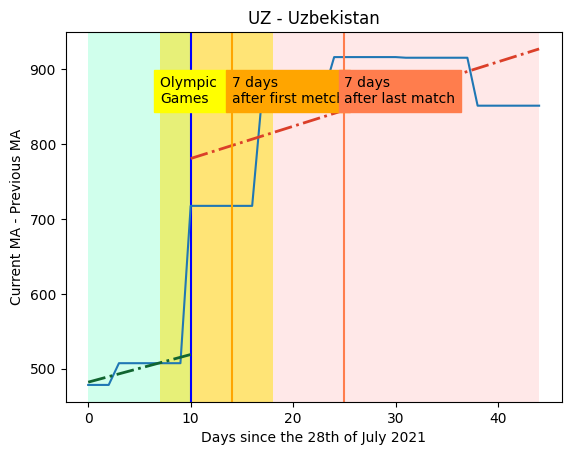

Trend positivo
La percentuale di cambiamento è: -3.51%
 
0.03618 x + 2.094   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]   range(0, 22)   #116530
 
0.03491 x + 0.2346   [21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(21, 45)   #DB3F29


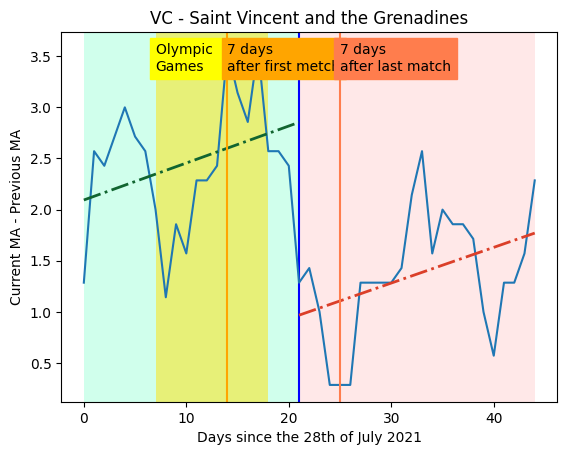

Trend negativo
La percentuale di cambiamento è: -136.17%
 
7.793 x + 1050   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
-2.819 x + 1015   [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44]   range(10, 45)   #DB3F29


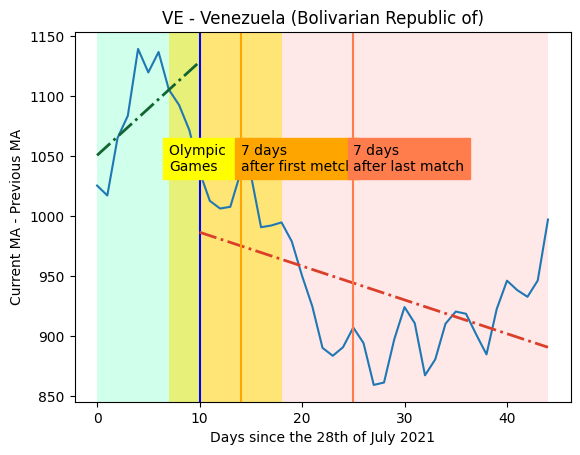

Trend negativo
La percentuale di cambiamento è: 92.76%
 
6.379 x + 101   [0 1 2 3 4 5 6 7 8]   range(0, 9)   #116530
 
-2.762 x + 73.42   [ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]   range(8, 23)   #D7A449
 
-0.2 x + 9.779   [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]   range(22, 41)   #DB3F29


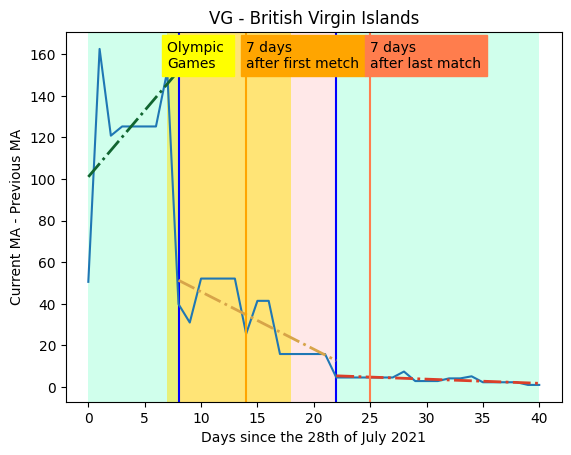

Trend positivo
La percentuale di cambiamento è: -76.85%
 
0.5735 x + 20.04   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]   range(0, 17)   #116530
 
0.1328 x + 39.64   [16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39
 40 41 42 43 44]   range(16, 45)   #DB3F29


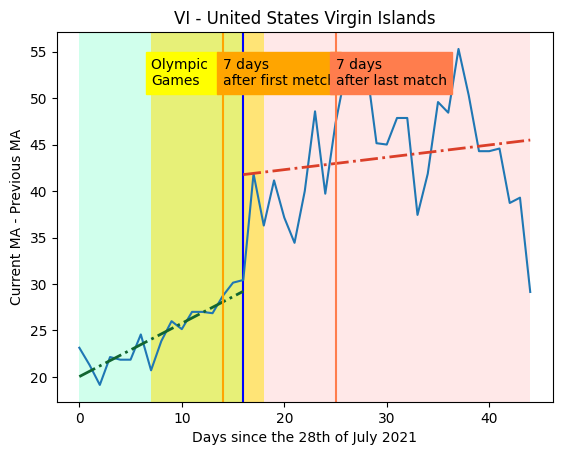

Trend positivo
La percentuale di cambiamento è: -68.84%
 
413.3 x + 2372   [ 0  1  2  3  4  5  6  7  8  9 10]   range(0, 11)   #116530
 
128.8 x + 5381   [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
 34 35 36 37 38 39 40 41 42 43 44]   range(10, 45)   #DB3F29


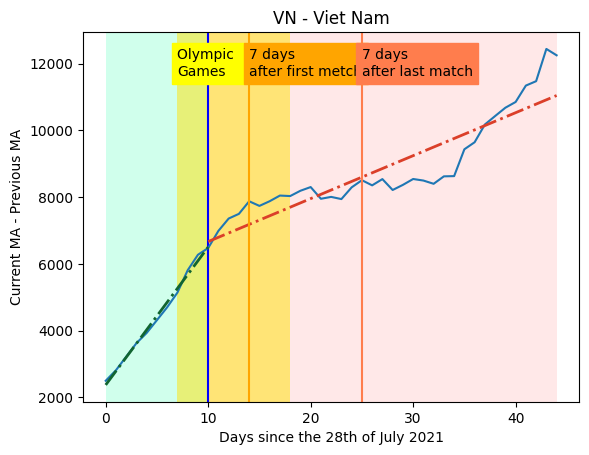

Trend positivo
La percentuale di cambiamento è: 87.10%
 
0.03054 x + 1.908   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]   range(0, 41)   #116530
 
0.05714 x - 1.171   [40 41 42 43 44]   range(40, 45)   #DB3F29


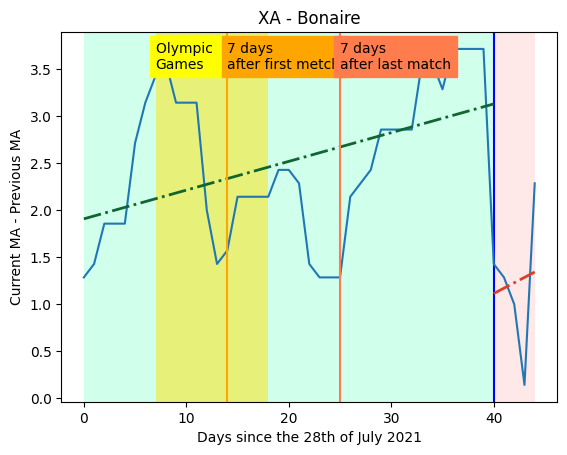

Error in  ** On entry to DLASCLS parameter number  4 had an illegal value
 XB
Error in  ** On entry to DLASCLS parameter number  4 had an illegal value
 XC
Trend positivo
La percentuale di cambiamento è: 701451.16%
 
0.009524 x + 7.819   [0 1 2 3 4 5 6 7 8 9]   range(0, 10)   #116530
 
66.81 x - 1075   [ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32
 33 34 35 36 37 38 39 40 41 42 43 44]   range(9, 45)   #DB3F29


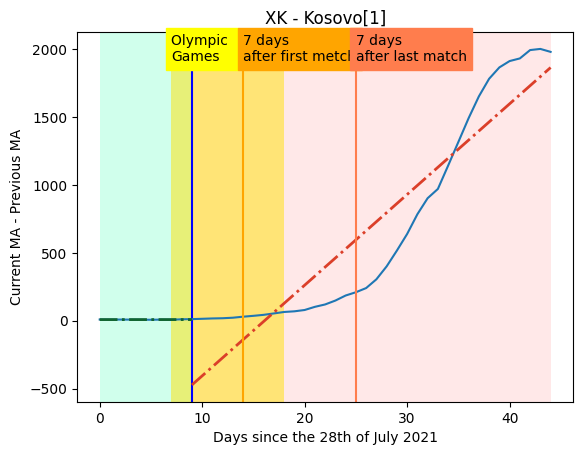

Trend positivo
La percentuale di cambiamento è: 3087.57%
 
-0.03673 x + 4.762   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]   range(0, 16)   #116530
 
1.097 x - 13.13   [15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38
 39 40 41 42 43 44]   range(15, 45)   #DB3F29


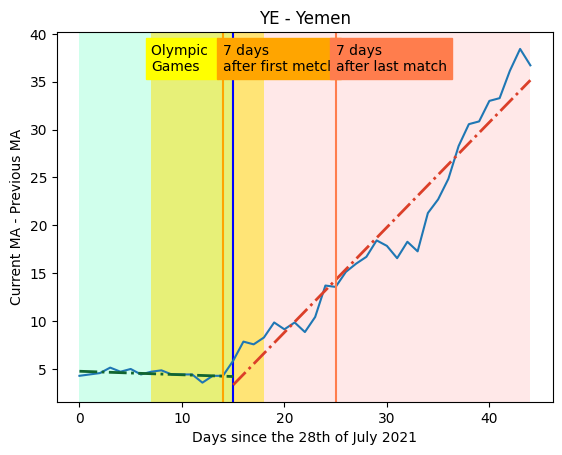

Trend positivo
La percentuale di cambiamento è: 374.48%
 
-0.1366 x + 3.204   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]   range(0, 15)   #116530
 
0.3749 x - 3.093   [14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44]   range(14, 45)   #DB3F29


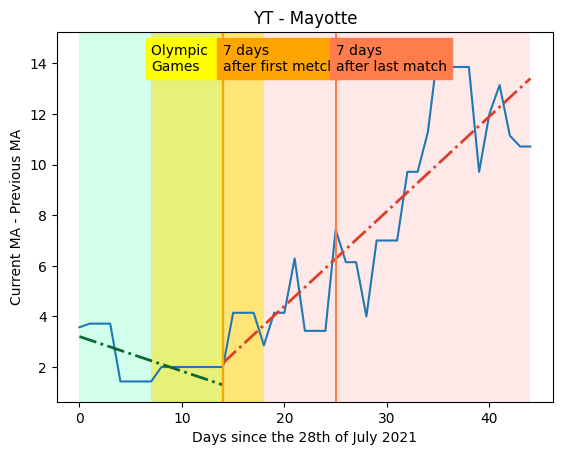

Trend negativo
La percentuale di cambiamento è: 98.31%
 
-845.4 x + 1.767e+04   [0 1 2 3 4 5 6]   range(0, 7)   #116530
 
-14.25 x + 1.18e+04   [ 6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29
 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(6, 45)   #DB3F29


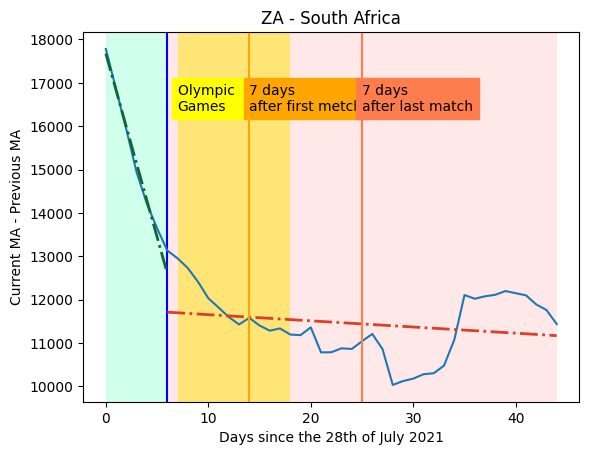

Trend negativo
La percentuale di cambiamento è: 87.12%
 
-40.79 x + 1473   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]   range(0, 31)   #116530
 
-5.253 x + 495.8   [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(30, 45)   #DB3F29


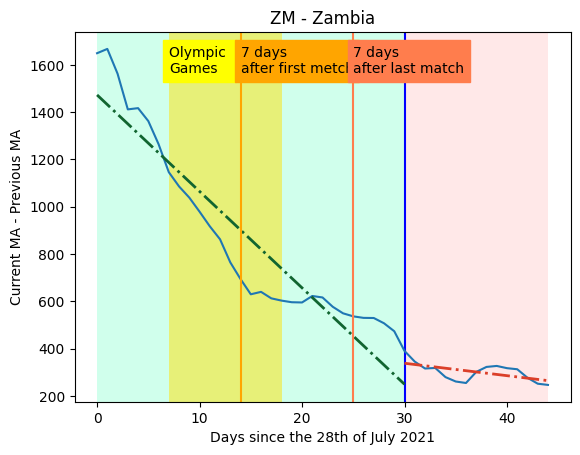

Trend negativo
La percentuale di cambiamento è: 56.62%
 
-54.68 x + 2504   [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]   range(0, 28)   #116530
 
-23.72 x + 1306   [27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]   range(27, 45)   #DB3F29


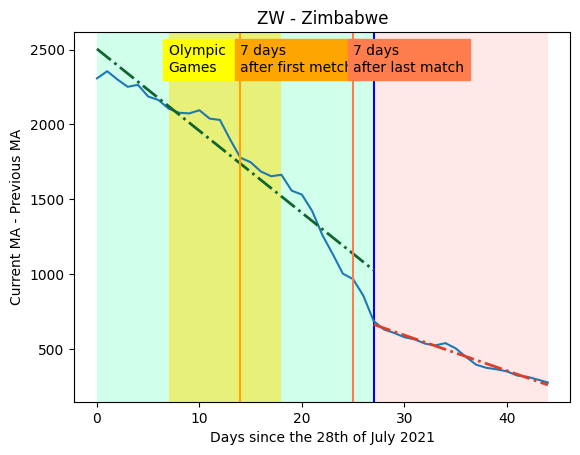

In [175]:
#Change point detection with Bayesian Offline

BayesOffline = c.BayesOffline()
media_changepoint = 0.0
count_changepoint = 0.0
min_changepoint = (999,"error")
max_changepoint = (-1,"error")
save_me = []
tabella = pd.DataFrame(columns=['State','Iso_code', 'FirstSlope','SecondSlope','when'])
trend_negative = []
trend_positive = []
percentage_country_trend = []

for code in all_iso_codes:    
    # Out is a list of possible changepoint "indices"
    values = dataframe.loc[code]['moving_average_new_cases'].values

    prob = 0.9
    out = []
    plot_out = []
    
    while len(out) == 0:
        prob = prob * 0.9
        out = BayesOffline.find_changepoints(values, prob_threshold=prob)
    
    #print("OUT", out, 'VALUES', values)
    
    
    try:
        if len(out) == 1:
            i = out[0]
            zed = np.polyfit(range(0,i), values[:i], 1)
            p = np.poly1d(zed)
            zed2 = np.polyfit(range(i,len(values)), values[i:], 1)
            p2 = np.poly1d(zed2)
            plot_out = [[p,np.arange(0,i+1),range(0,i+1),"#116530"],[p2,np.arange(i,len(values)),range(i,len(values)),"#DB3F29"]]
            entry = pd.DataFrame.from_dict({"State": dataframe.loc[code]['Country'].unique()[0], 'Iso_code': [code],'FirstSlope': [zed[0]],'SecondSlope': [zed2[0]],'when': [out[0]]})
            
            if zed2[0] >= 0:
                print("Trend positivo")
                trend_positive.append(code)
            else:
                print("Trend negativo")
                trend_negative.append(code)
            
            # calcola la percentuale di cambiamento del trend dopo i change point
            percentage_after_game = ((zed2[0] - zed[0]) / abs(zed[0])) * 100
            print(f"La percentuale di cambiamento è: {percentage_after_game:.2f}%")
            percentage_country_trend.append((code, percentage_after_game))
        
        else:
            #plot three trends from two changepoints
            i = out[0]
            j = out[1]
            zed = np.polyfit(range(0,i), values[:i], 1)
            p = np.poly1d(zed)
            zed2 = np.polyfit(range(i,j), values[i:j], 1)
            p2 = np.poly1d(zed2)
            zed3 = np.polyfit(range(j,len(values)), values[j:], 1)
            p3 = np.poly1d(zed3)
            plot_out = [[p,np.arange(0,i+1),range(0,i+1),"#116530"],[p2,np.arange(i,j+1),range(i,j+1),"#D7A449"],[p3,np.arange(j,len(values)),range(j,len(values)),"#DB3F29"]]
            entry = pd.DataFrame.from_dict({"State": dataframe.loc[code]['Country'].unique()[0], 'Iso_code': [code],'FirstSlope': [round_half_up(zed[0])],'SecondSlope': [round_half_up(zed2[0])],'ThirdSlope': [zed3[0]]})

            # conta gli stati con trend positivo e negativo
            if zed3[0] >= 0:
                print("Trend positivo")
                trend_positive.append(code)
            else:
                print("Trend negativo")
                trend_negative.append(code)
            
            # calcola la percentuale di cambiamento del trend dopo i change point
            percentage_after_game_1 = ((zed2[0] - zed[0]) / abs(zed[0])) * 100
            percentage_after_game_2 = ((zed3[0] - zed2[0]) / abs(zed2[0])) * 100
            max_percentage = max(percentage_after_game_1, percentage_after_game_2)
            print(f"La percentuale di cambiamento è: {max_percentage:.2f}%")
            percentage_country_trend.append((code, max_percentage))
        
        
        for i in out:
            media_changepoint += i
            count_changepoint += 1
            #find minimum and maximum of the changepoints with their state
            if i < min_changepoint[0]:
                min_changepoint = (i,code)
            if i > max_changepoint[0]:
                max_changepoint = (i,code)
            save_me.append((i,code))
        
    except:
        print("Error in ", code)
        continue
    
    # Plot the data.
    for i in out:
        plt.axvline(x = i, color = 'blue', label = 'changepoint')
        
    c.plot_changepoints(values, out, segment_alpha=0.3,segment_colors=['#66ffc2', '#ffb3b3'])
    #c.plot_changepoints(values, out, segment_alpha=0.3)
    
    lw = 2
    tabella = pd.concat([tabella, entry], ignore_index=True)
    for p in plot_out:
        print(p[0]," ", p[1], " ", p[2], " ", p[3])
        plt.plot(p[1], p[0](p[2]), color=p[3], linewidth=lw, linestyle="dashdot")

    
    
    # Crea un plot con i punti di cambio colorati
    plt.title(code + " - " + dataframe.loc[code]['Country'].unique()[0])
    plt.axvline(x = difference.days+7, color = 'orange', label = '7 days after first game of olympic games')
    plt.axvline(x = difference.days+18, color = '#FF7D4D', label = '7 days after last game of olympic games')
    plt.xlabel("Days since the 28th of July 2021")
    plt.ylabel("Current MA - Previous MA")
    #plt.legend()
    plt.axvspan(difference.days, difference.days+11, facecolor='#ffe206', alpha=0.5)
    ymax = plt.ylim()[1]
    plt.text(difference.days, ymax*0.9, "Olympic \nGames", rotation=0, color="black", backgroundcolor="yellow")
    plt.text(difference.days+7, ymax*0.9, "7 days \nafter first metch", rotation=0, backgroundcolor="orange")
    plt.text(difference.days+18, ymax*0.9, "7 days \nafter last match", rotation=0, backgroundcolor="#FF7D4D")
    
    #save the plot as a png file
    plt.savefig("../pictures/"+ code + "_changepoint" +".png")
    plt.show()

In [176]:
#aggiungi alla riga attuale nella colonna iso_code il valore iso
convert_ISO_3166_2_to_1 = {
    'AF':'AFG',
    'AX':'ALA',
    'AL':'ALB',
    'DZ':'DZA',
    'AS':'ASM',
    'AD':'AND',
    'AO':'AGO',
    'AI':'AIA',
    'AQ':'ATA',
    'AG':'ATG',
    'AR':'ARG',
    'AM':'ARM',
    'AW':'ABW',
    'AU':'AUS',
    'AT':'AUT',
    'AZ':'AZE',
    'BS':'BHS',
    'BH':'BHR',
    'BD':'BGD',
    'BB':'BRB',
    'BY':'BLR',
    'BE':'BEL',
    'BZ':'BLZ',
    'BJ':'BEN',
    'BM':'BMU',
    'BT':'BTN',
    'BO':'BOL',
    'BA':'BIH',
    'BW':'BWA',
    'BV':'BVT',
    'BR':'BRA',
    'IO':'IOT',
    'BN':'BRN',
    'BG':'BGR',
    'BF':'BFA',
    'BI':'BDI',
    'KH':'KHM',
    'CM':'CMR',
    'CA':'CAN',
    'CV':'CPV',
    'KY':'CYM',
    'CF':'CAF',
    'TD':'TCD',
    'CL':'CHL',
    'CN':'CHN',
    'CX':'CXR',
    'CC':'CCK',
    'CO':'COL',
    'KM':'COM',
    'CG':'COG',
    'CD':'COD',
    'CK':'COK',
    'CR':'CRI',
    'CI':'CIV',
    'HR':'HRV',
    'CU':'CUB',
    'CY':'CYP',
    'CZ':'CZE',
    'DK':'DNK',
    'DJ':'DJI',
    'DM':'DMA',
    'DO':'DOM',
    'EC':'ECU',
    'EG':'EGY',
    'SV':'SLV',
    'GQ':'GNQ',
    'ER':'ERI',
    'EE':'EST',
    'ET':'ETH',
    'FK':'FLK',
    'FO':'FRO',
    'FJ':'FJI',
    'FI':'FIN',
    'FR':'FRA',
    'GF':'GUF',
    'PF':'PYF',
    'TF':'ATF',
    'GA':'GAB',
    'GM':'GMB',
    'GE':'GEO',
    'DE':'DEU',
    'GH':'GHA',
    'GI':'GIB',
    'GR':'GRC',
    'GL':'GRL',
    'GD':'GRD',
    'GP':'GLP',
    'GU':'GUM',
    'GT':'GTM',
    'GG':'GGY',
    'GN':'GIN',
    'GW':'GNB',
    'GY':'GUY',
    'HT':'HTI',
    'HM':'HMD',
    'VA':'VAT',
    'HN':'HND',
    'HK':'HKG',
    'HU':'HUN',
    'IS':'ISL',
    'IN':'IND',
    'ID':'IDN',
    'IR':'IRN',
    'IQ':'IRQ',
    'IE':'IRL',
    'IM':'IMN',
    'IL':'ISR',
    'IT':'ITA',
    'JM':'JAM',
    'JP':'JPN',
    'JE':'JEY',
    'JO':'JOR',
    'KZ':'KAZ',
    'KE':'KEN',
    'KI':'KIR',
    'KP':'PRK',
    'KR':'KOR',
    'KW':'KWT',
    'KG':'KGZ',
    'LA':'LAO',
    'LV':'LVA',
    'LB':'LBN',
    'LS':'LSO',
    'LR':'LBR',
    'LY':'LBY',
    'LI':'LIE',
    'LT':'LTU',
    'LU':'LUX',
    'MO':'MAC',
    'MK':'MKD',
    'MG':'MDG',
    'MW':'MWI',
    'MY':'MYS',
    'MV':'MDV',
    'ML':'MLI',
    'MT':'MLT',
    'MH':'MHL',
    'MQ':'MTQ',
    'MR':'MRT',
    'MU':'MUS',
    'YT':'MYT',
    'MX':'MEX',
    'FM':'FSM',
    'MD':'MDA',
    'MC':'MCO',
    'MN':'MNG',
    'ME':'MNE',
    'MS':'MSR',
    'MA':'MAR',
    'MZ':'MOZ',
    'MM':'MMR',
    'NA':'NAM',
    'NR':'NRU',
    'NP':'NPL',
    'NL':'NLD',
    'AN':'ANT',
    'NC':'NCL',
    'NZ':'NZL',
    'NI':'NIC',
    'NE':'NER',
    'NG':'NGA',
    'NU':'NIU',
    'NF':'NFK',
    'MP':'MNP',
    'NO':'NOR',
    'OM':'OMN',
    'PK':'PAK',
    'PW':'PLW',
    'PS':'PSE',
    'PA':'PAN',
    'PG':'PNG',
    'PY':'PRY',
    'PE':'PER',
    'PH':'PHL',
    'PN':'PCN',
    'PL':'POL',
    'PT':'PRT',
    'PR':'PRI',
    'QA':'QAT',
    'RE':'REU',
    'RO':'ROU',
    'RU':'RUS',
    'RW':'RWA',
    'BL':'BLM',
    'SH':'SHN',
    'KN':'KNA',
    'LC':'LCA',
    'MF':'MAF',
    'PM':'SPM',
    'VC':'VCT',
    'WS':'WSM',
    'SM':'SMR',
    'ST':'STP',
    'SA':'SAU',
    'SN':'SEN',
    'RS':'SRB',
    'SC':'SYC',
    'SL':'SLE',
    'SG':'SGP',
    'SK':'SVK',
    'SI':'SVN',
    'SB':'SLB',
    'SO':'SOM',
    'ZA':'ZAF',
    'GS':'SGS',
    'ES':'ESP',
    'LK':'LKA',
    'SD':'SDN',
    'SR':'SUR',
    'SJ':'SJM',
    'SZ':'SWZ',
    'SE':'SWE',
    'CH':'CHE',
    'SY':'SYR',
    'TW':'TWN',
    'TJ':'TJK',
    'TZ':'TZA',
    'TH':'THA',
    'TL':'TLS',
    'TG':'TGO',
    'TK':'TKL',
    'TO':'TON',
    'TT':'TTO',
    'TN':'TUN',
    'TR':'TUR',
    'TM':'TKM',
    'TC':'TCA',
    'TV':'TUV',
    'UG':'UGA',
    'UA':'UKR',
    'AE':'ARE',
    'GB':'GBR',
    'US':'USA',
    'UM':'UMI',
    'UY':'URY',
    'UZ':'UZB',
    'VU':'VUT',
    'VE':'VEN',
    'VN':'VNM',
    'VG':'VGB',
    'VI':'VIR',
    'WF':'WLF',
    'EH':'ESH',
    'YE':'YEM',
    'ZM':'ZMB',
    'ZW':'ZWE'
}

In [193]:
print(len(percentage_country_trend))
df_population = pd.read_csv("../data/owid-covid-data.csv")
weighted_average = 0
total_population = 0
for i in percentage_country_trend:
    if i[0] not in convert_ISO_3166_2_to_1:
        #print(i[1] , "NOT FOUND")
        continue
    iso = convert_ISO_3166_2_to_1[i[0]]
    #print(i[1], iso)
    population = df_population.loc[df_population['iso_code'] == iso]['population'].values[0]
    total_population += population
    weighted_average += (i[1] * population)

weighted_average = ((weighted_average / total_population))/len(percentage_country_trend)

print("La media pesata delle percentuali di cambiamento del trend dopo i change point in base alla popolazione è: " + str(weighted_average))

206
La media pesata delle percentuali di cambiamento del trend dopo i change point in base alla popolazione è: 8967574258805.207


In [178]:
print("Media: " + str(media_changepoint/count_changepoint))
print("Count: " + str(count_changepoint))
print("Difference: " + str(difference.days))
print("Minimum: " + str(min_changepoint))
print("Maximum: " + str(max_changepoint))

print("Trend positivi: " + str(len(trend_positive)))
print("paesi con trend positivo: " + str(trend_positive))
print("Trend negativi: " + str(len(trend_negative)))
print("paesi con trend negativo: " + str(trend_negative))

#stampa lo stato con la percentuale di cambiamento del trend piu bassa e piu alta
print("Stato con il trend piu basso: " + str(min(percentage_country_trend, key=lambda x: x[1])))
print("Stato con il trend piu alto: " + str(max(percentage_country_trend, key=lambda x: x[1])))

#fai la media pesata delle percentuali di cambiamento del trend dopo i change point in base alla popolazione, e stampa la percentuale media di peggiornamento del trend


Media: 20.716216216216218
Count: 222.0
Difference: 7
Minimum: (3, 'GG')
Maximum: (42, 'UG')
Trend positivi: 129
paesi con trend positivo: ['AG', 'AI', 'AL', 'AM', 'AO', 'AT', 'AU', 'AW', 'AZ', 'BA', 'BB', 'BE', 'BF', 'BG', 'BI', 'BJ', 'BM', 'BN', 'BS', 'BY', 'BZ', 'CA', 'CF', 'CG', 'CH', 'CI', 'CM', 'CR', 'CU', 'CV', 'CZ', 'DE', 'DJ', 'DM', 'EE', 'EG', 'ET', 'FI', 'FR', 'GA', 'GB', 'GD', 'GE', 'GF', 'GG', 'GP', 'GQ', 'GR', 'GT', 'GU', 'GW', 'GY', 'HN', 'HR', 'HU', 'IE', 'IL', 'IN', 'IR', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KM', 'KN', 'KR', 'KY', 'LA', 'LB', 'LC', 'LI', 'LK', 'LT', 'LV', 'MA', 'MD', 'ME', 'MF', 'MK', 'ML', 'MN', 'MP', 'MU', 'MX', 'MY', 'NE', 'NG', 'NI', 'NO', 'NZ', 'PF', 'PG', 'PH', 'PL', 'PR', 'PS', 'QA', 'RO', 'RS', 'SC', 'SE', 'SI', 'SK', 'SM', 'SO', 'SR', 'SS', 'ST', 'SV', 'SX', 'SY', 'SZ', 'TC', 'TG', 'TH', 'TL', 'TR', 'UA', 'US', 'UZ', 'VC', 'VI', 'VN', 'XA', 'XK', 'YE', 'YT']
Trend negativi: 77
paesi con trend negativo: ['AD', 'AE', 'AF', 'AR', 'BD', 'BH', 'BL',

KeyError: 'population'

In [ ]:
#tabella is the table for changepoints and tabella2 is the table for the intervals
tabella.set_index(tabella['State'])
tabella.to_csv("./tabella.csv", index=False)